In [1]:

!git clone https://github.com/miguel-fc/Neutron_Reflect.git

fatal: destination path 'Neutron_Reflect' already exists and is not an empty directory.


In [2]:
cd Neutron_Reflect/

/global/u1/q/qubri000/Neutron_Reflect


In [3]:
pip install --upgrade pip

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install gdown

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install seaborn

In [ ]:
pip install plotly

In [ ]:
pip install -U --no-cache-dir gdown --pre

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torchvision.datasets as datasets
import numpy as np
import data_preparation as dpre
import io
import os
# import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
%matplotlib inline
import seaborn as sea

In [ ]:
# !gdown "https://drive.google.com/uc?id=1owU_GVw9u_7s_XTMPTohZ52DT-lraZIJ"
# !gdown "https://drive.google.com/uc?id=16MGkA93jQizNmJuQh8dYdg26-WNuuzii"
# curves_nr = np.load('NR-SLD_CurvesSAMEPoly2D18000.npy')
# curves_SLD = np.load('SLD_CurvesSAMEPoly2D18000.npy')
# curves_nr.shape, curves_SLD.shape
# These are the original files where the range was much bigger.

In [ ]:
# !gdown "https://drive.google.com/uc?id=10isqT7j_BjxK7Hs7PUwIdlvpgrV0P9Y5"
# !gdown "https://drive.google.com/uc?id=1p2fvuE_GG0d-AWM-4jF6ehldup6Das0d"
# curves_nr = np.load("NR-SLD_CurvesSAMEPoly2DExperiment40000POINTS.npy")
# curves_SLD = np.load("SLD_CurvesSAMEPoly2DExperiment40000POINTS.npy")

# print(curves_nr1.shape)

#Rajeev, this loads in the new dataset. However, this can only be used when you run Poly Curve Generator.ipynb to generate the new dataset. I don't have a google drive link for it. Uncomment the top 4 lines if you want to use the previous dataset that does well on a couple of experimental datasets.
# curves_nr2 = np.load('../NR-SLD_CurvesPoly11.npy')
# curves_SLD2 = np.load('../SLD_CurvesPoly11.npy')
# curves_nr7 = np.load('../NR-SLD_CurvesPoly21.npy')
# curves_SLD7 = np.load('../SLD_CurvesPoly21.npy')
# curves_nr6 = np.load('../NR-SLD_CurvesPoly31.npy')
# curves_SLD6 = np.load('../SLD_CurvesPoly31.npy')
# curves_nr5 = np.load('../NR-SLD_CurvesPoly42.npy')
# curves_SLD5 = np.load('../SLD_CurvesPoly42.npy')
# curves_nr3 = np.load('../NR-SLD_CurvesPoly410.npy')
# curves_SLD3 = np.load('../SLD_CurvesPoly410.npy')
# curves_nr4 = np.load('../NR-SLD_CurvesPoly13.npy')
# curves_SLD4 = np.load('../SLD_CurvesPoly13.npy')
curves_nr = np.load('../NR-SLD_CurvesPoly11.npy')
curves_SLD = np.load('../SLD_CurvesPoly11.npy')

# curves_nr = np.vstack([curves_nr1, curves_nr2, curves_nr3, curves_nr4,curves_nr5, curves_nr6, curves_nr7])
# curves_SLD = np.vstack([curves_SLD1, curves_SLD2, curves_SLD3, curves_SLD4,curves_SLD5, curves_SLD6, curves_SLD7])

curves_nr.shape, curves_SLD.shape


In [ ]:
for x in range(curves_nr.shape[0]):
  plt.plot(curves_nr[x][0],curves_nr[x][1])
plt.xscale('log')
plt.yscale('log')

In [ ]:
curves_nr = np.log10(curves_nr)

x_points = []
y_points = []
for curve in curves_nr:
    x_points.append(curve[0])
    y_points.append(curve[1])
min_valXNR = float('inf')
min_valYNR = float('inf')
max_valXNR = -float('inf')
max_valYNR = -float('inf')
for i in range(len(y_points)):
    min_valXNR = min(min(x_points[i]), min_valXNR)
    min_valYNR = min(min(y_points[i]), min_valYNR)
    max_valXNR = max(max(x_points[i]), max_valXNR)
    max_valYNR = max(max(y_points[i]), max_valYNR)
for i in range(len(y_points)):
    for j in range(len(y_points[0])):
        x_points[i][j] -= min_valXNR
        y_points[i][j] -= min_valYNR
        x_points[i][j] /= (max_valXNR - min_valXNR)
        y_points[i][j] /= (max_valYNR - min_valYNR)
curves_nr2 = []
for i in range(len(y_points)):
    curves_nr2.append([x_points[i],y_points[i]])
curves_nr2 = np.stack(curves_nr2)
curves_nr2.shape
for x in range(curves_nr.shape[0]):
  plt.plot(curves_nr[x][0],curves_nr[x][1])

In [ ]:
for x in range(curves_nr.shape[0]):
  plt.plot(curves_SLD[x][0],curves_SLD[x][1])
# plt.xscale('log')
# plt.yscale('log')
print(curves_SLD[0])

In [ ]:
# # for i in range(curves_SLD.shape[0]):
# #     x_min = min(curves_SLD[i][0])
# #     x_max = max(curves_SLD[i][0])
# #     y_min = min(curves_SLD[i][1])
# #     y_max = max(curves_SLD[i][1])
# #     for j in range(curves_SLD.shape[2]):
# #         curves_SLD[i][0][j] -= x_min
# #         curves_SLD[i][1][j] -= y_min
# #     for j in range(curves_SLD.shape[2]):
# #         curves_SLD[i][0][j] /= (x_max-x_min)
# #         curves_SLD[i][1][j] /= (y_max-y_min)
# from copy import deepcopy
# x_points = []
# y_points = []
# for curve in curves_SLD:
#     x_points.append(curve[0].copy())
#     y_points.append(curve[1].copy())
# min_valX = float('inf')
# min_valY = float('inf')
# max_valX = -float('inf')
# max_valY= -float('inf')
# for i in range(len(y_points)):
#     min_valX = min(min(x_points[i]), min_valX)
#     min_valY = min(min(y_points[i]), min_valY)
#     max_valX = max(max(x_points[i]), max_valX)
#     max_valY = max(max(y_points[i]), max_valY)
# for i in range(len(y_points)):
#     for j in range(len(y_points[0])):
#         x_points[i][j] -= min_valX
#         y_points[i][j] -= min_valY
#         x_points[i][j] /= (max_valX - min_valX)
#         y_points[i][j] /= (max_valY - min_valY)
# curves_SLD2 = []
# for i in range(len(y_points)):
#     curves_SLD2.append([x_points[i],y_points[i]])
# curves_SLD2 = np.stack(curves_SLD2)
# curves_SLD2.shape
# for x in range(curves_nr.shape[0]):
#   plt.plot(curves_SLD[x][0],curves_SLD[x][1])

In [ ]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.layers = nn.ModuleList()
        addition = 255/12
        curr = 1
        for hdim in range(12-1):
            self.layers.append(nn.Conv1d(int(curr+0.5), int(curr+addition+0.5),51,padding=25))
            self.layers.append(nn.BatchNorm1d(int(curr+addition+0.5)))
            self.layers.append(nn.ReLU(True))
            curr += addition
        self.layers.append(nn.Conv1d(int(curr+0.5), 256, 51, padding=25))
        self.layers.append(nn.BatchNorm1d(256))
        self.layers.append(nn.ReLU(True))
#         self.conv1 = nn.Conv1d(1,13,51,padding=25)
#         self.batch1 = nn.BatchNorm1d(13)
#         self.relu1 = nn.ReLU(True)
        
#         self.conv2 = nn.Conv1d(13,25,51,padding=25)
#         self.batch2 = nn.BatchNorm1d(25)
#         self.relu2 = nn.ReLU(True)
        
#         self.conv3 = nn.Conv1d(25,38,51,padding=25)
#         self.batch3 = nn.BatchNorm1d(38)
#         self.relu3 = nn.ReLU(True)
        
#         self.conv4 = nn.Conv1d(38,50,51,padding=25) 
#         self.batch4 = nn.BatchNorm1d(50)
#         self.relu4 = nn.ReLU(True)
        
#         self.conv5 = nn.Conv1d(50,64,51,padding=25) 
#         self.batch5 = nn.BatchNorm1d(64)
#         self.relu5 = nn.ReLU(True)
        
        self.linear1 = nn.Linear(256*308,900*2)
        # self.linear2 = nn.Linear((256*308-900*2)//2+900*2,900*2)
        # self.linear2 = nn.Linear(120*308,2*308)
        # self.linear2 = nn.Linear(33*308, 2*308)
    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        # x = self.batch5(x)
        # x = self.relu5(x)
        # print(x.shape)
        x = x.reshape(x.shape[0], -1)
        x = self.linear1(x)
        # x = self.linear2(x)
        # x = self.linear2(x)
        # x = self.linear2(x)
        x = x.reshape(-1, 2, 900)
        # print(x.shape)
        return x

In [ ]:
### Define the loss function
loss_fn = torch.nn.MSELoss()
# class RMSLELoss(nn.Module):
#     def __init__(self):
#         super().__init__()
#         self.mse = nn.MSELoss()
        
#     def forward(self, pred, actual):
#         return torch.sqrt(self.mse(torch.log(pred + 1), torch.log(actual + 1)))
# loss_fn = RMSLELoss()
### Define an optimizer (both for the encoder and the decoder!)
lr= 2.15481e-05
### Set the random seed for reproducible results
torch.manual_seed(0)

#model = Autoencoder(encoded_space_dim=encoded_space_dim)

Model = CNN()
params_to_optimize = Model.parameters()

optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay= 2.6324e-05)
# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')


In [ ]:
Model.to(device)

In [ ]:
batch_size=64
R = curves_nr[:,1]

R_m = R[:,np.newaxis,:]
# Q = curves_SLD[:,1]
# Q_m = Q[:, np.newaxis,:]
xtrain, ytrain, xval, yval, xtest, ytest = \
dpre.split_input_arrays(R_m,curves_SLD, size_split=0.9)
#Prepare data files, continuation
train_dataset, valid_dataset, test_dataset, train_loader, valid_loader, test_loader = \
dpre.get_dataloaders_fromsplitarrays(xtrain,ytrain,xval,yval,xtest,ytest,batch_size=batch_size)
R_m.shape

In [19]:
## Training function
def fit(Model, device, dataloader, loss_fn, optim):
    Model.train().to(device)
    train_loss = []
    for data,label in dataloader:
        img = data
        img = img.to(device)
        label = label.to(device)
        decoded_img = Model(img)
        # print(decoded_img.shape)
        # decoded_img = decoded_img.reshape(-1,2, 308)
        loss = loss_fn(decoded_img, label)
        optim.zero_grad()
        loss.backward()
        optim.step()
        train_loss.append(loss.cpu().detach().numpy())
        # print(label, "hello")
    return np.mean(train_loss)

In [20]:
### Valid function
def val(Model, device, dataloader, loss_fn):
    Model.eval().to(device)
    with torch.no_grad(): 
        list_decoded_img = []
        list_img = []
        for  data, label in dataloader:
            img = data
            # img = img.view(img.size(0), -1).to(device) 
            # img = img[:,np.newaxis,:].to(device) 
            img = img.to(device) 
            label = label.to(device)
            decoded_img = Model(img)
            # decoded_img = decoded_img.reshape(-1,2, 308)
            list_decoded_img.append(decoded_img.cpu())
            list_img.append(label.cpu())
        list_decoded_img = torch.cat(list_decoded_img)
        list_img = torch.cat(list_img)
        # print(list_img, list_decoded_img, "vaLLLLL FUNCTION")
#         for i in range(len(list_img)):
            
        val_loss = loss_fn(list_decoded_img, list_img)
    return val_loss.data

In [21]:
def plot_outputs(Model,dataset,device,n=10):
  # print(max_valX, min_valX)
  plt.figure(figsize=(26,5.5))
  for i in range(n):
    ax = plt.subplot(2,n,i+1)
    img, label =dataset[i]
    img = img[:,np.newaxis,:].to(device) 
    #Notice that below i'm loading an image only, so it needs to be flatten
    #before entering the network
    # img = torch.flatten(img).to(device)
    # print(label[0], "hello")
    # print(img.shape)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(img)
      # decoded_img = decoded_img.reshape(-1,2, 308)
      # loss = loss_fn(decoded_img,label)
      # print('For image {}, the loss = {}'.format(i,loss.data))
    # print(label)
    # print(label.shape)
    plt.plot(label[0], label[1]) 
    if i == n//2:
      ax.set_title('Original images')
    ax = plt.subplot(2, n, i + 1 + n)
    # for j in range(len(decoded_img[0][0])):
    #     # x_points[i][j] -= min_valX
    #     decoded_img[0][0][j] *= (max_valX - min_valX)
    #     decoded_img[0][0][j] += min_valX
    #     decoded_img[0][1][j] *= (max_valY- min_valY)
    #     decoded_img[0][1][j] += min_valY
    plt.plot(decoded_img.cpu()[0][0], decoded_img.cpu()[0][1]) 
    if i == n//2:
      ax.set_title('Reconstructed images')
  plt.show()  

In [22]:
# count = 0
# # print(curves_nr.shape)
# for data, label in train_loader:
# #     print(label[0])
# #     print(label[1])
# #     print(data[0])
# #     if curves_SLD[0] == label[0]:
# #         print("hello")

# #     print(data.shape, label.shape)
#     if count >= 100:
#         break
#     plt.plot(label[0][0],label[0][1])
#     count += 1
# plt.show()

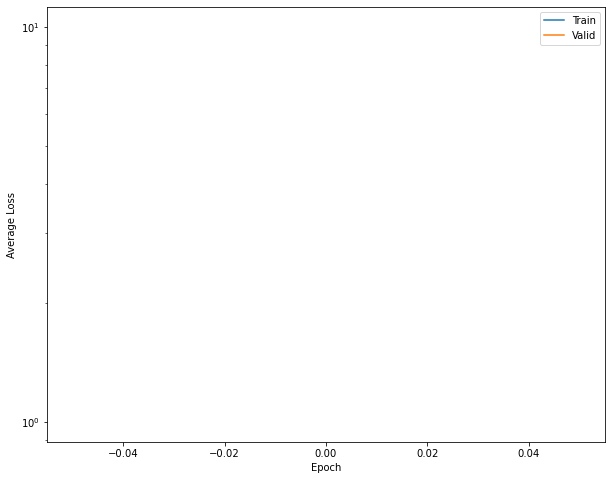

0
2226.6736
tensor(15.4733)


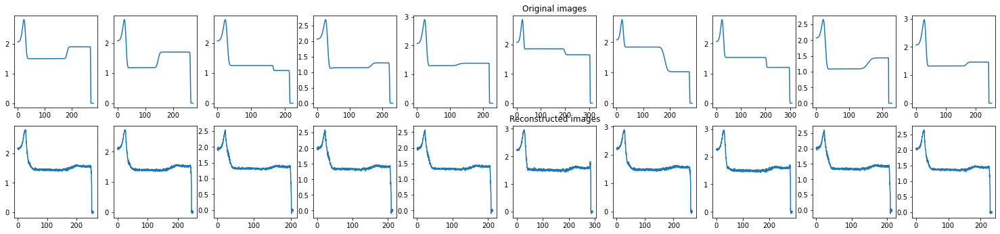

1
7.4449325
tensor(1.8751)


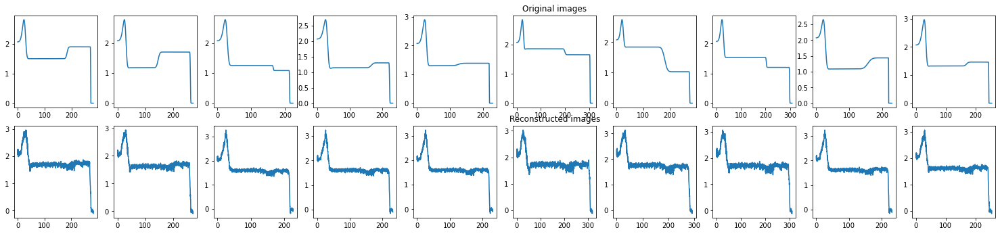

2
4.357723
tensor(73.1700)


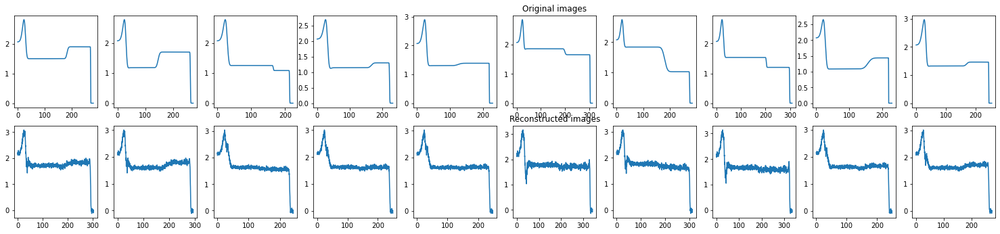

3
4.546183
tensor(1.6658)


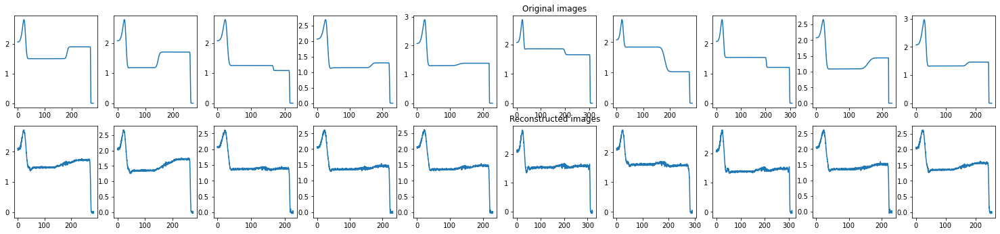

4
4.2814894
tensor(16.7795)


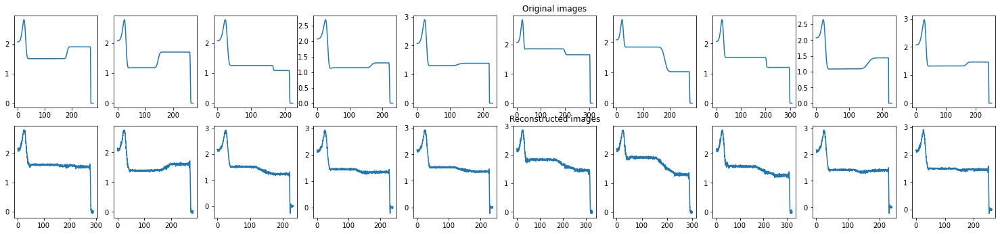

5
3.3239336
tensor(1.3468)


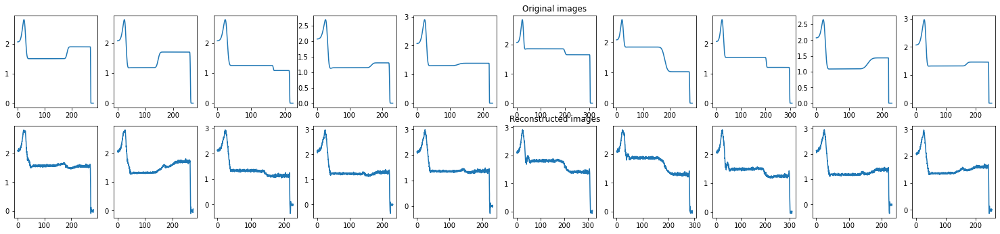

6
2.9852157
tensor(9.2107)


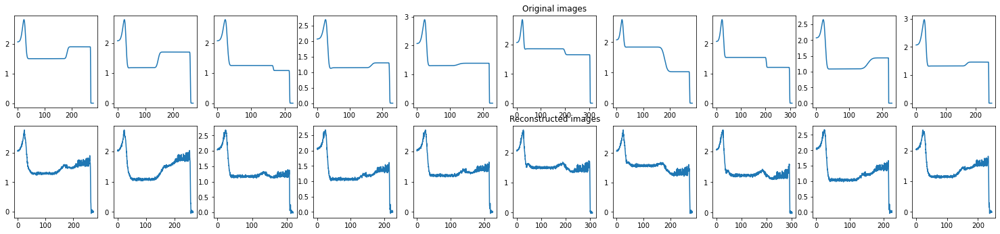

7
2.1486876
tensor(0.6519)


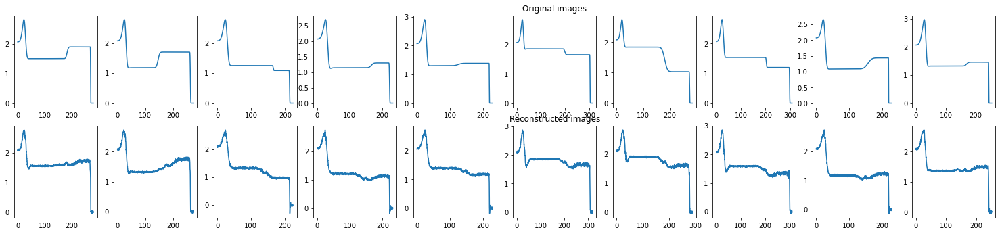

8
1.7928714
tensor(1.6719)


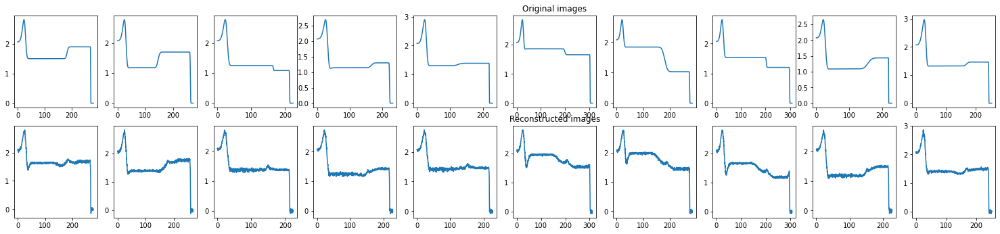

9
1.3658456
tensor(17.0786)


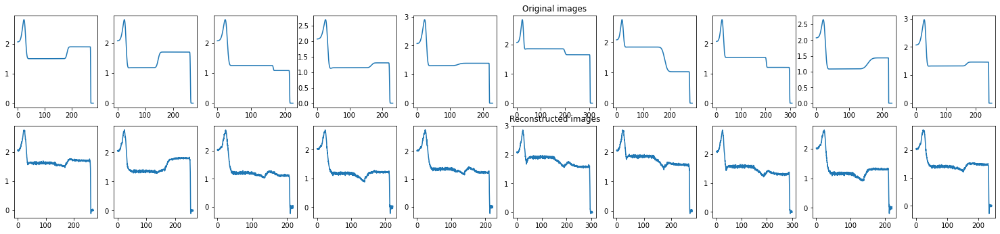

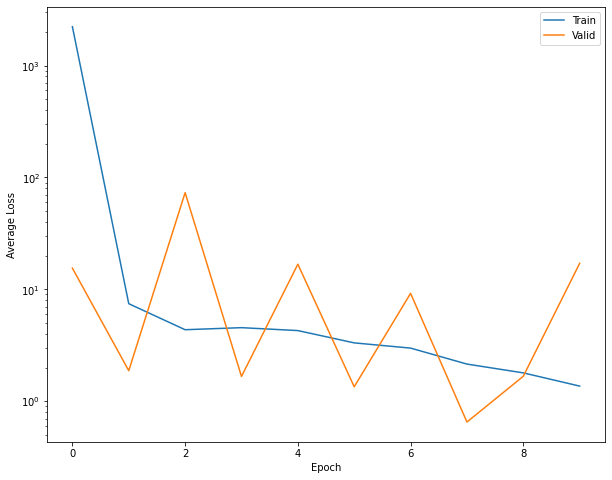

10
1.2746456
tensor(1.2127)


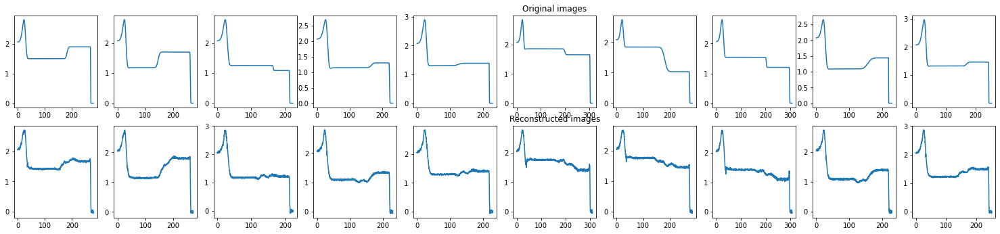

11
0.86513734
tensor(0.5415)


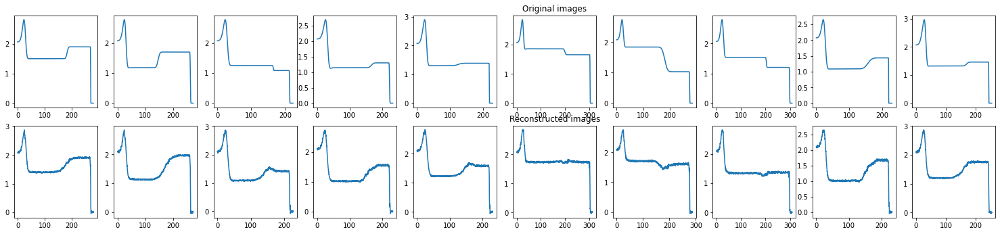

12
0.7269958
tensor(1.9322)


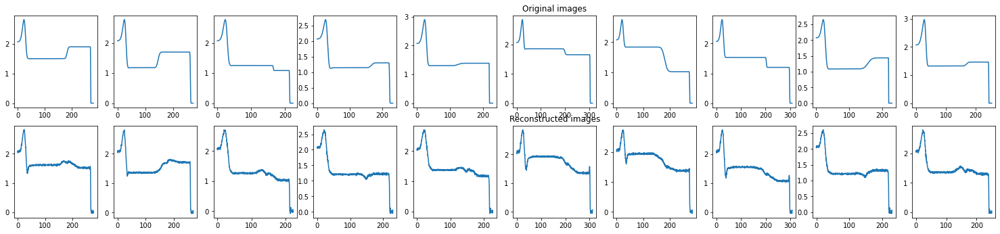

13
0.6230499
tensor(0.4139)


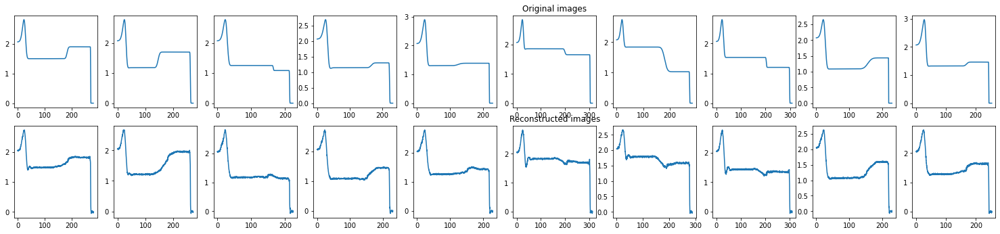

14
0.62385726
tensor(1.7204)


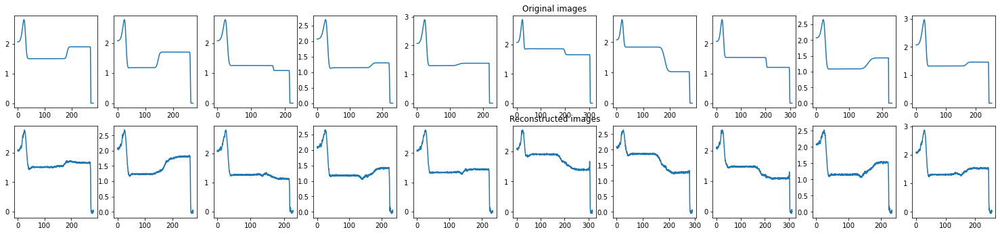

15
0.59039825
tensor(1.2596)


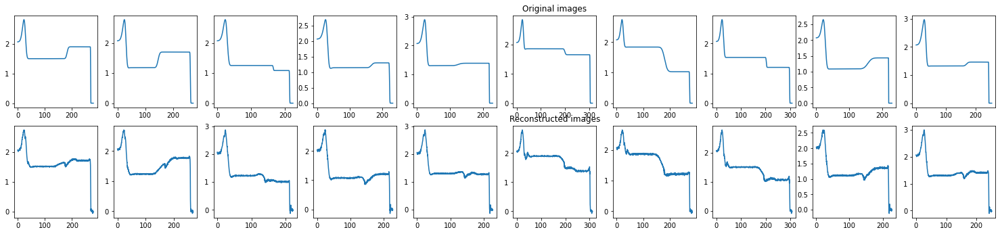

16
0.5746636
tensor(1.2210)


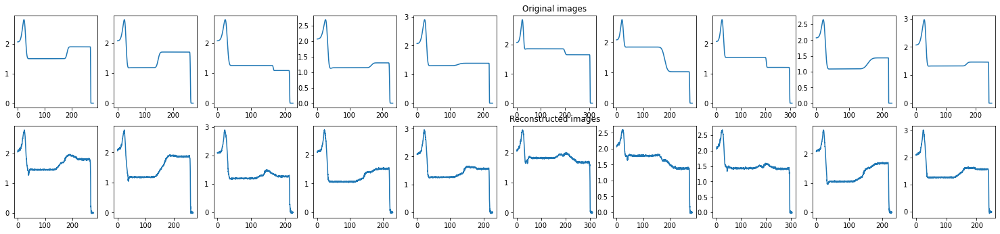

17
0.5559466
tensor(2.6958)


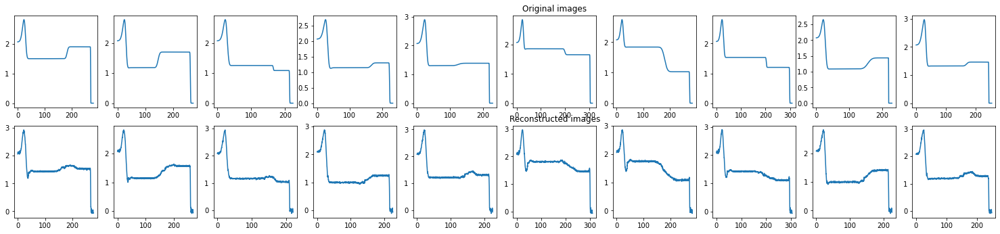

18
0.57085234
tensor(0.6634)


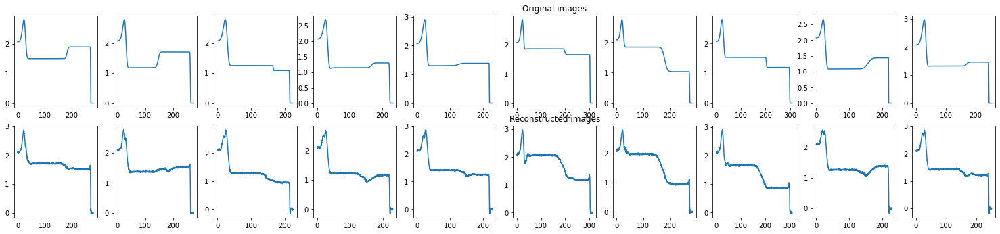

19
0.5365695
tensor(0.4883)


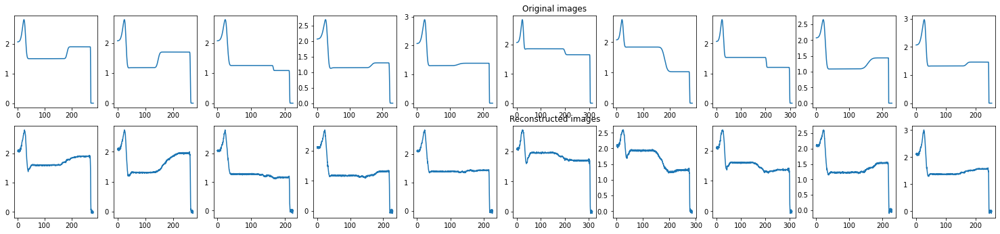

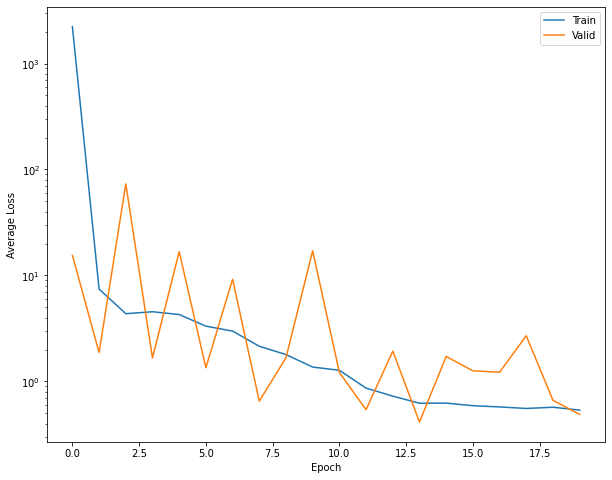

20
0.48909777
tensor(0.7155)


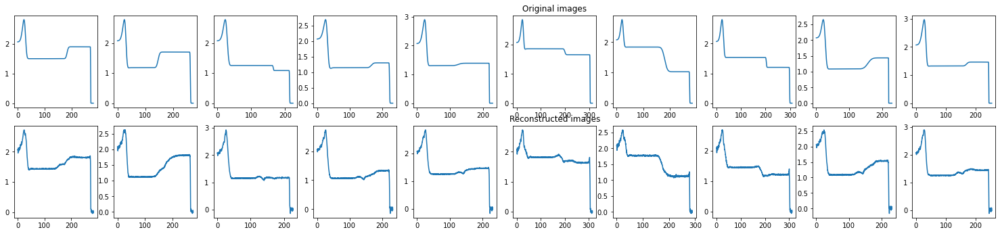

21
0.43737346
tensor(1.5840)


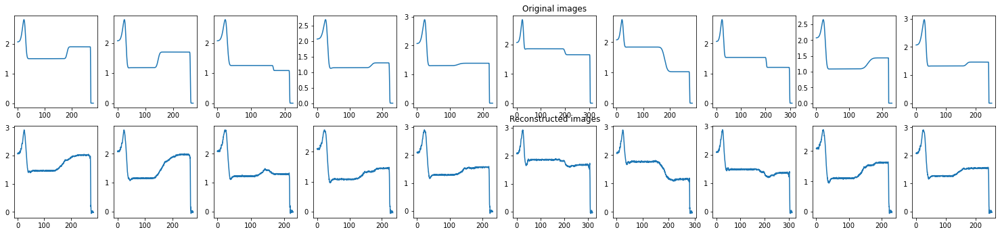

22
0.47334486
tensor(0.5931)


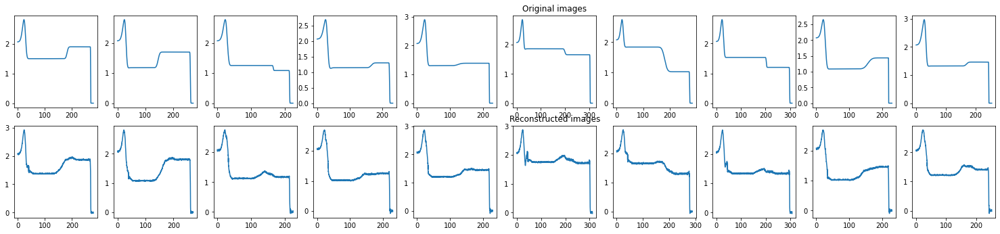

23
0.43218774
tensor(4.4189)


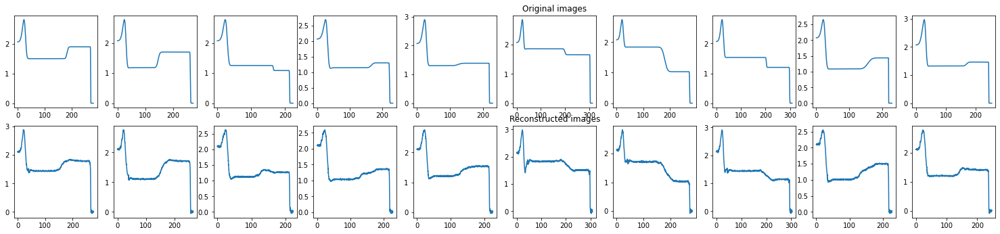

24
0.43772843
tensor(5.5065)


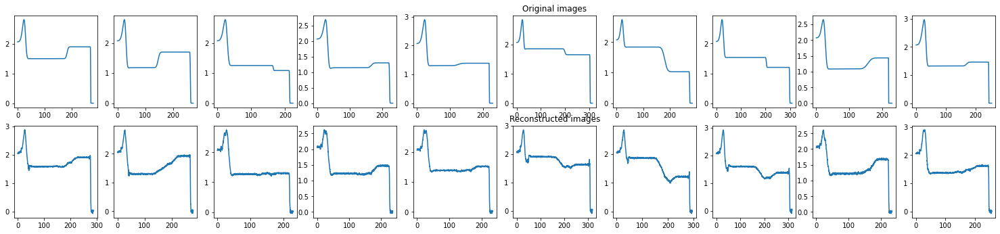

25
0.44010448
tensor(0.5107)


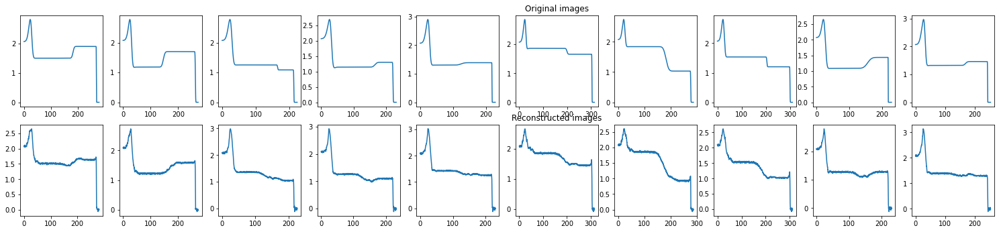

26
0.37690532
tensor(0.4865)


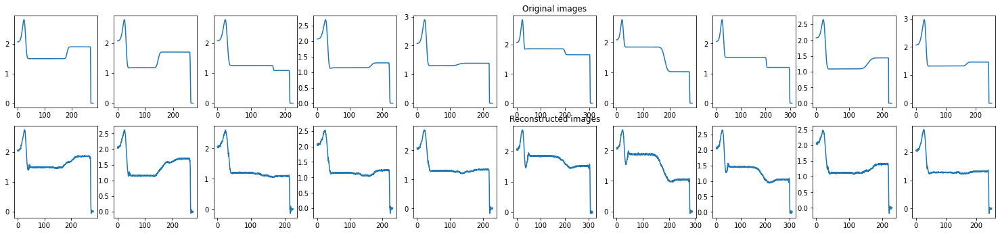

27
0.4150212
tensor(0.6619)


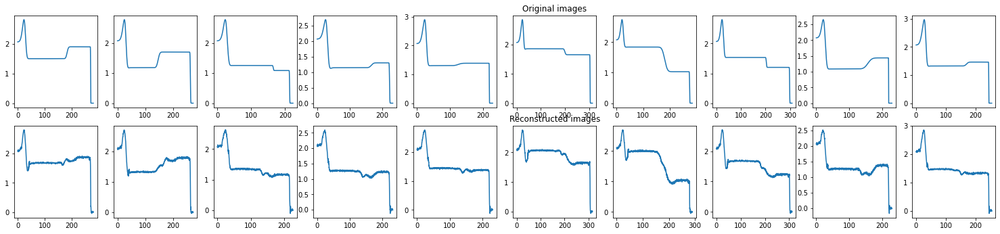

28
0.39719668
tensor(0.3327)


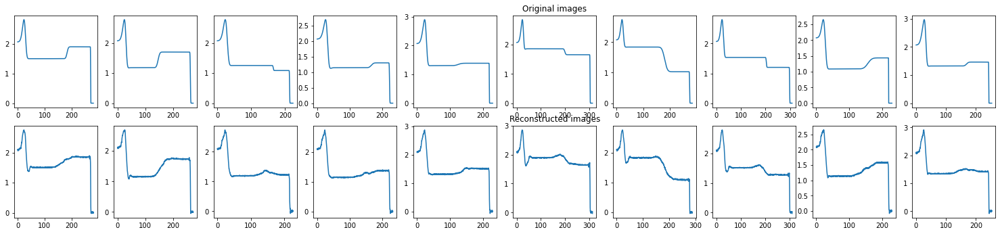

29
0.36305645
tensor(0.3274)


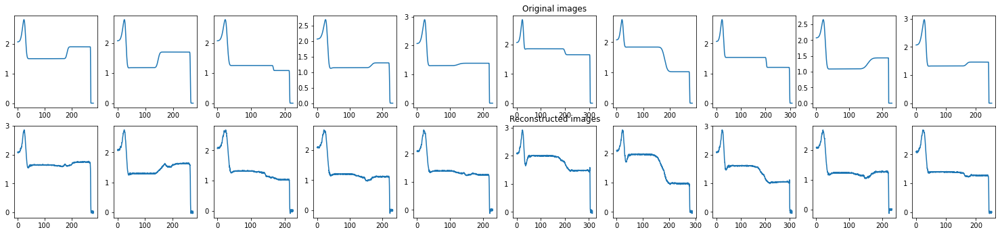

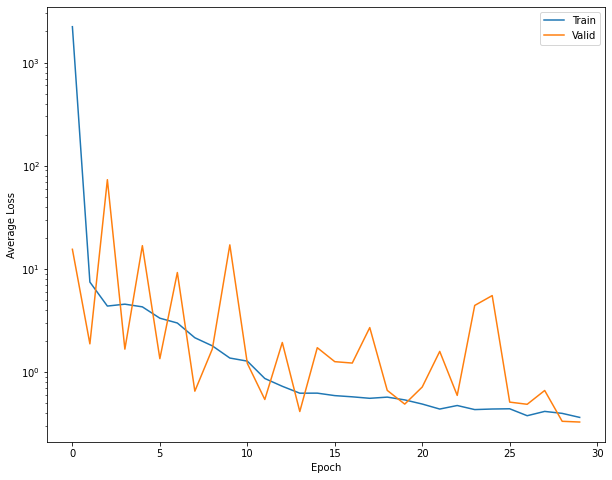

30
0.32881042
tensor(0.4387)


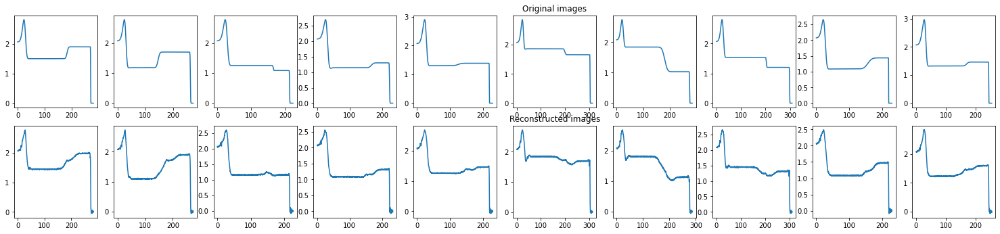

31
0.34796157
tensor(0.2528)


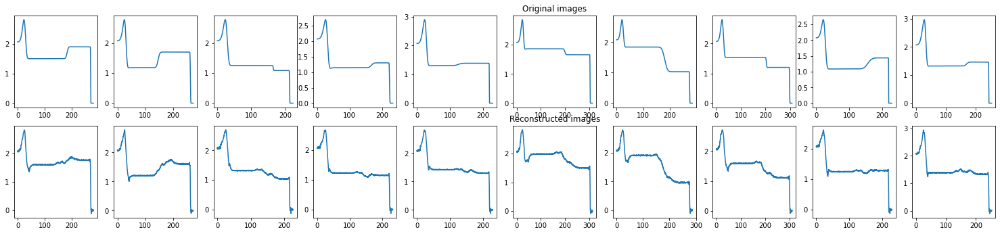

32
0.33908162
tensor(0.3051)


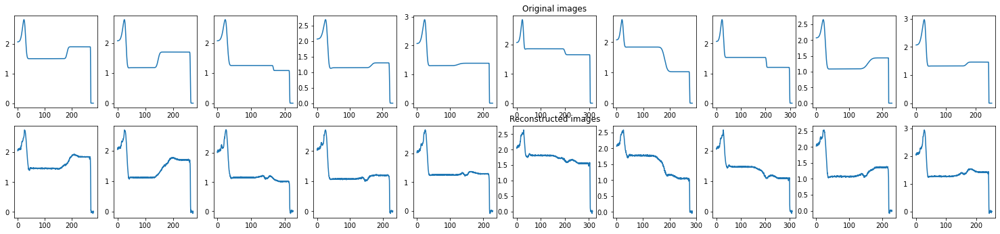

33
0.33199292
tensor(2.2830)


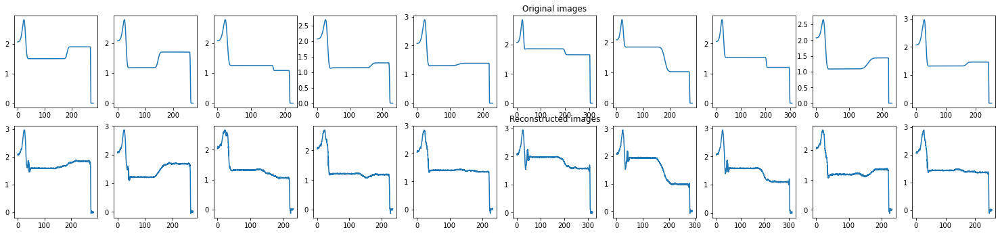

34
0.3550729
tensor(1.0838)


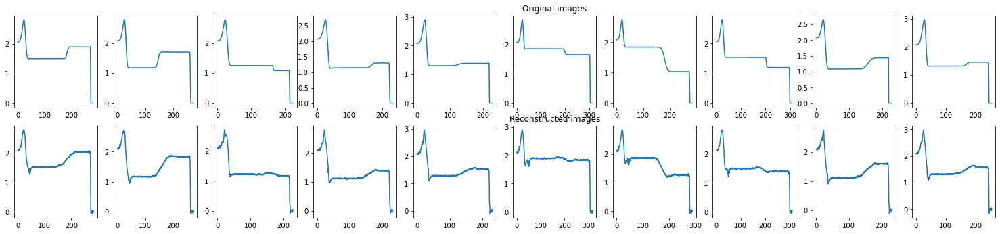

35
0.30453596
tensor(0.4964)


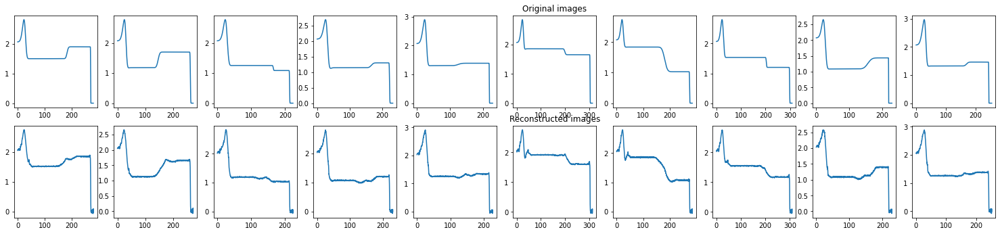

36
0.29105812
tensor(4.6032)


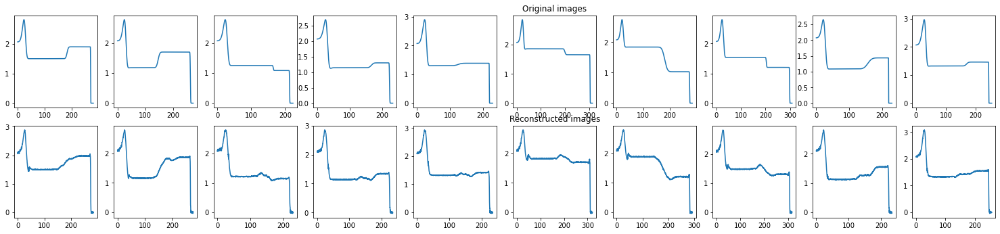

37
0.30207005
tensor(0.3005)


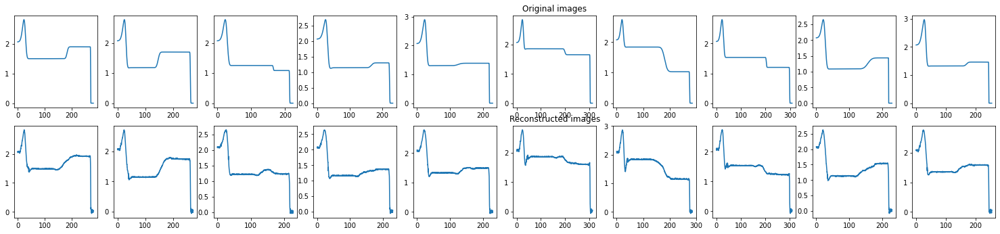

38
0.2896054
tensor(7.7392)


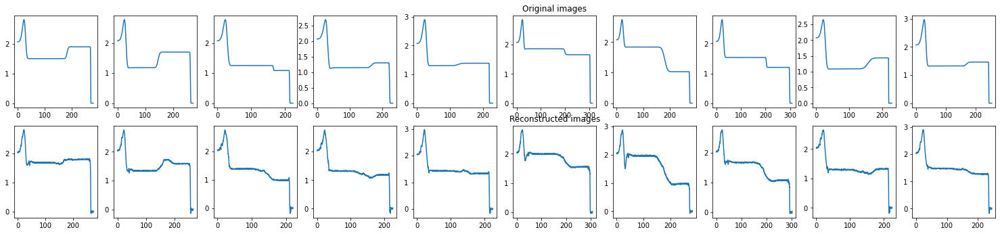

39
0.2916981
tensor(0.4925)


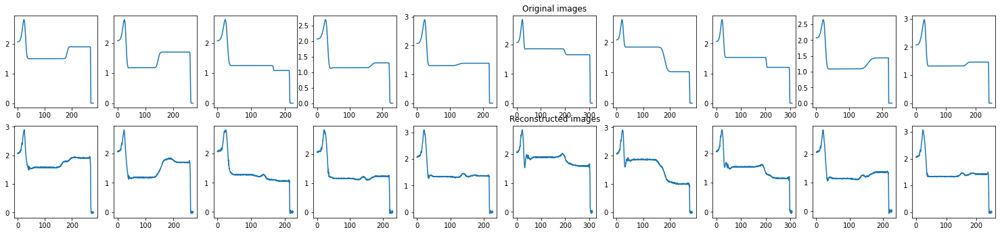

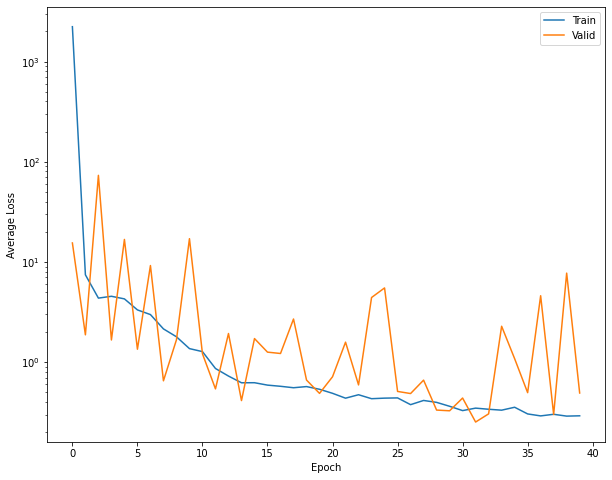

40
0.2666884
tensor(1.6485)


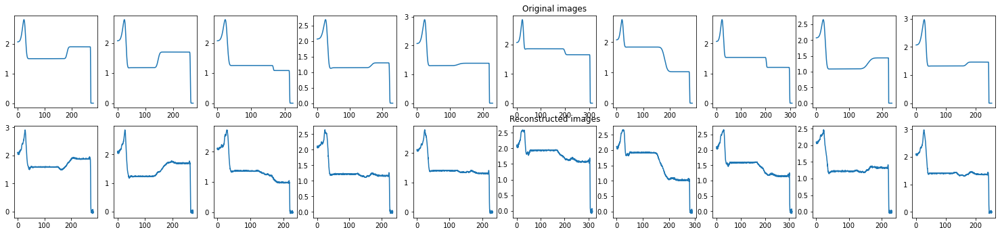

41
0.2800649
tensor(0.8378)


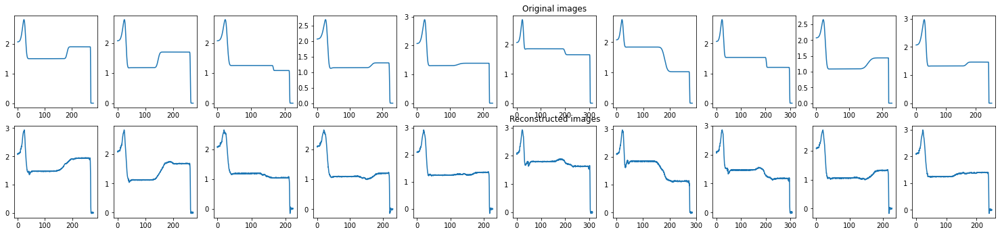

42
0.2655634
tensor(0.5294)


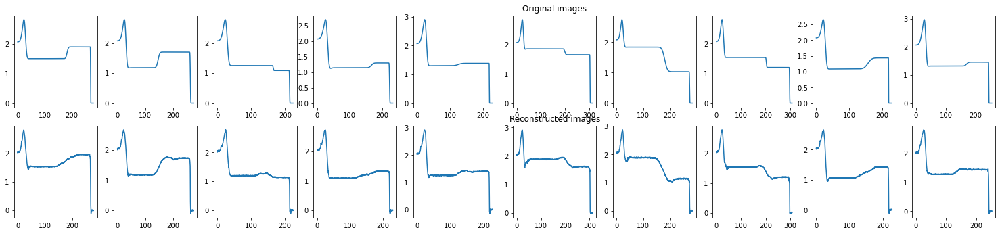

43
0.26093206
tensor(0.2184)


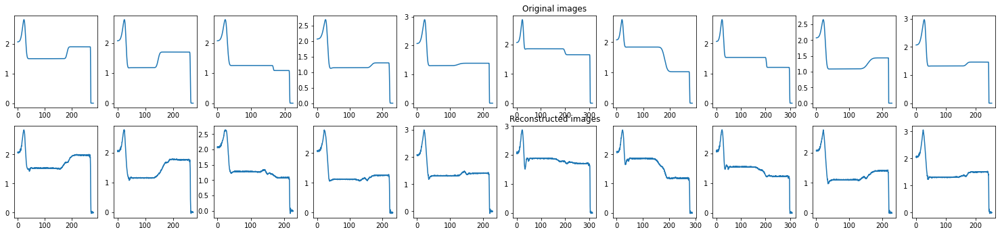

44
0.25949374
tensor(0.2752)


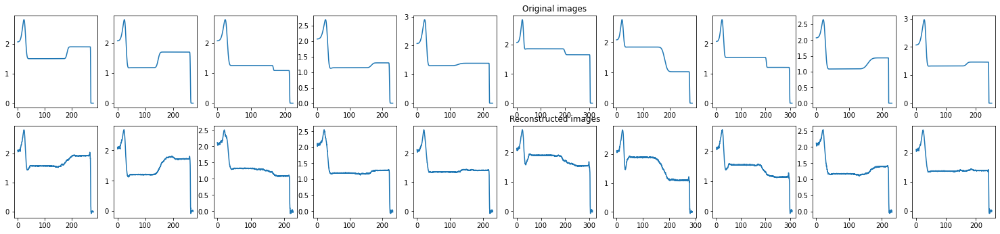

45
0.25868306
tensor(0.8522)


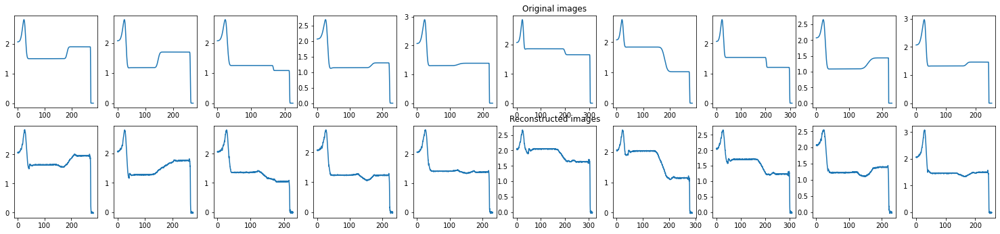

46
0.24134064
tensor(0.2340)


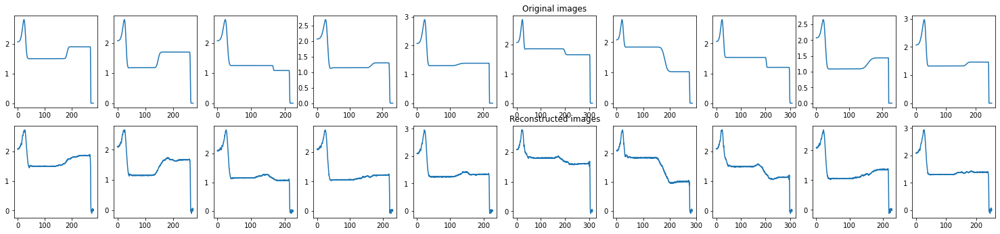

47
0.23188959
tensor(0.3793)


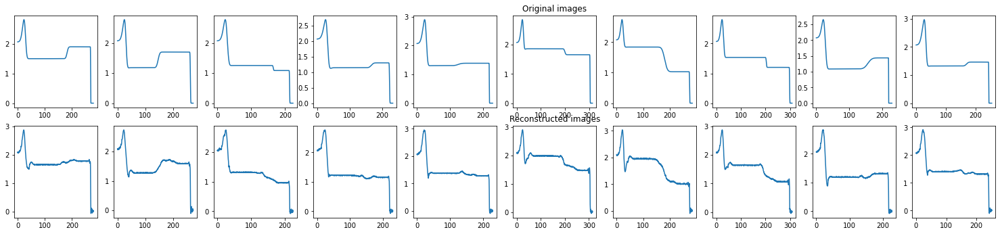

48
0.23806103
tensor(1.7550)


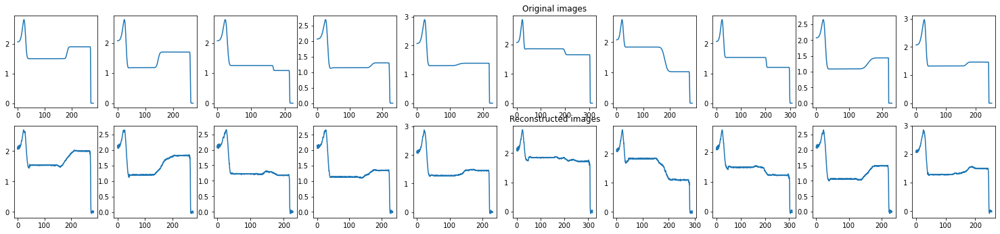

49
0.23606658
tensor(0.7694)


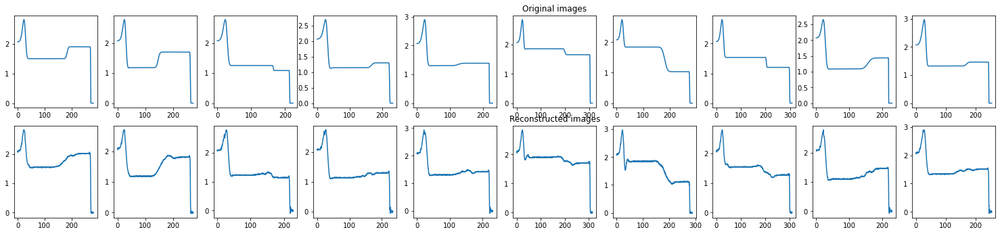

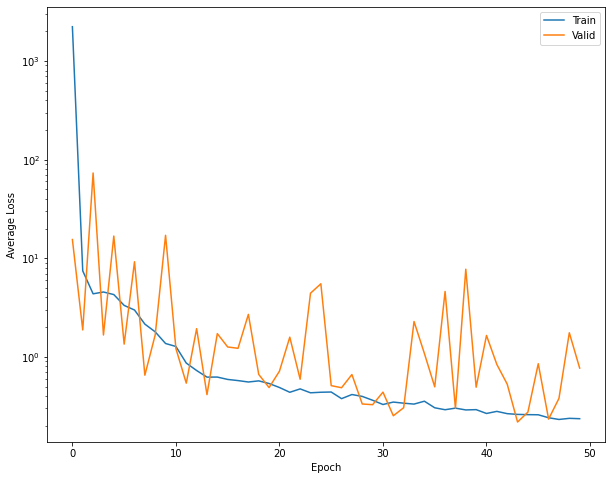

50
0.2194213
tensor(0.4789)


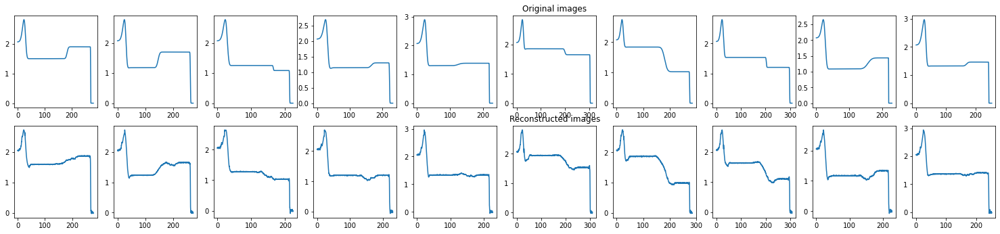

51
0.21176462
tensor(0.5390)


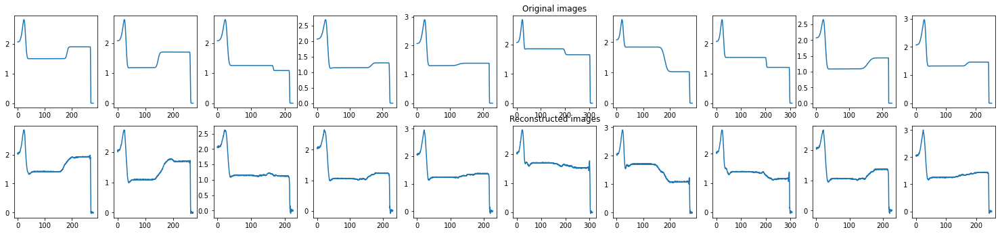

52
0.20118052
tensor(0.7135)


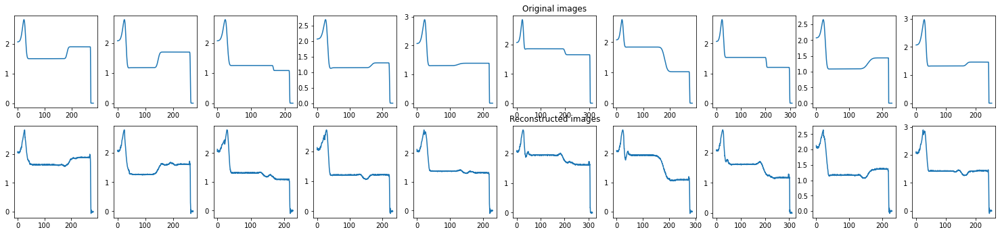

53
0.22479638
tensor(0.2180)


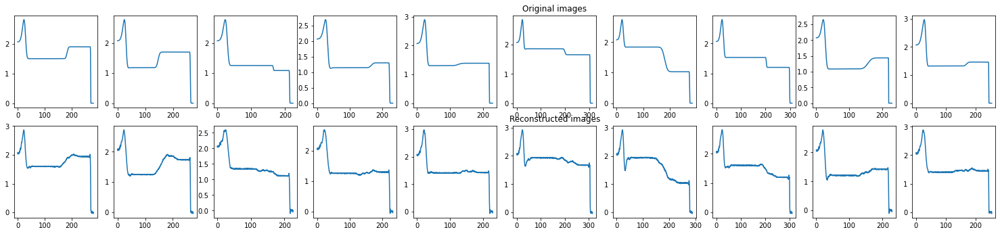

54
0.21734104
tensor(0.2022)


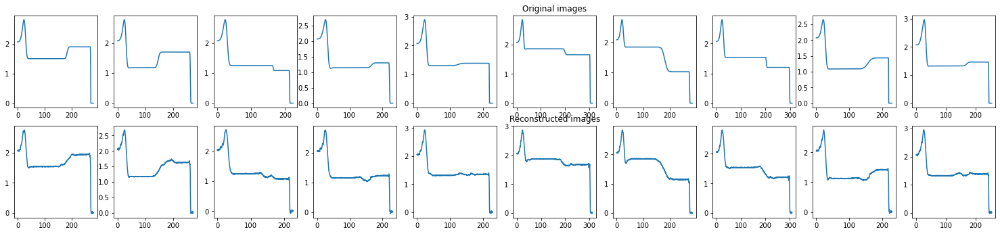

55
0.18838534
tensor(0.2101)


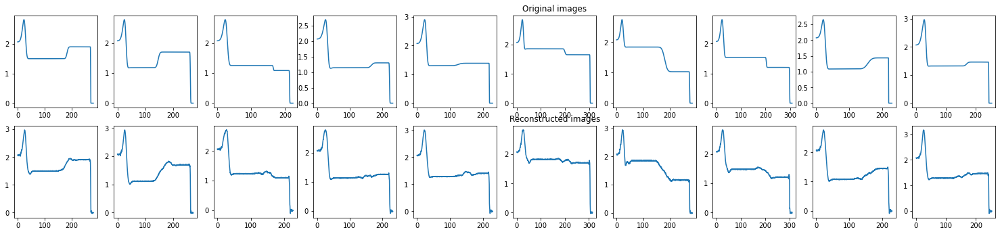

56
0.1995074
tensor(1.6458)


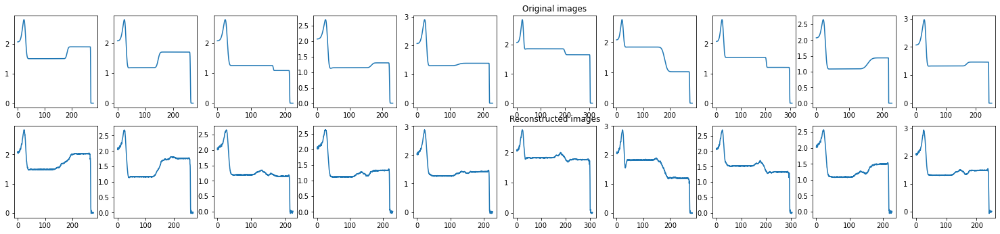

57
0.21000102
tensor(0.2687)


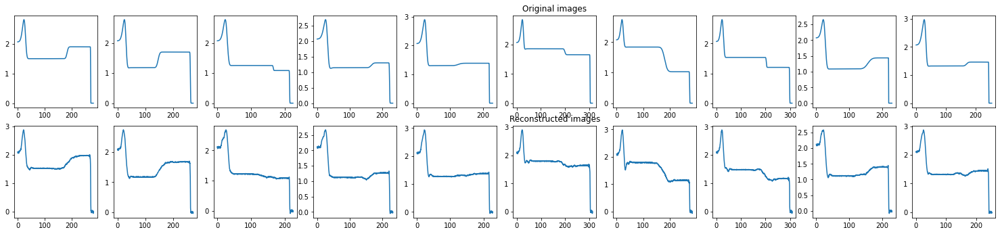

58
0.18606408
tensor(0.2498)


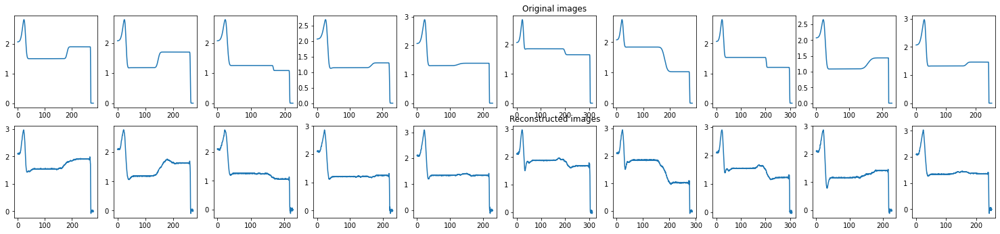

59
0.1844839
tensor(0.1868)


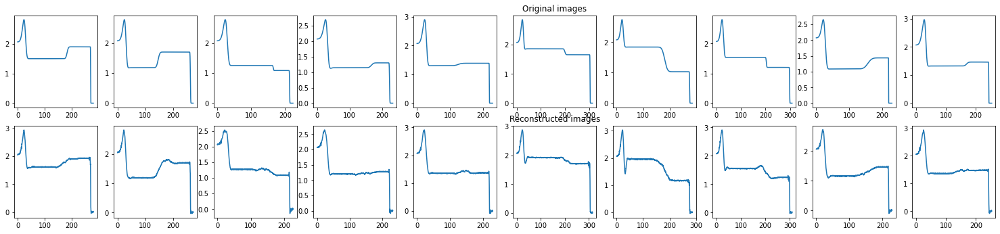

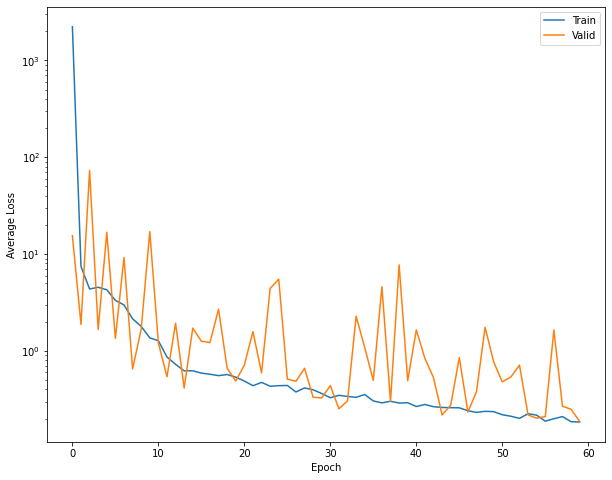

60
0.19248338
tensor(0.2230)


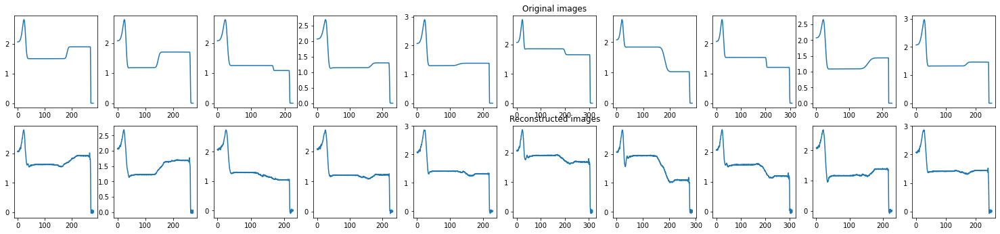

61
0.17618254
tensor(0.2139)


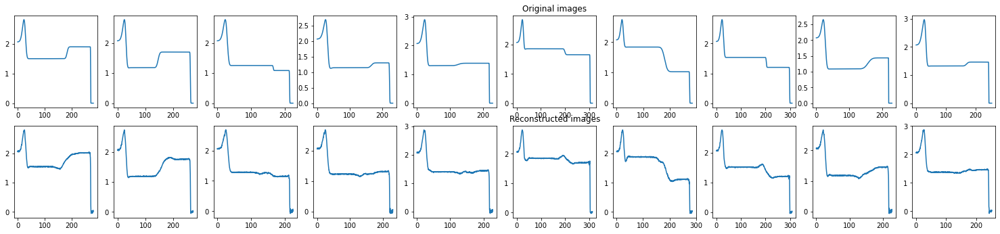

62
0.19187464
tensor(0.7737)


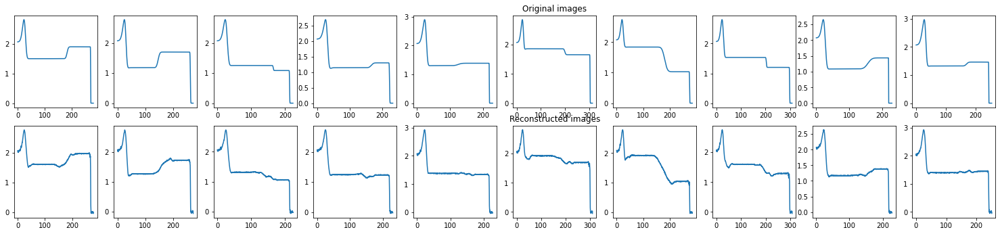

63
0.20397826
tensor(1.1825)


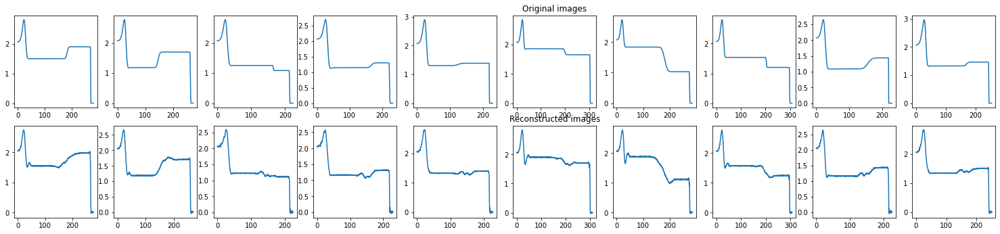

64
0.17045067
tensor(0.6998)


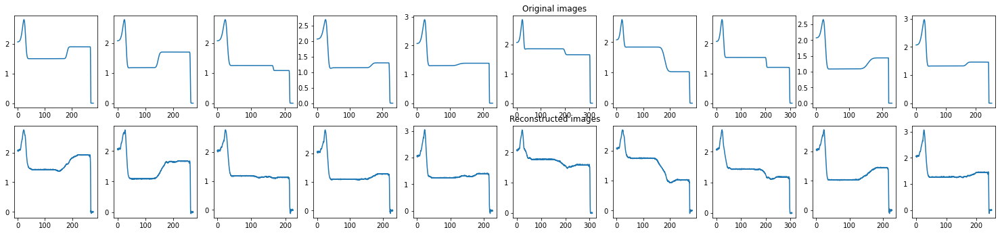

65
0.16976956
tensor(0.4680)


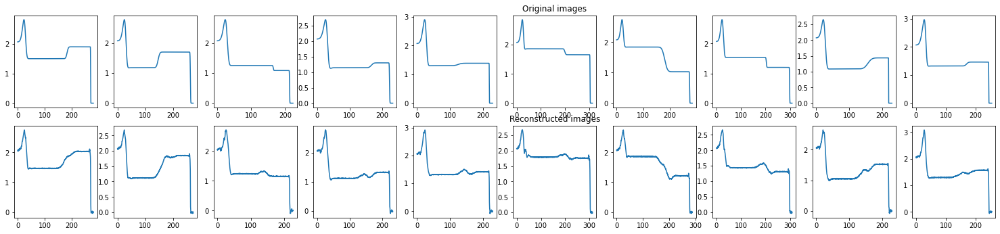

66
0.18543574
tensor(0.2934)


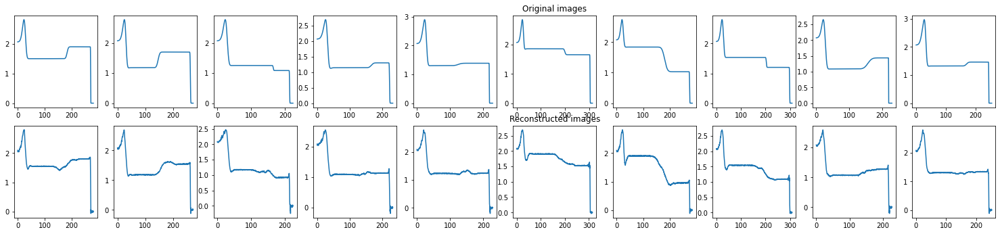

67
0.18076429
tensor(0.1865)


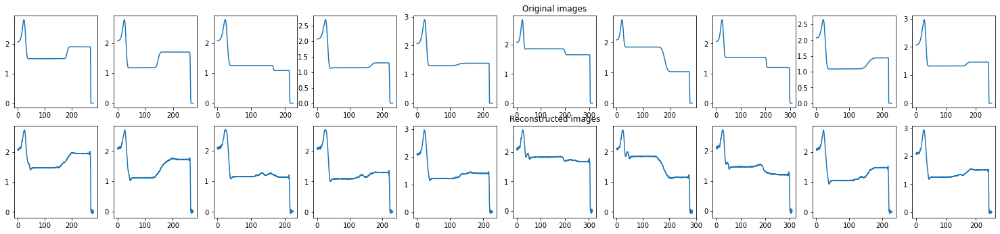

68
0.16933662
tensor(2.8798)


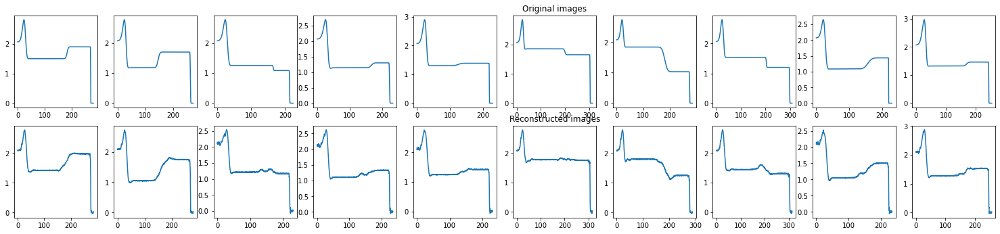

69
0.18286122
tensor(2.7458)


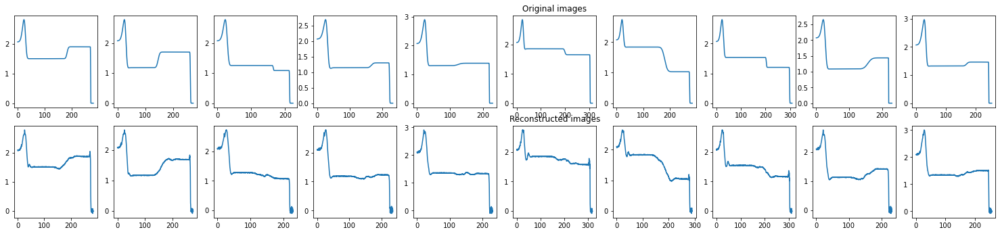

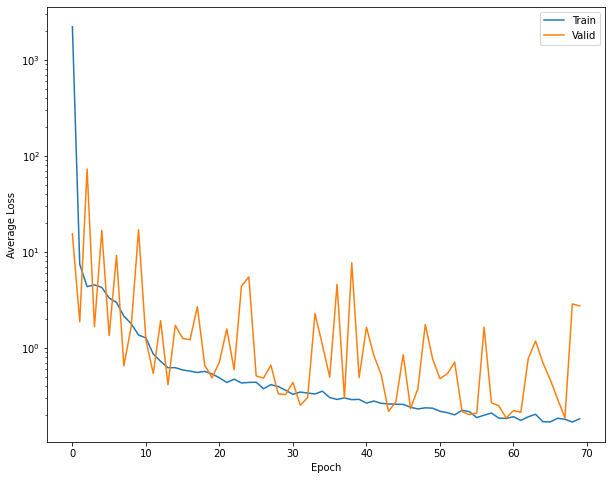

70
0.15859987
tensor(0.2277)


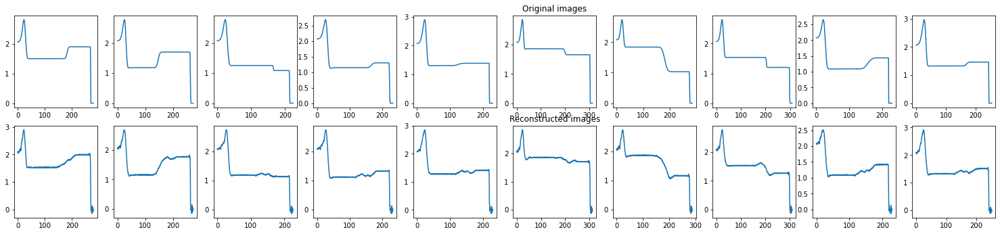

71
0.1488582
tensor(0.4559)


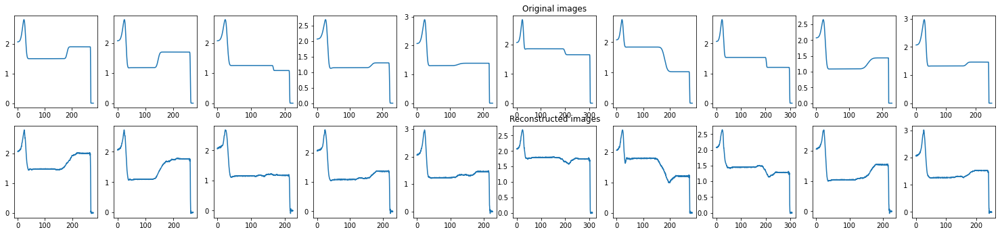

72
0.15255015
tensor(3.7165)


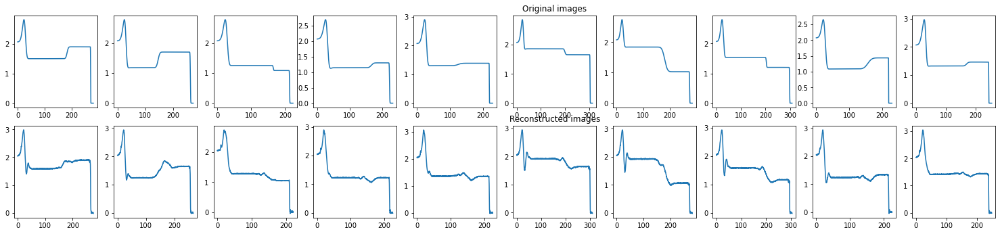

73
0.16868371
tensor(0.3142)


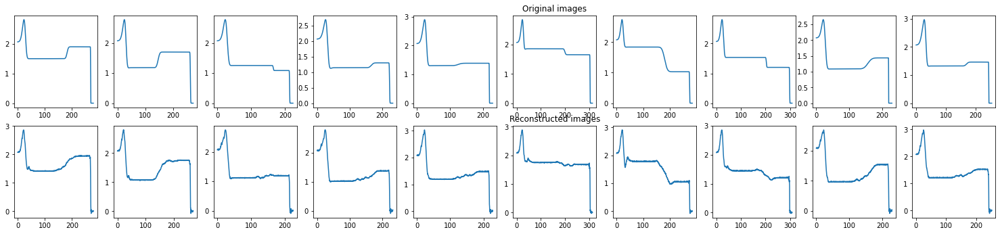

74
0.14678456
tensor(0.2961)


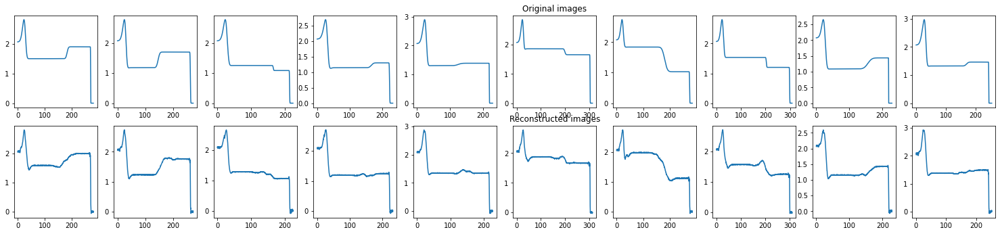

75
0.177048
tensor(0.6279)


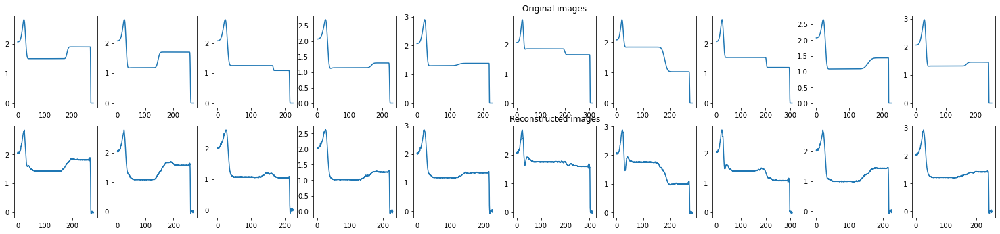

76
0.14698735
tensor(0.6364)


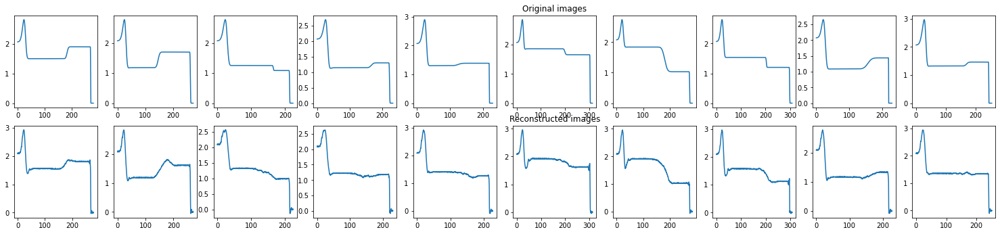

77
0.13816571
tensor(0.2045)


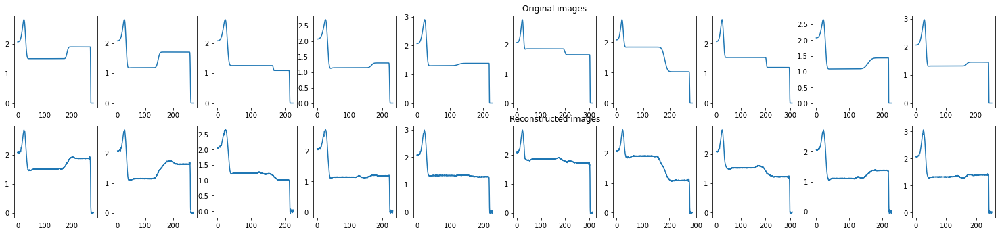

78
0.15723586
tensor(0.2850)


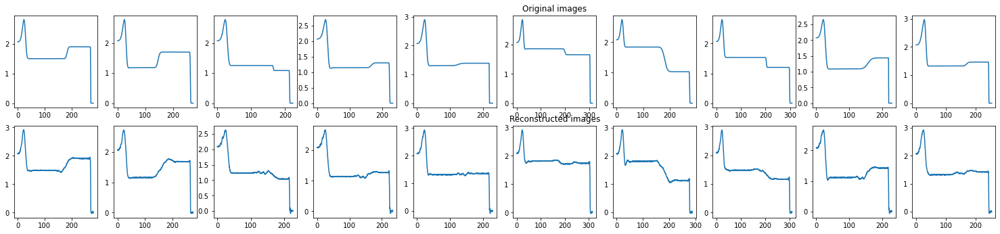

79
0.14639084
tensor(0.1184)


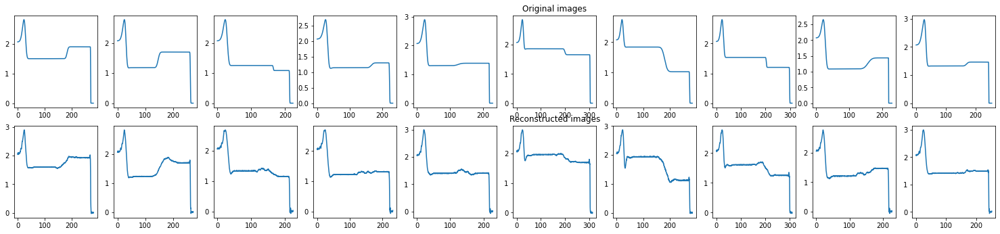

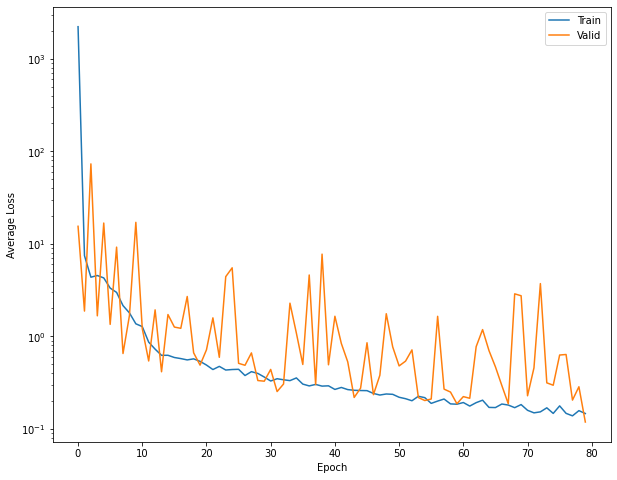

80
0.14295325
tensor(0.3448)


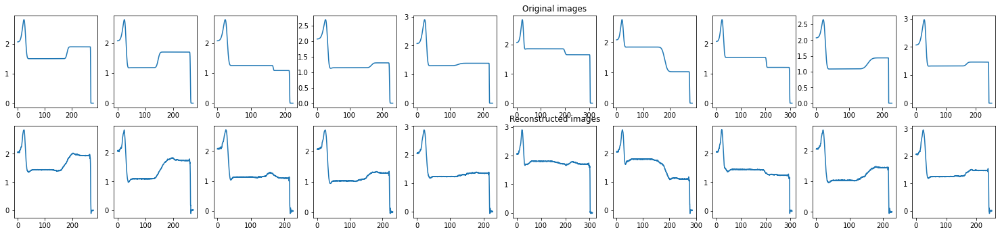

81
0.14559639
tensor(0.6635)


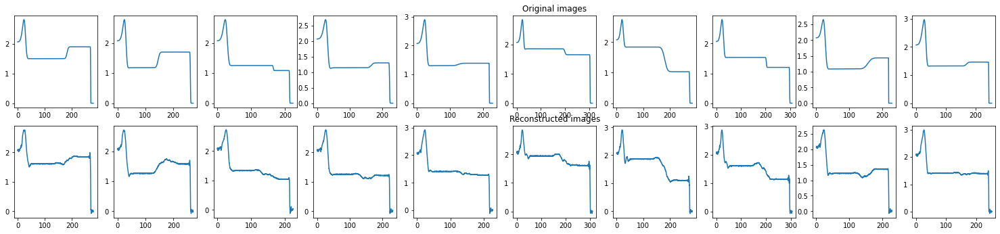

82
0.15923639
tensor(0.9249)


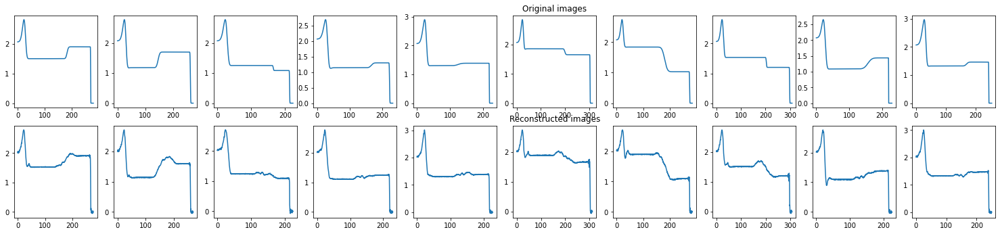

83
0.13816646
tensor(0.2646)


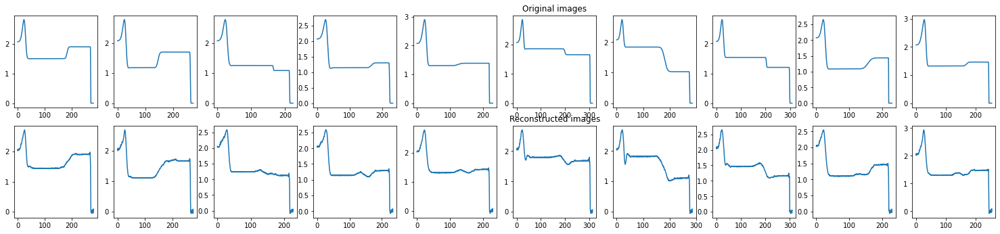

84
0.1506985
tensor(0.7241)


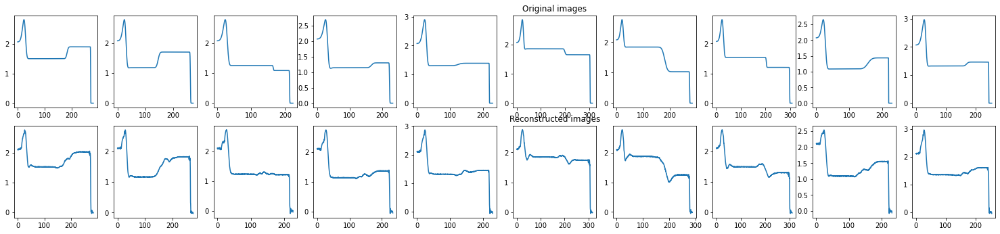

85
0.12638369
tensor(0.7605)


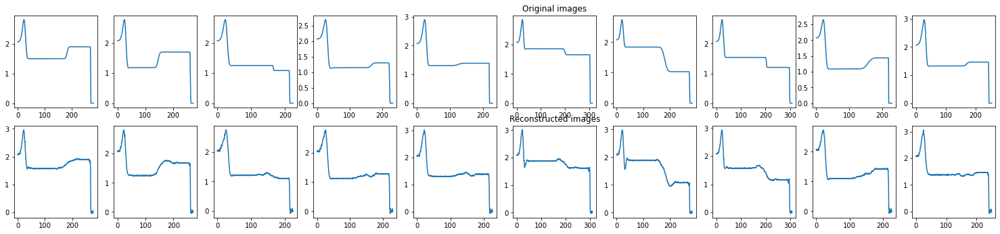

86
0.14850509
tensor(0.1700)


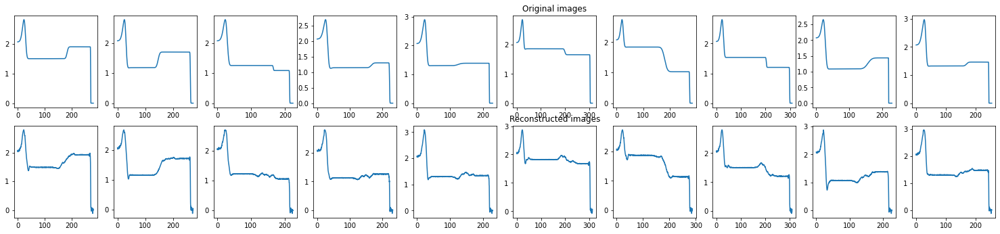

87
0.15459956
tensor(0.5478)


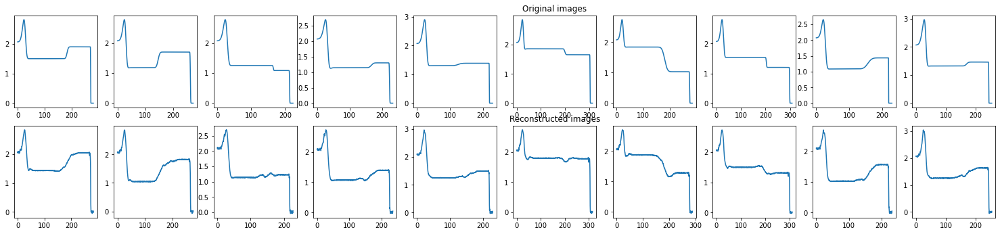

88
0.12318655
tensor(0.1749)


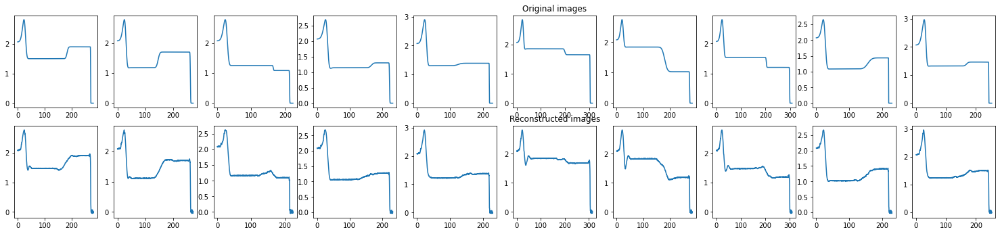

89
0.13525353
tensor(0.2072)


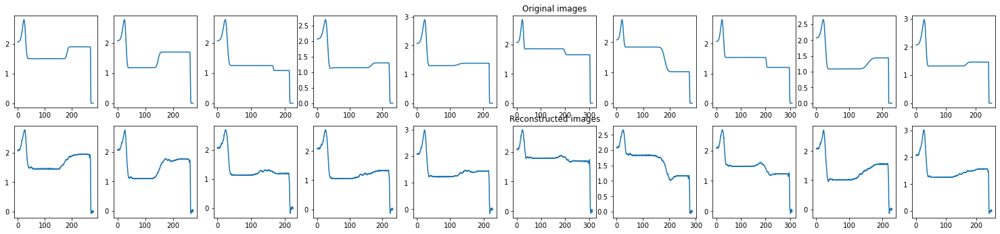

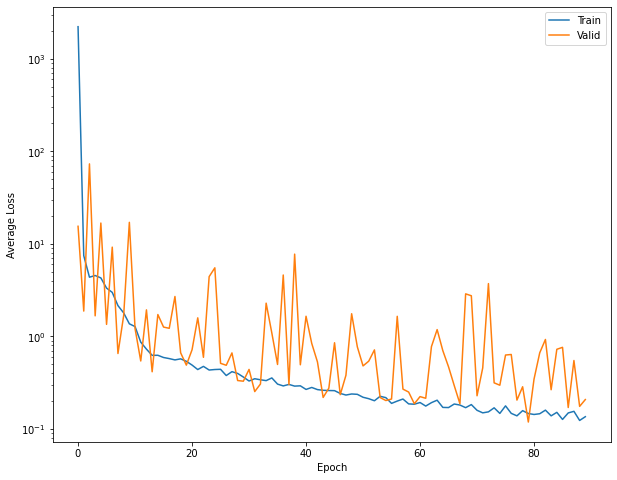

90
0.13211656
tensor(0.2387)


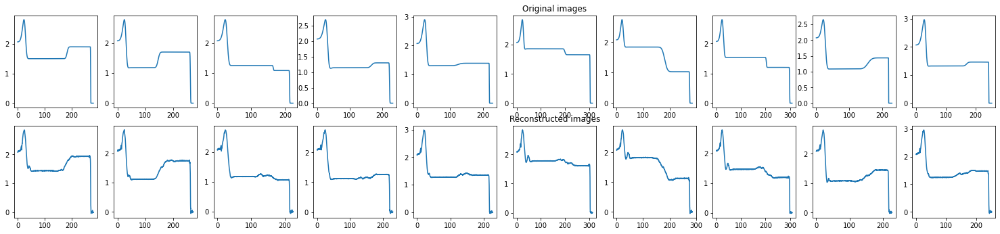

91
0.1432197
tensor(0.2171)


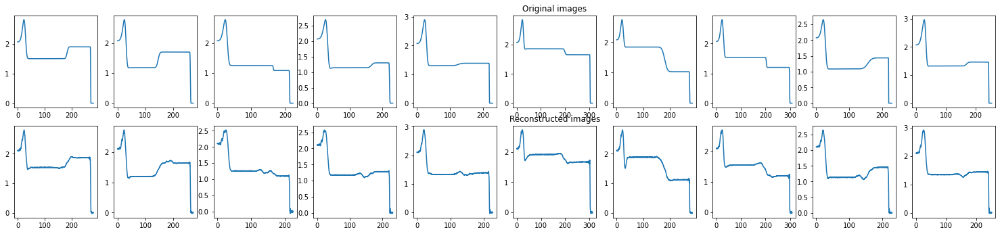

92
0.11999723
tensor(0.1426)


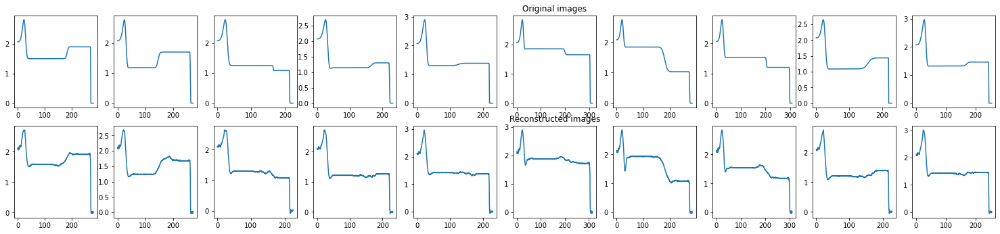

93
0.13310224
tensor(0.2574)


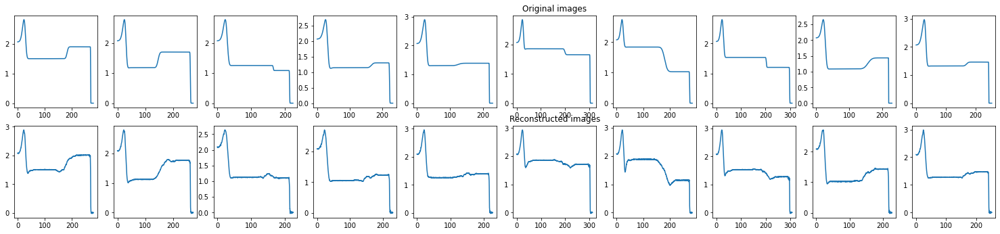

94
0.12826538
tensor(0.1299)


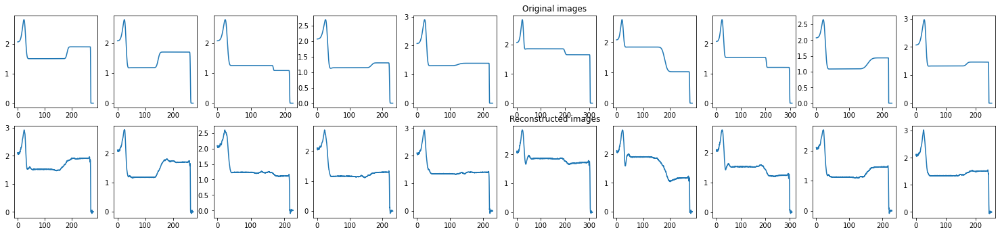

95
0.13331139
tensor(0.1731)


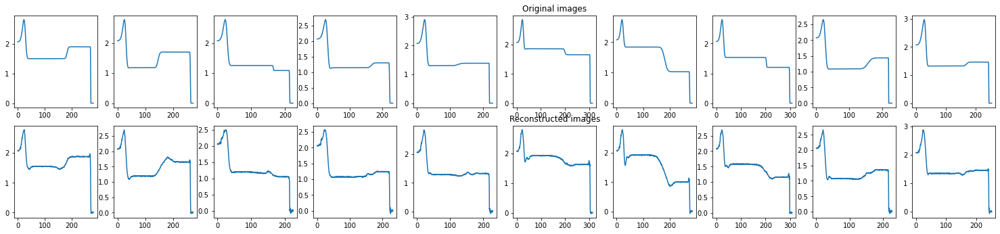

96
0.12297346
tensor(0.1510)


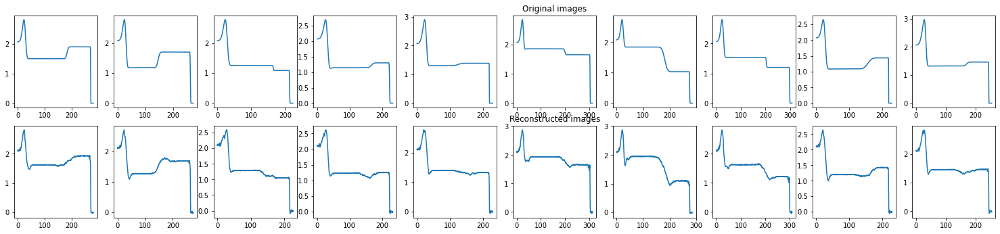

97
0.12095472
tensor(0.3125)


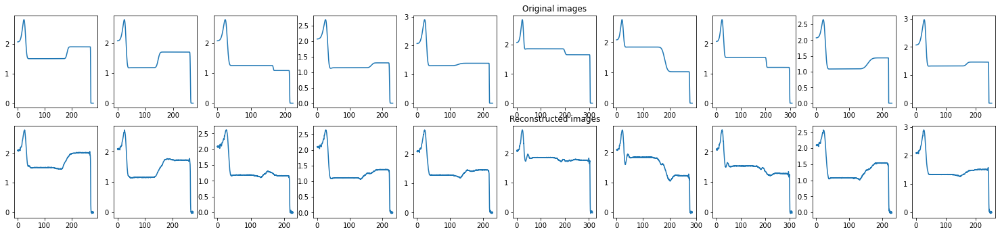

98
0.14601807
tensor(1.0871)


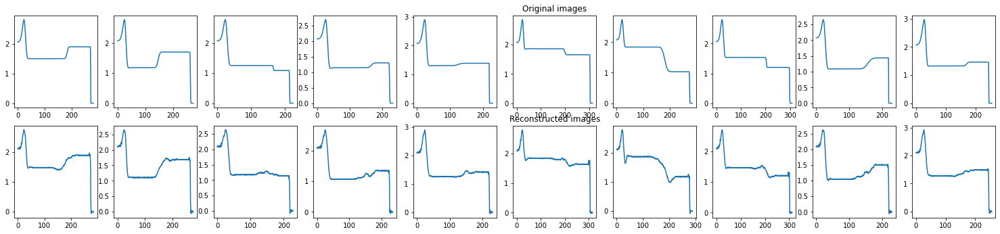

99
0.12376395
tensor(2.9034)


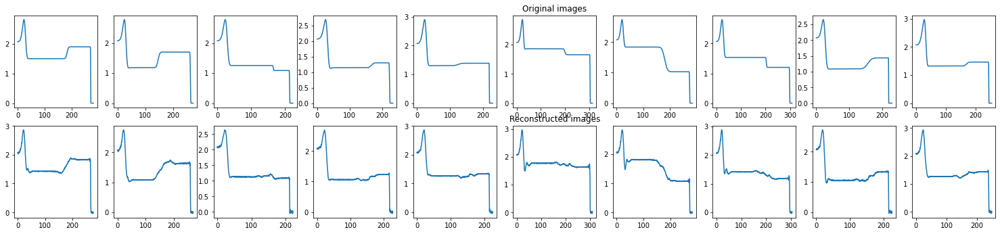

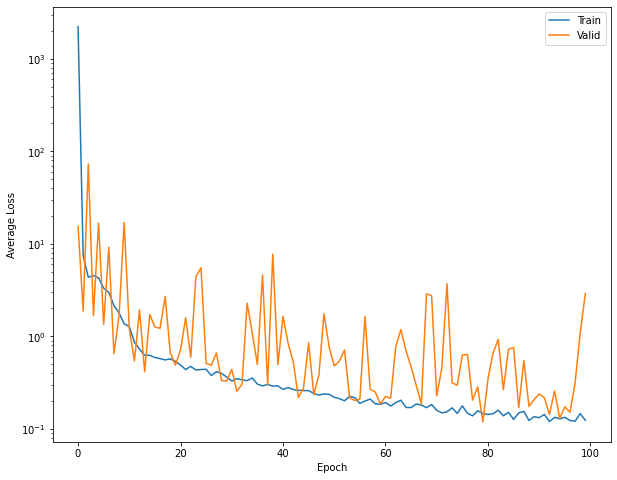

100
0.12249331
tensor(0.3112)


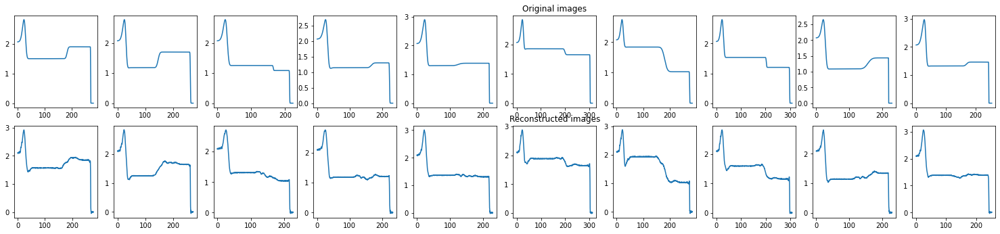

101
0.12209368
tensor(1.1497)


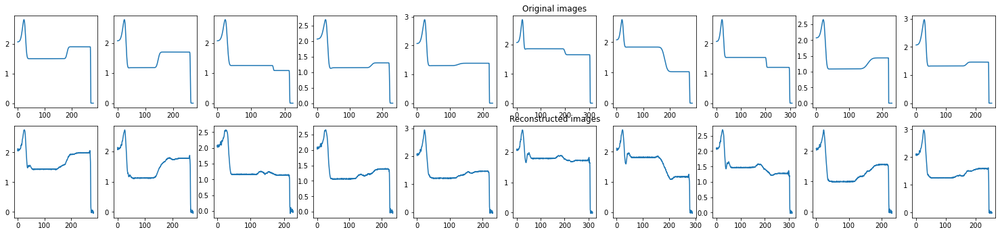

102
0.113036826
tensor(0.1932)


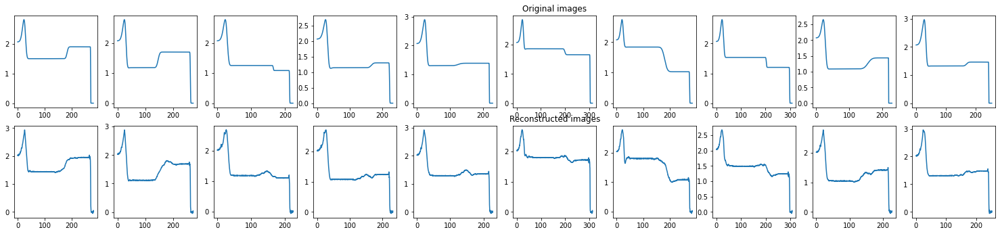

103
0.122762755
tensor(0.2657)


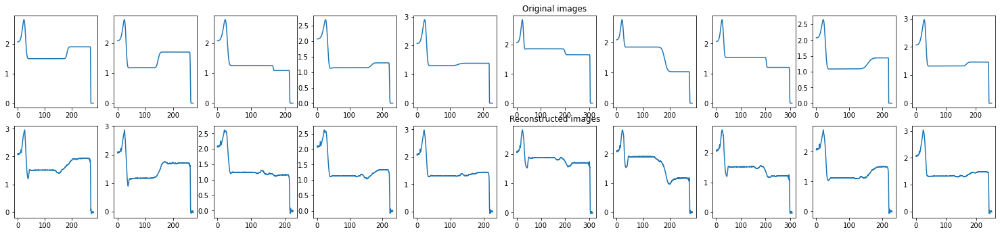

106
0.12398994
tensor(1.9104)
0.076818906
tensor(1.3311)


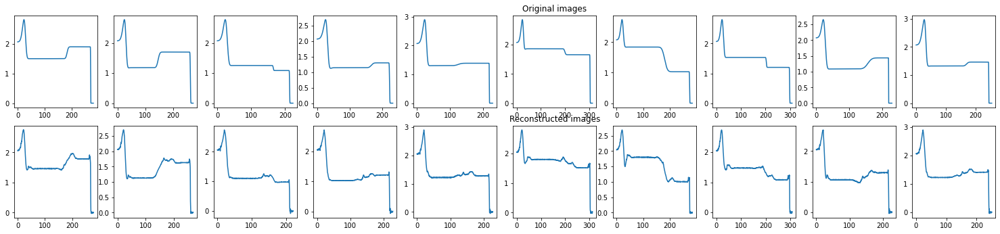

189
0.08093557
tensor(0.0967)


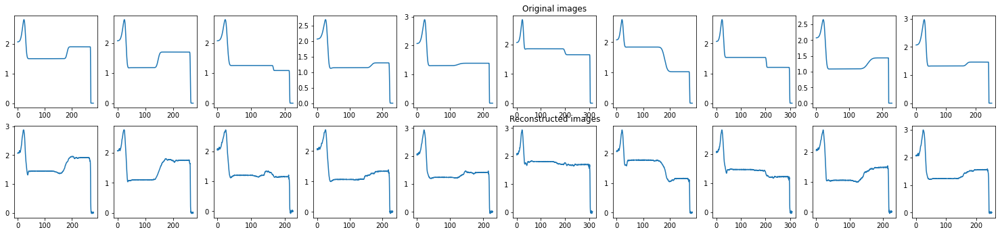

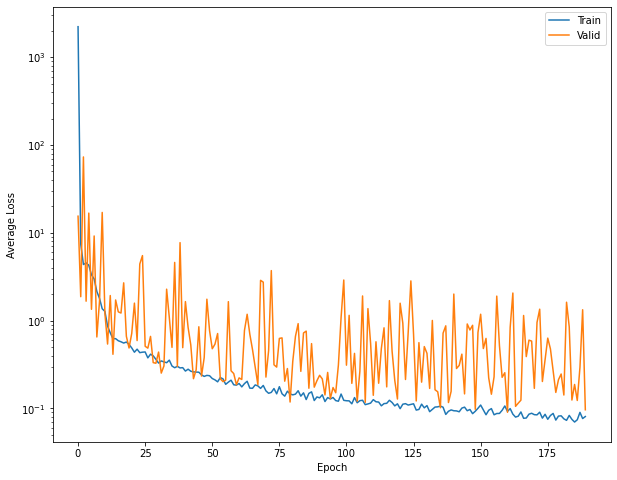

190
0.06993555
tensor(0.0832)


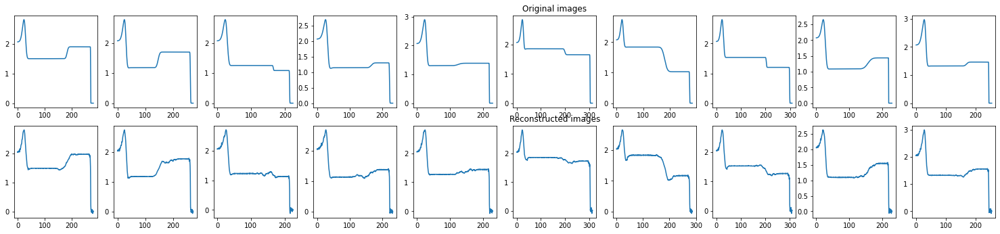

191
0.09025271
tensor(0.9639)
0.06909038
tensor(0.0949)


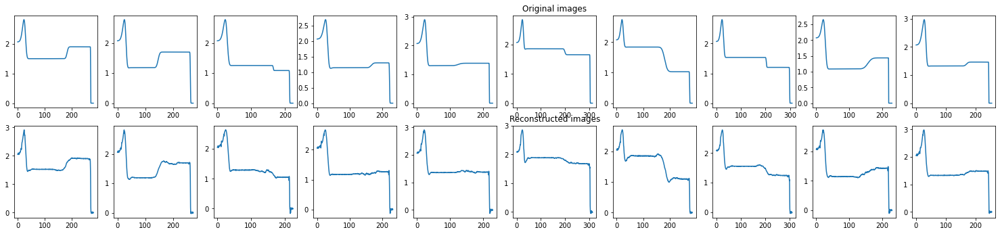

229
0.07569278
tensor(0.7587)
0.06283974
tensor(0.3329)


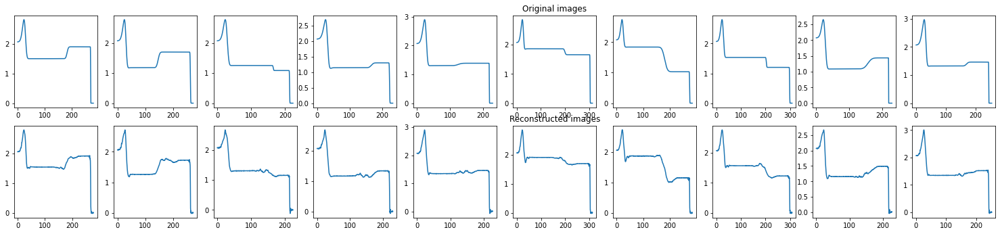

278
0.054914266
tensor(0.7586)


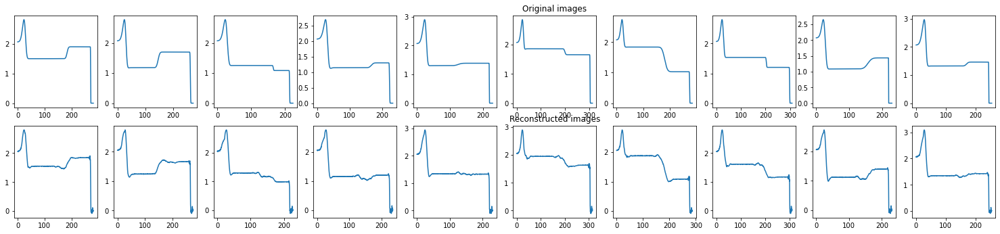

279
0.056209538
tensor(0.4750)


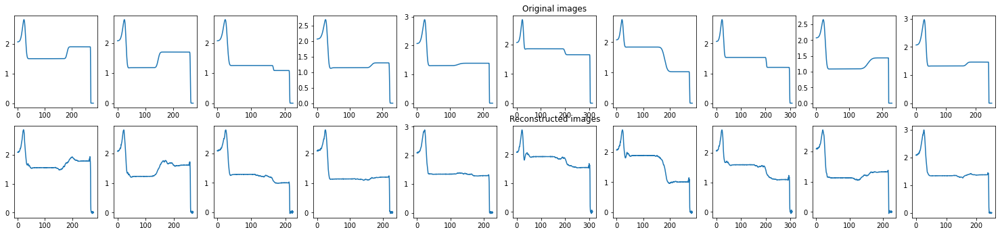

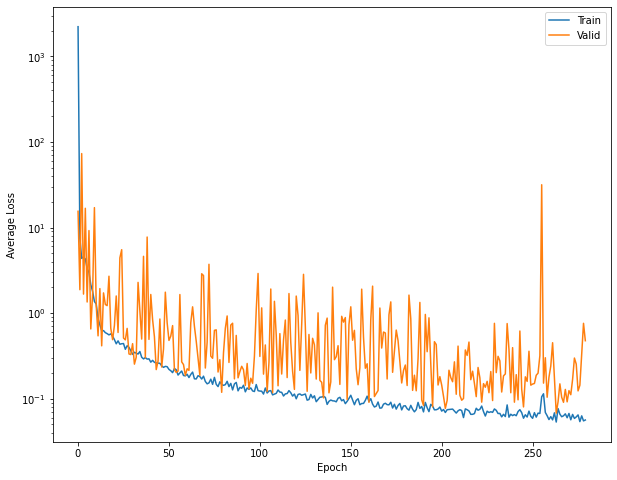

280
0.06323378
tensor(0.1102)


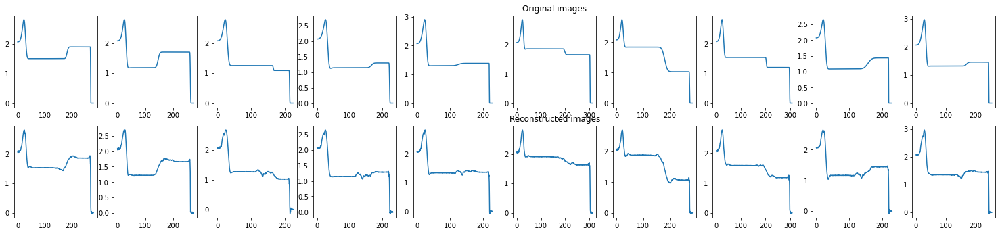

281
0.06146121
tensor(0.0988)


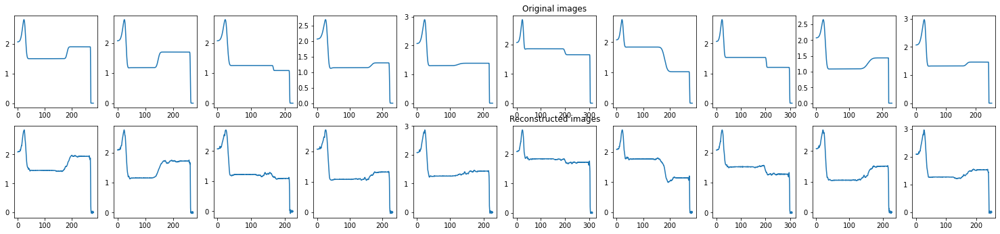

282
0.055769704
tensor(0.2271)


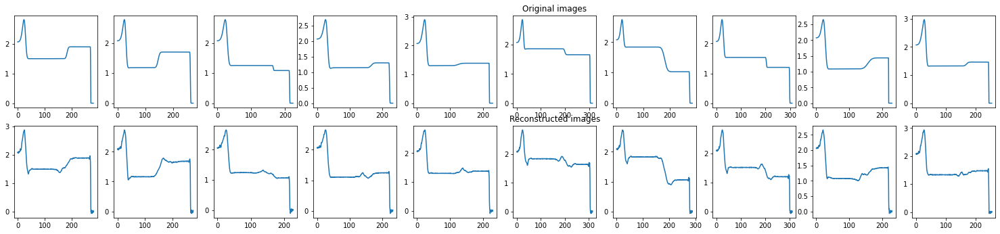

283
0.070359744
tensor(0.1538)


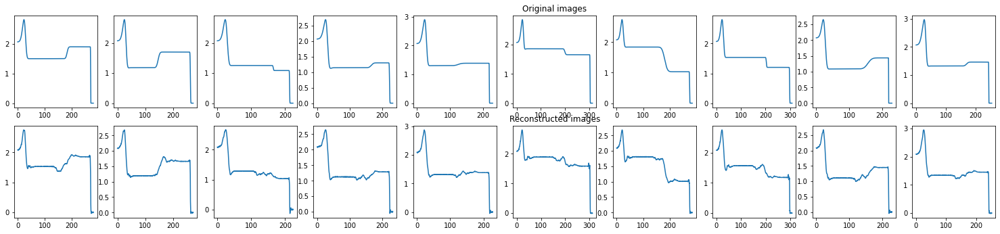

284
0.06322621
tensor(0.8581)


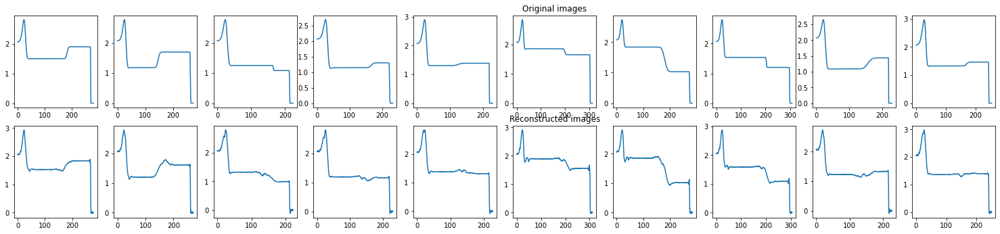

285
0.064026505
tensor(0.3404)


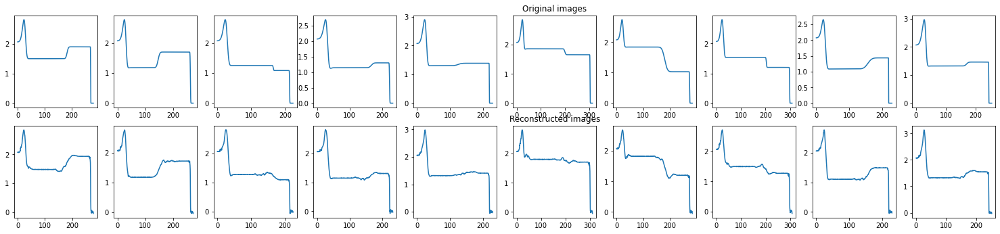

286
0.055963155
tensor(0.3136)


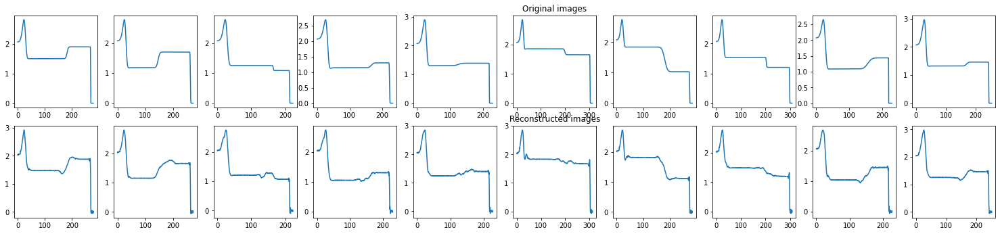

287
0.06186112
tensor(0.2126)


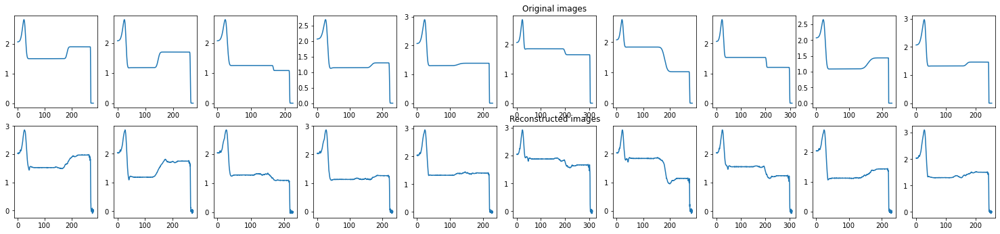

288
0.05811444
tensor(0.0832)


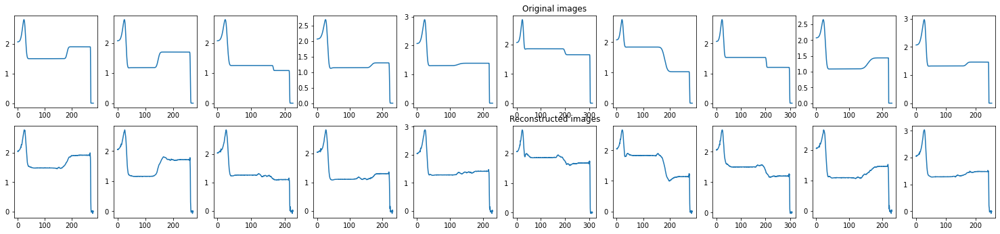

289
0.05393691
tensor(0.1646)


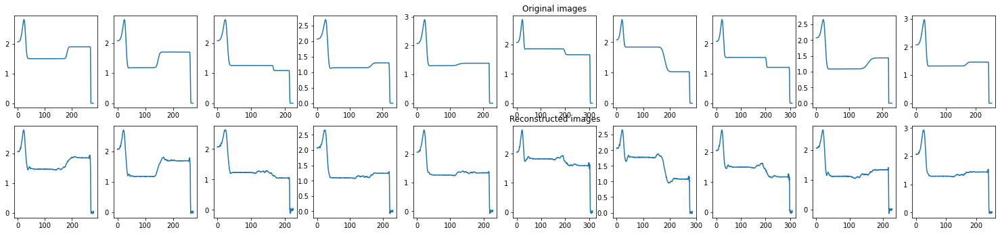

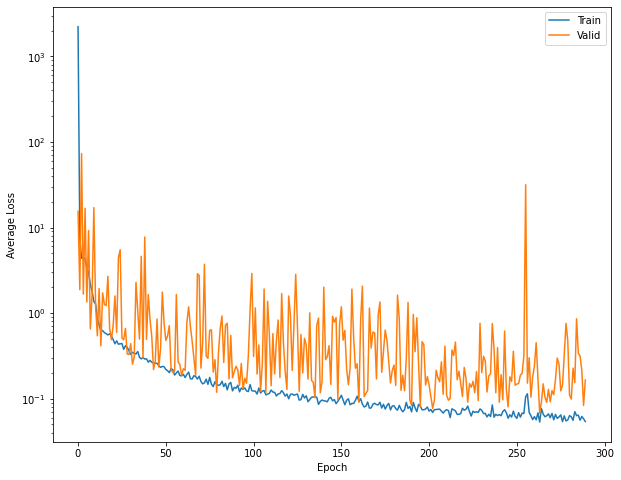

290
0.06234709
tensor(0.1648)


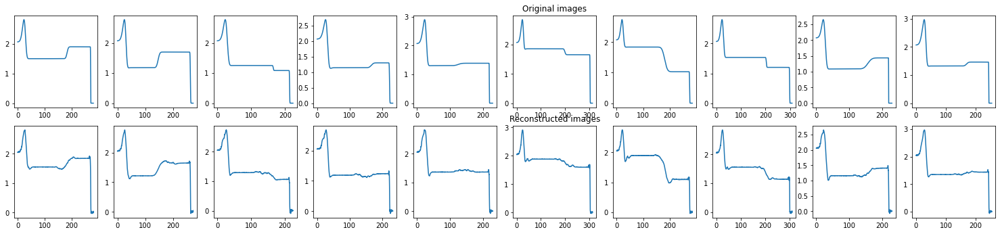

291
0.060702506
tensor(0.2042)


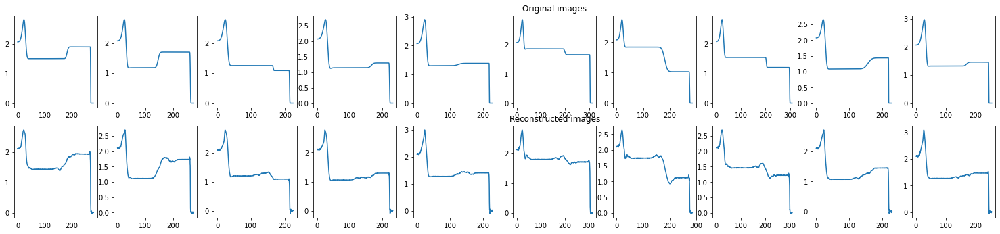

292
0.05705188
tensor(0.1001)


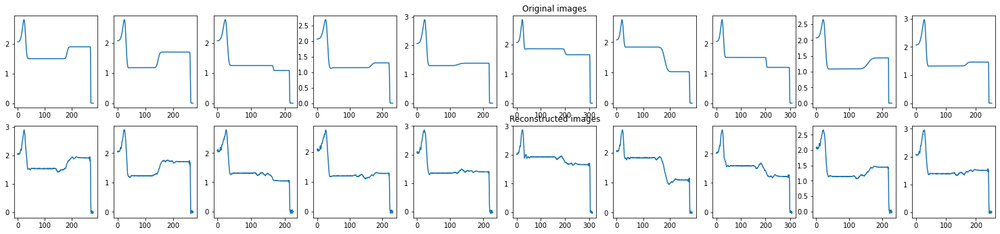

293
0.05710926
tensor(0.2550)


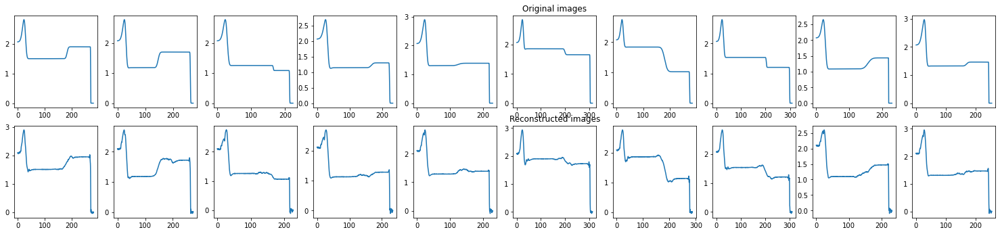

294
0.061062228
tensor(0.0792)


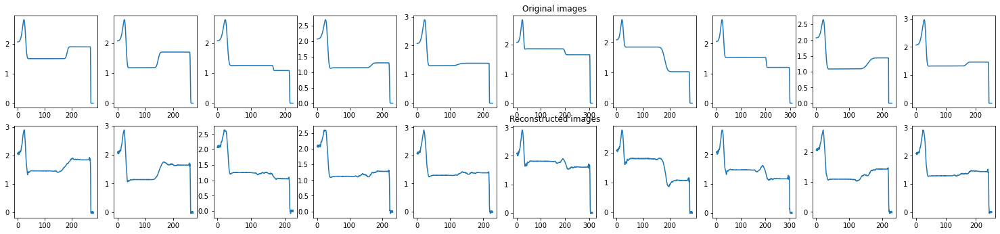

295
0.06539235
tensor(0.2828)


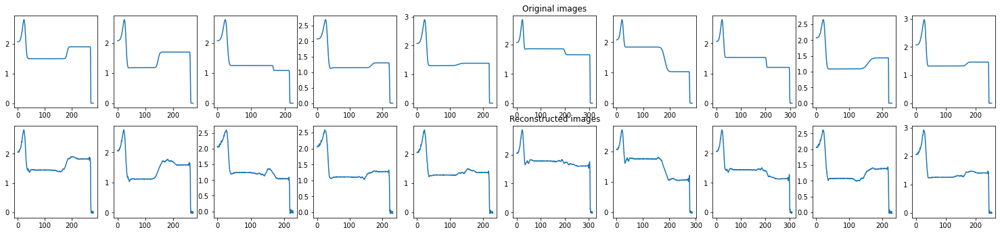

296
0.052470066
tensor(0.0833)


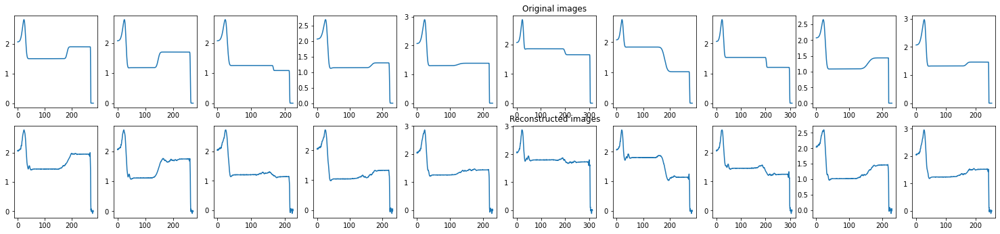

297
0.061861772
tensor(0.1841)


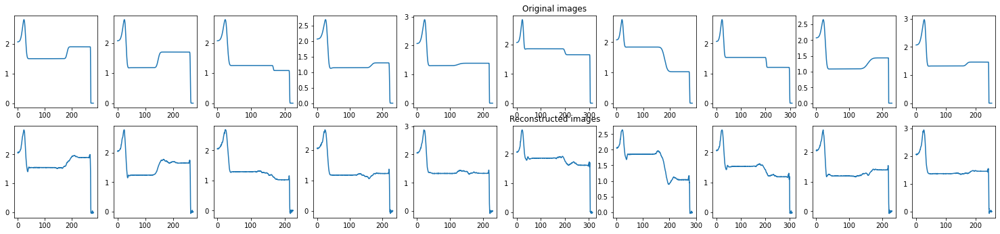

298
0.050323047
tensor(0.6127)


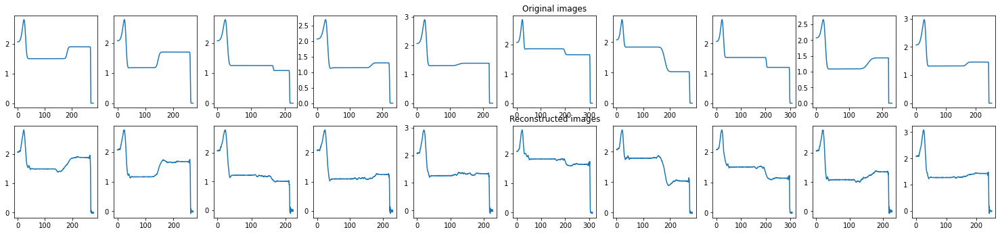

299
0.062277637
tensor(0.3306)


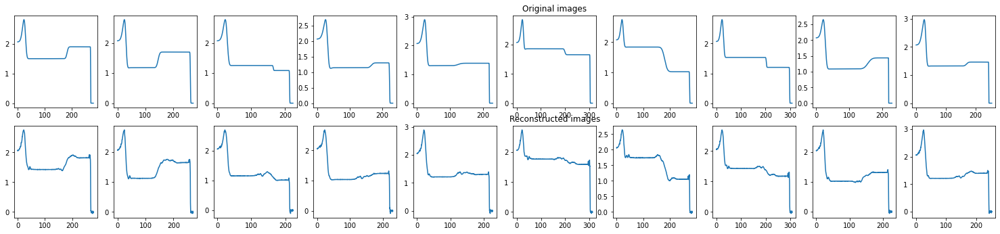

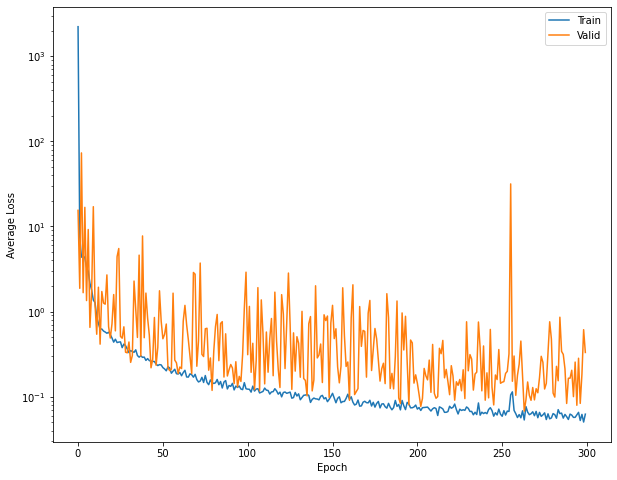

300
0.0650704
tensor(0.0920)


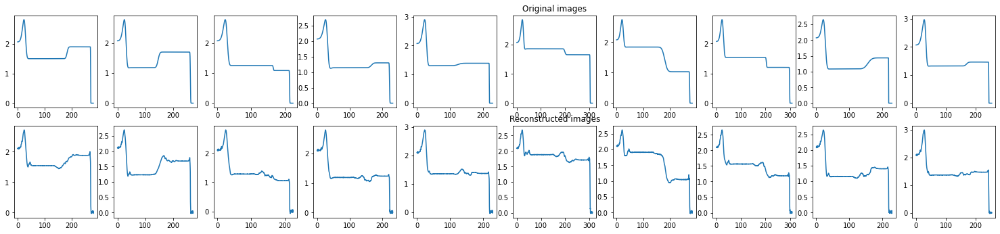

301
0.056956477
tensor(0.1926)


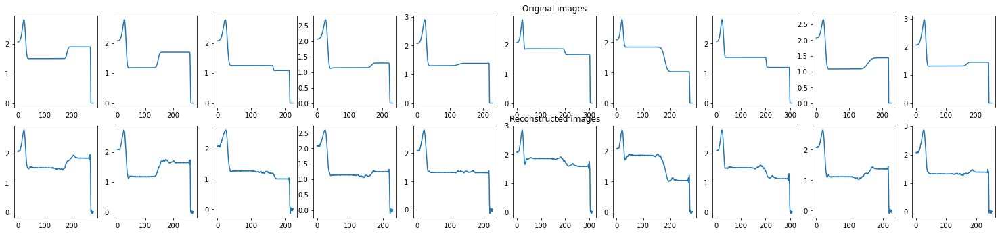

302
0.05622647
tensor(0.3120)


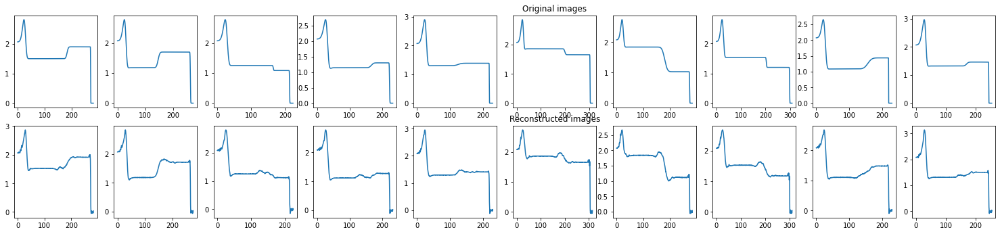

303
0.06015549
tensor(0.1468)


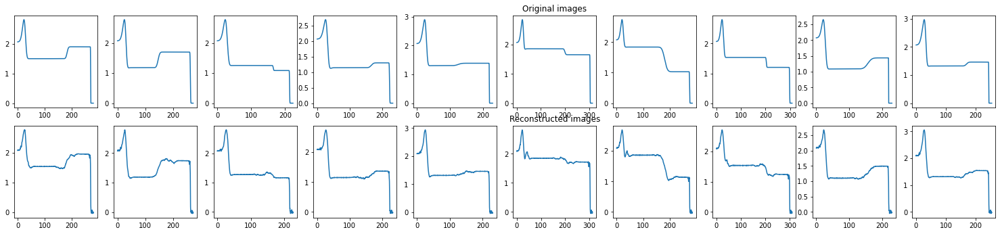

304
0.05785681
tensor(0.3628)


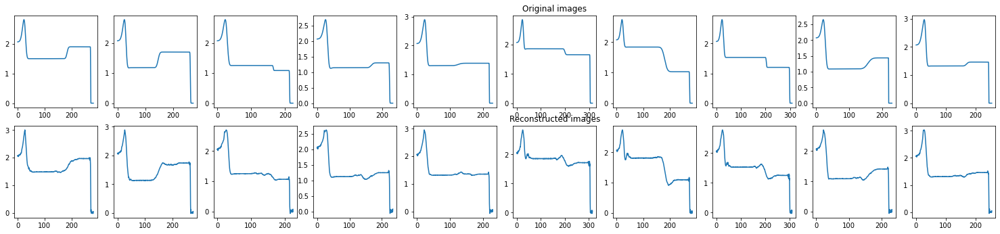

305
0.05043171
tensor(0.2342)


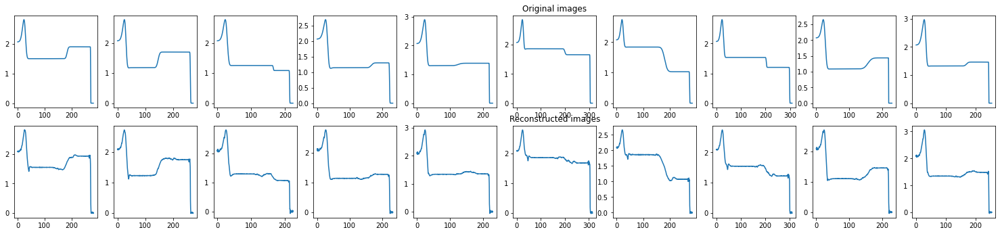

306
0.05406714
tensor(0.0988)


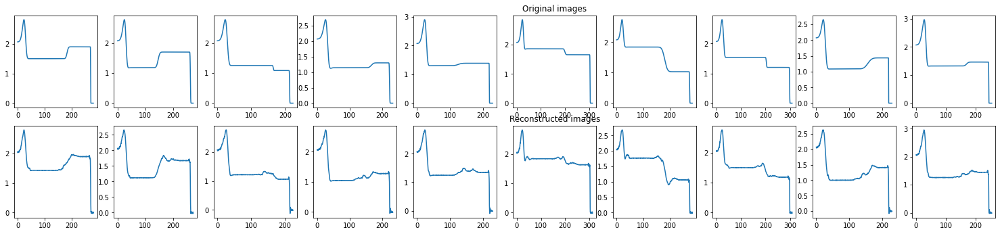

307
0.054616377
tensor(0.1753)


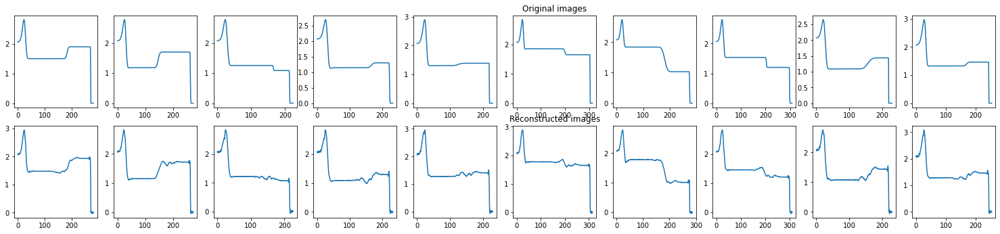

308
0.06662985
tensor(0.2292)


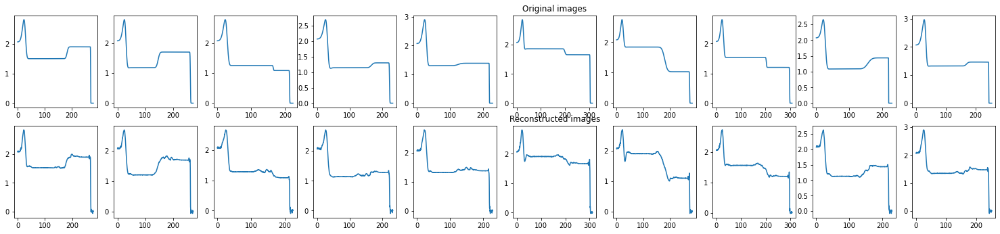

309
0.064905986
tensor(0.8722)


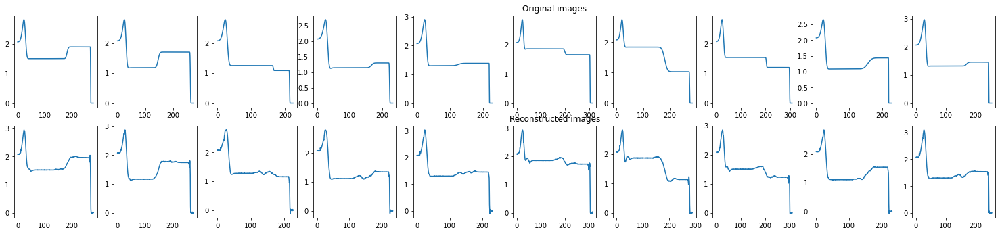

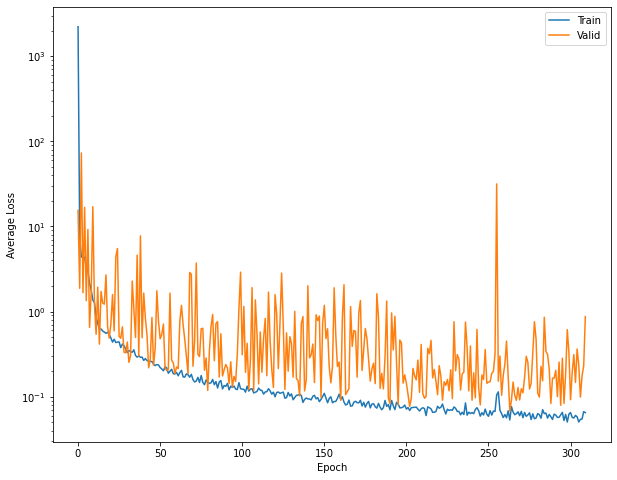

310
0.05632102
tensor(0.0722)


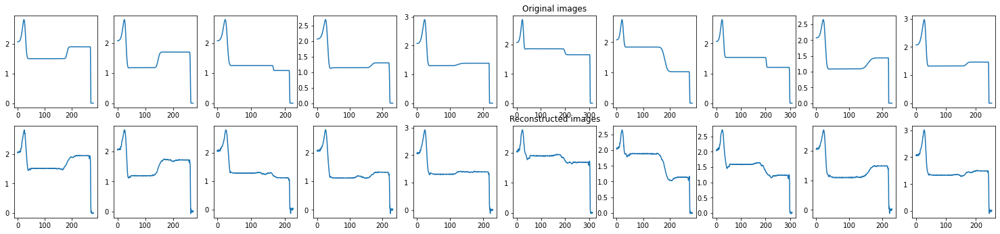

311
0.05290732
tensor(0.1196)


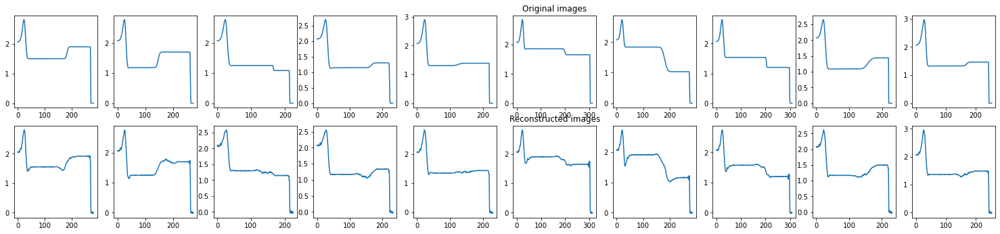

312
0.05760689
tensor(0.1727)


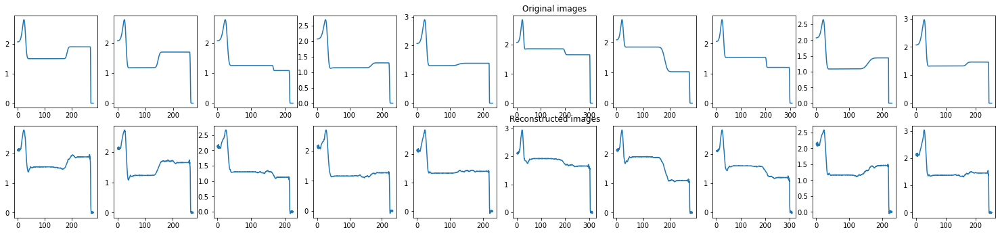

313
0.064244
tensor(0.2306)


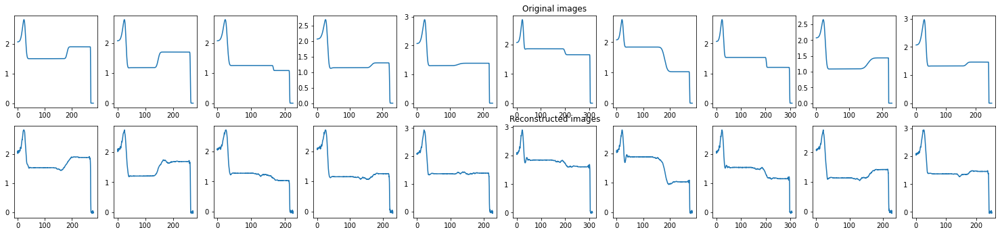

314
0.05905596
tensor(0.2648)


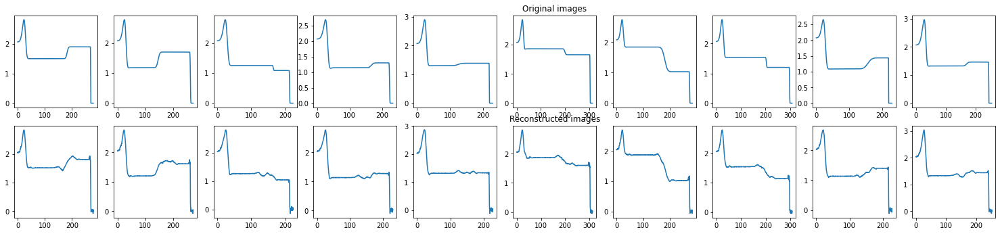

315
0.052020658
tensor(0.6108)


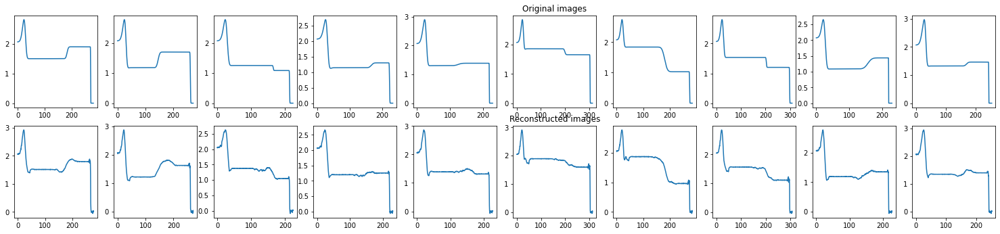

316
0.050226424
tensor(0.1652)


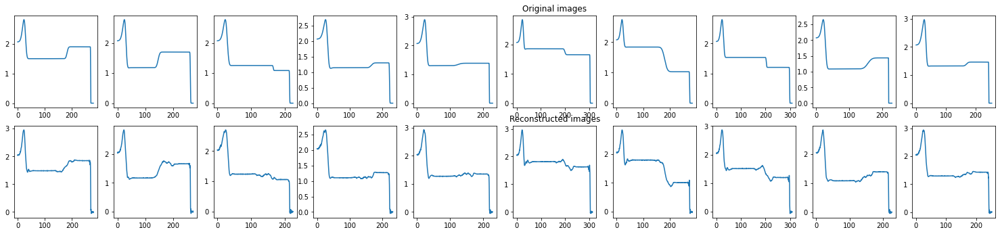

317
0.0547931
tensor(0.4953)


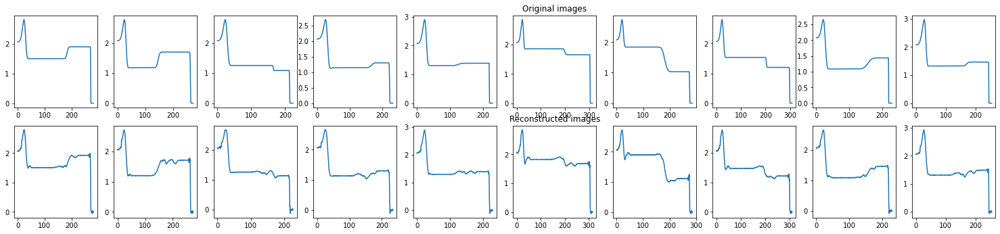

318
0.05581035
tensor(0.1200)


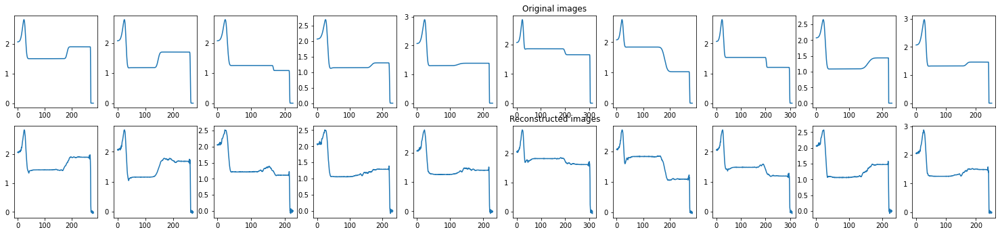

319
0.0585759
tensor(0.7242)


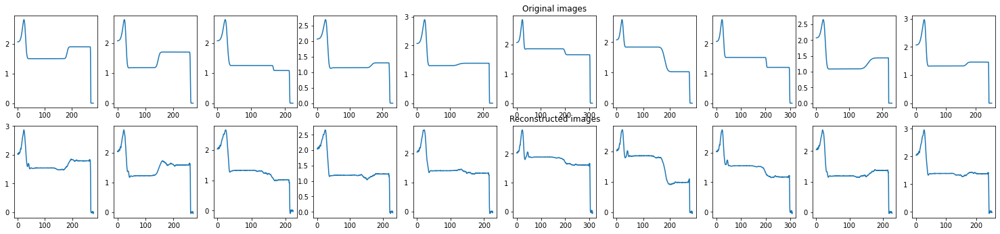

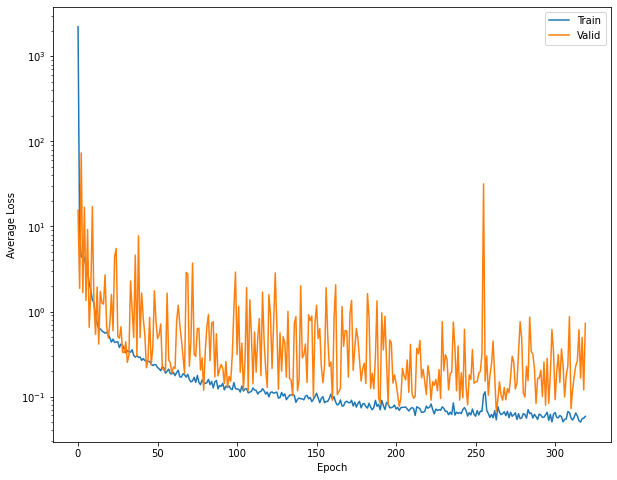

320
0.06616937
tensor(0.2954)


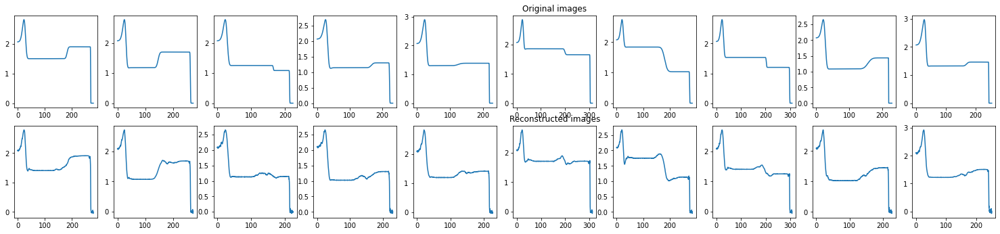

321
0.053376194
tensor(0.0966)


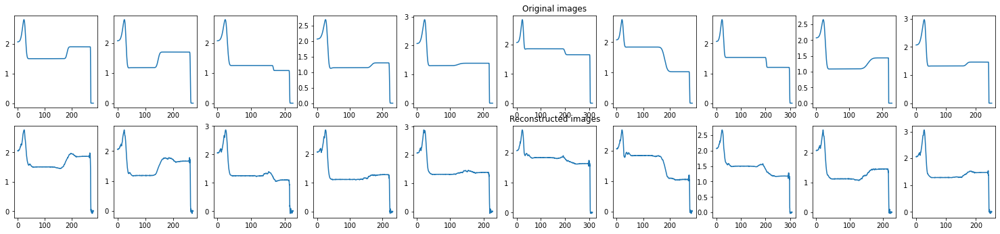

322
0.05420773
tensor(0.0771)


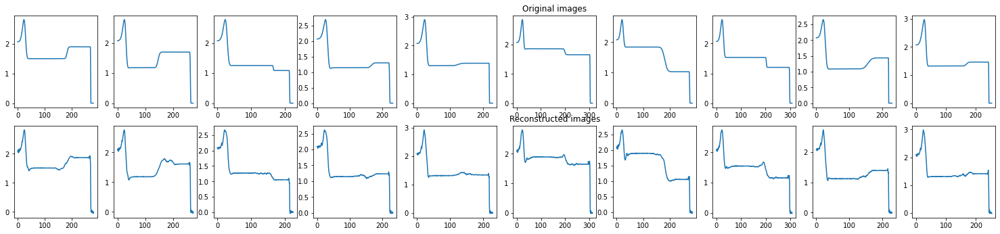

323
0.056640163
tensor(0.2571)


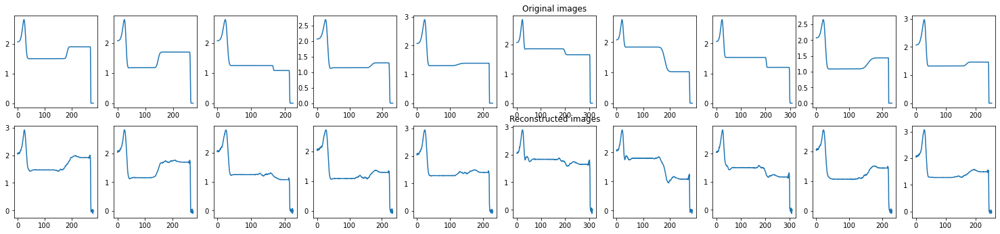

324
0.056376558
tensor(0.1101)


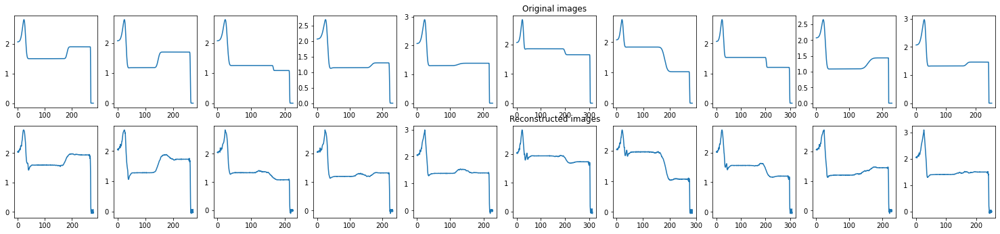

325
0.059928212
tensor(0.0682)


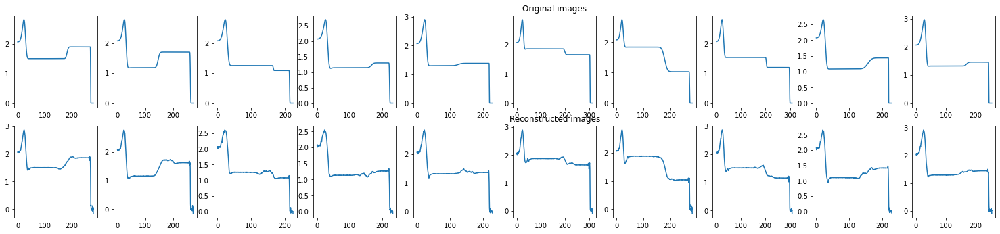

326
0.04282097
tensor(0.2464)


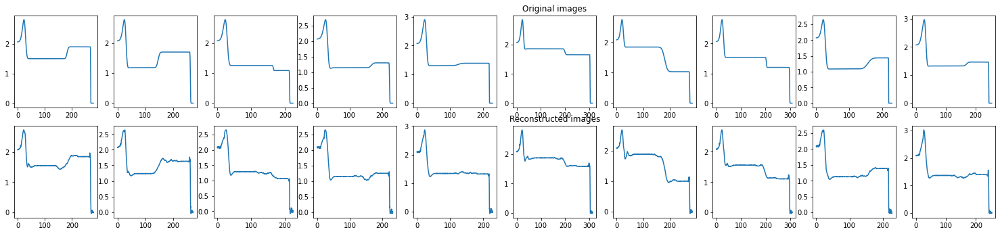

327
0.053061765
tensor(0.1689)


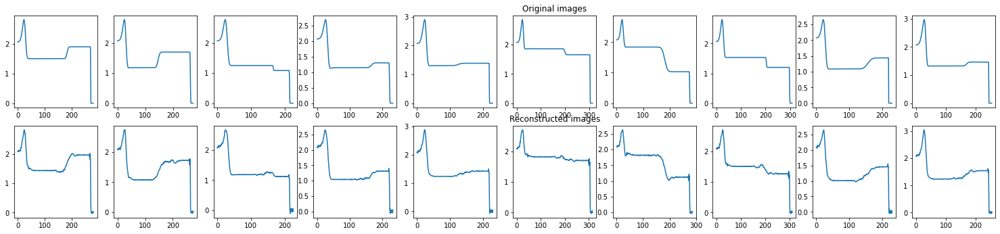

328
0.054421768
tensor(0.4737)


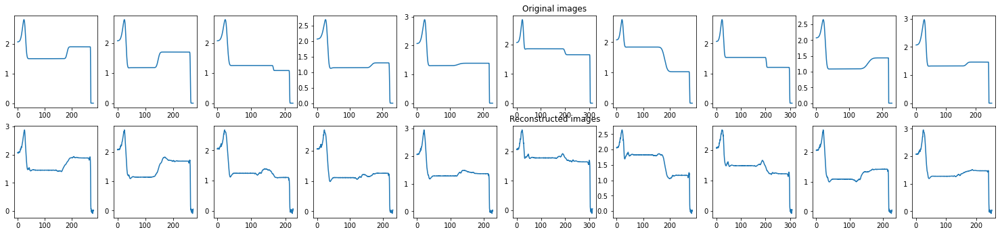

329
0.07519119
tensor(0.1198)


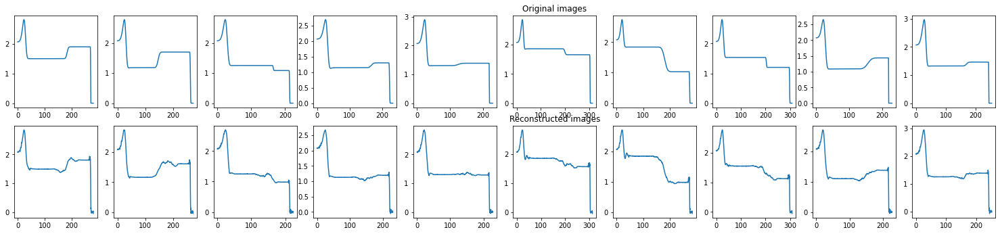

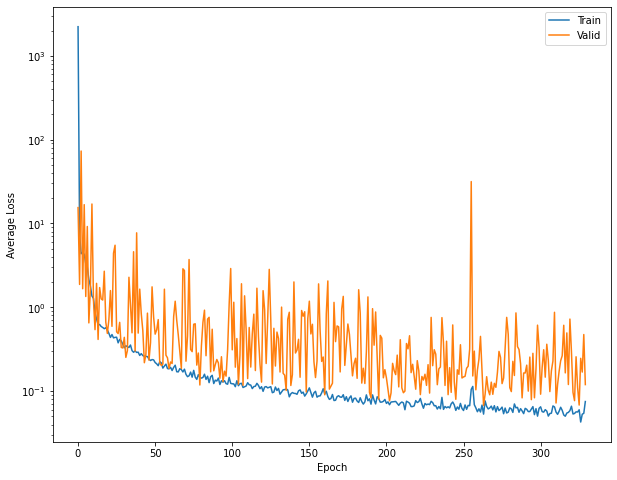

330
0.04510329
tensor(0.1109)


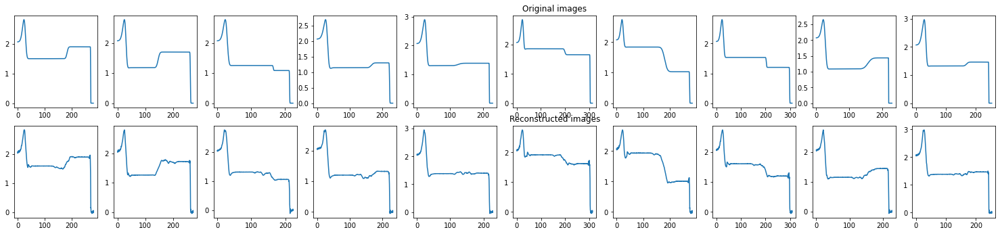

331
0.048189644
tensor(0.3065)


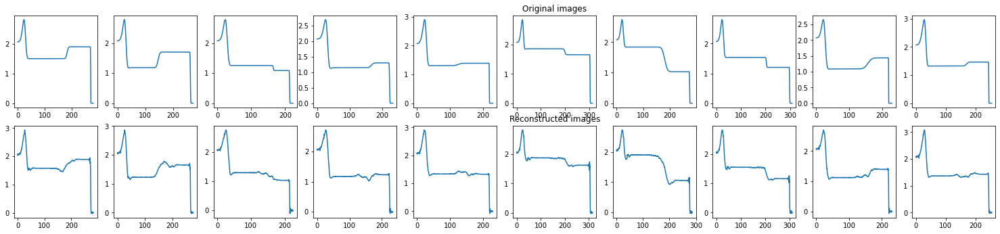

332
0.05664905
tensor(0.2952)


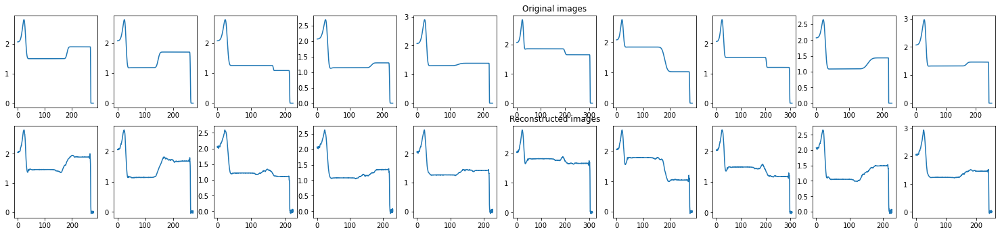

333
0.047779508
tensor(0.1934)


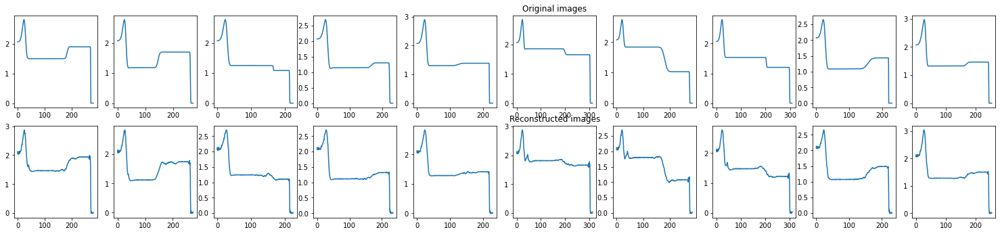

334
0.05816136
tensor(0.2807)


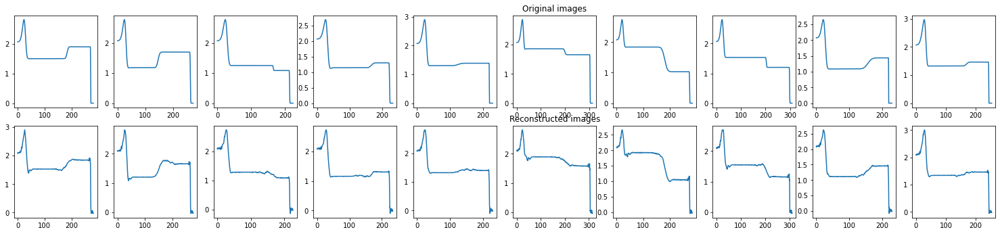

335
0.053608064
tensor(0.4362)


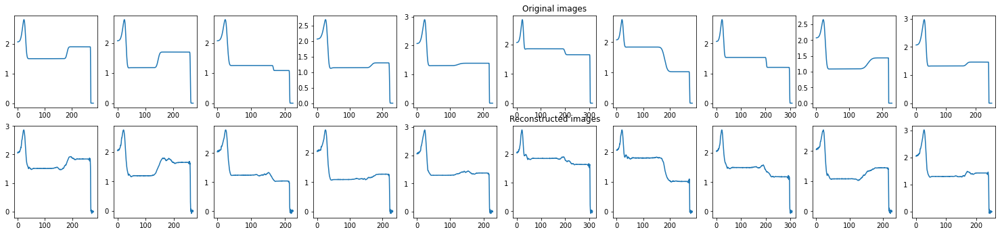

336
0.053180315
tensor(0.2850)


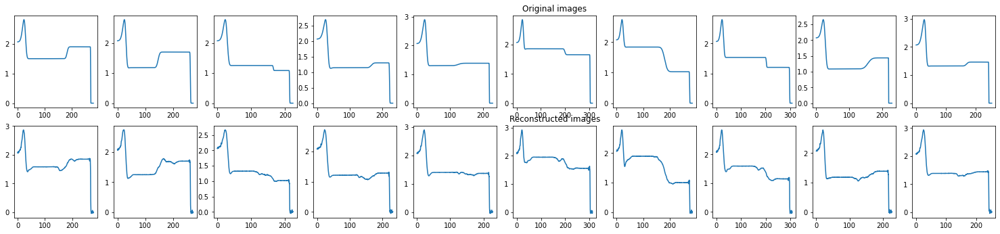

337
0.057023924
tensor(0.1971)


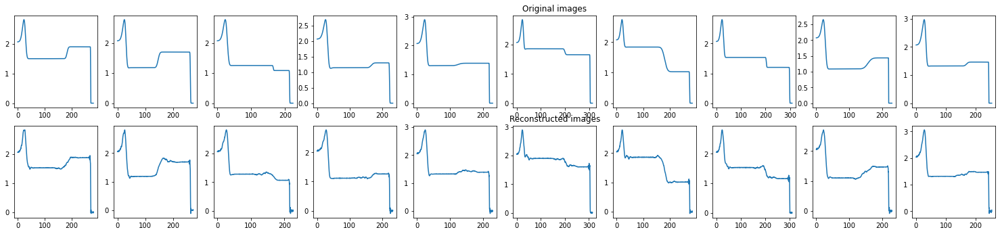

338
0.047068376
tensor(0.3388)


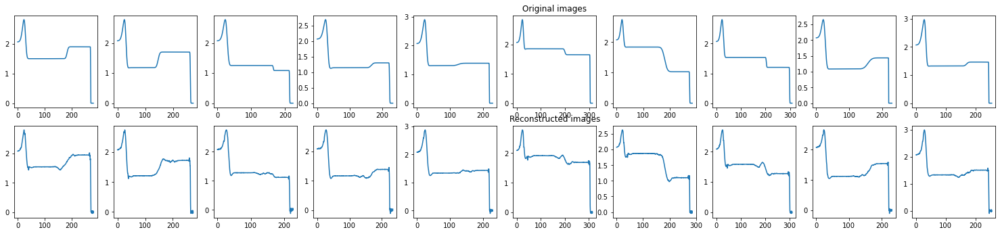

339
0.04464182
tensor(0.2267)


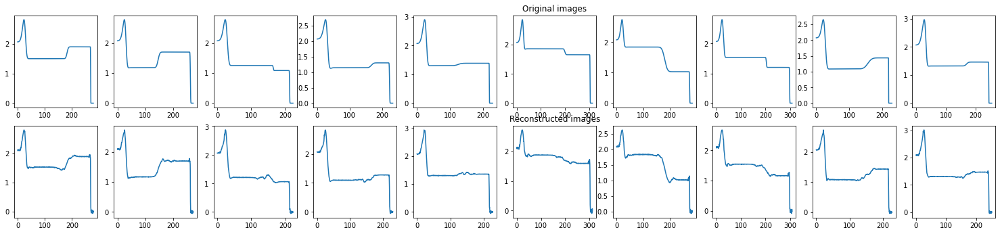

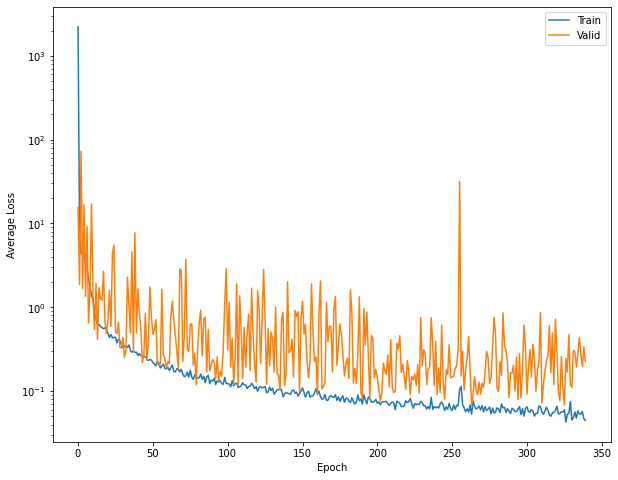

340
0.06594094
tensor(0.0938)


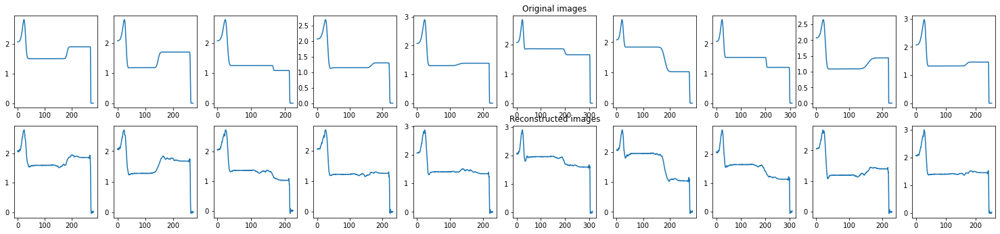

341
0.046667658
tensor(0.5328)


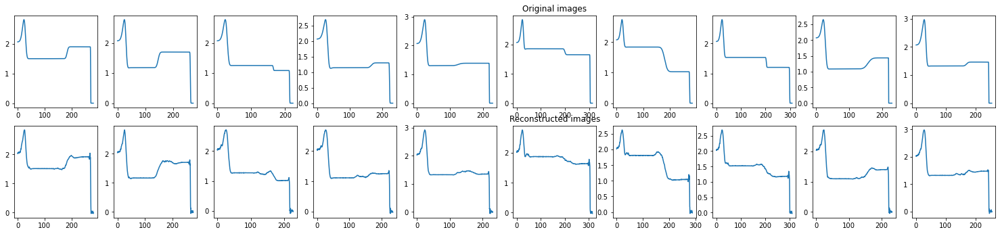

342
0.04707714
tensor(0.2286)


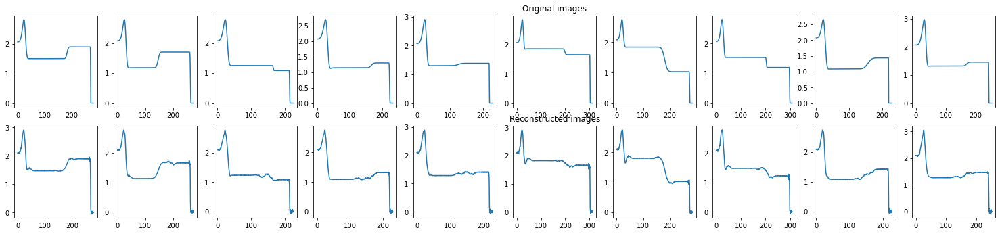

343
0.05047374
tensor(0.0921)


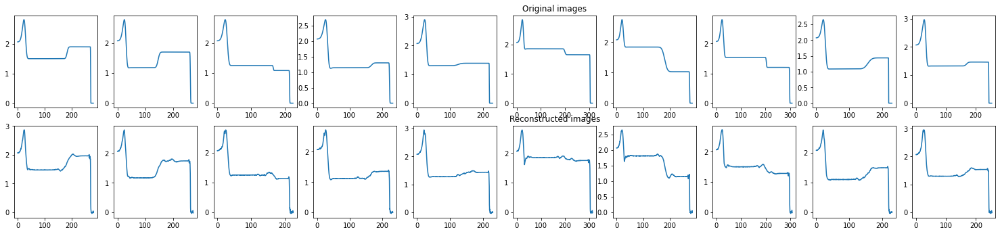

344
0.04322842
tensor(0.4593)


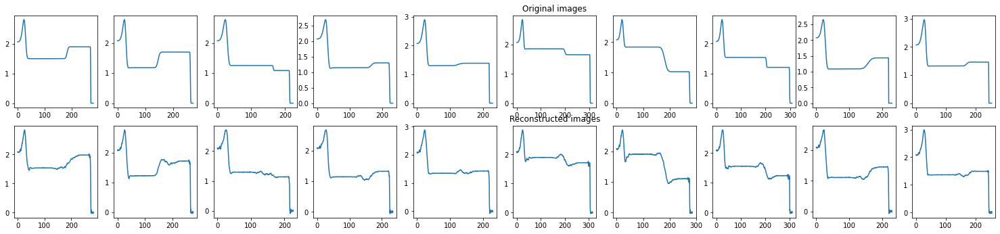

345
0.054469675
tensor(0.2032)


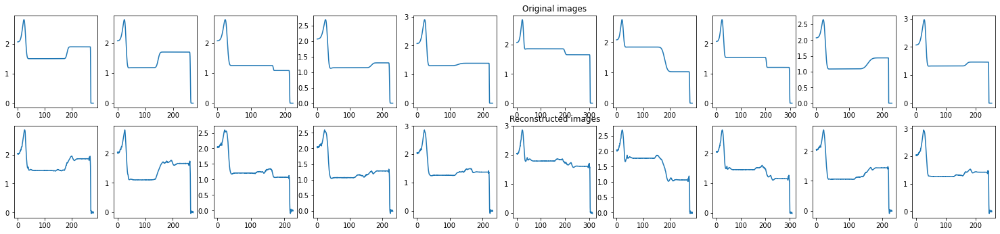

346
0.05146762
tensor(0.4806)


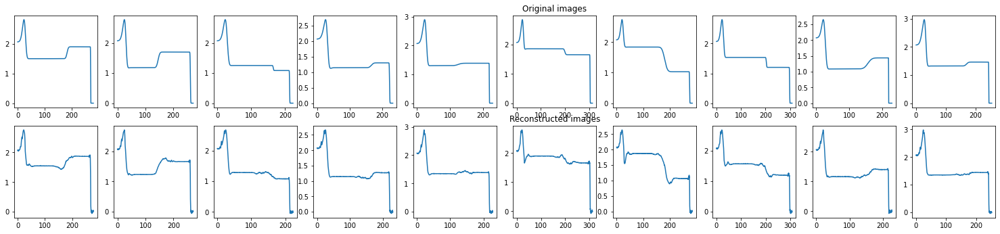

347
0.05117008
tensor(0.2197)


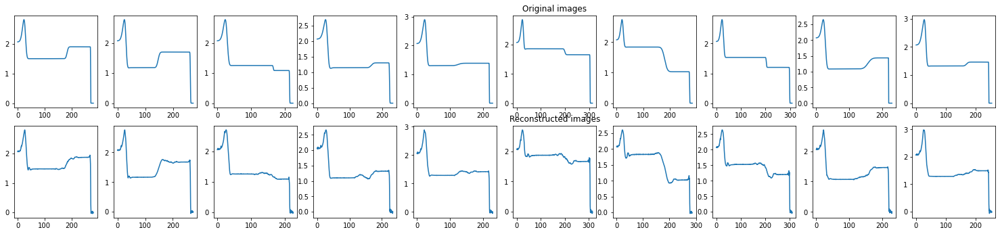

348
0.056285977
tensor(0.1020)


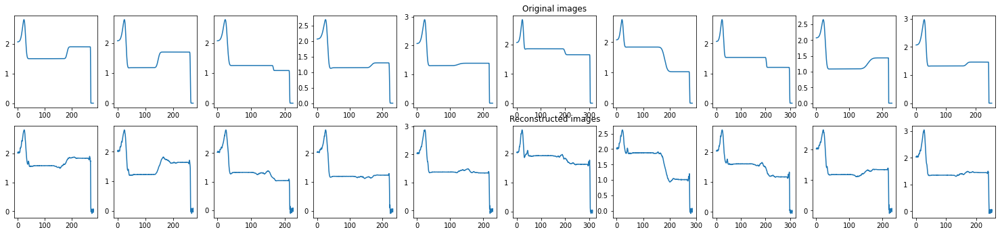

349
0.05287578
tensor(0.1676)


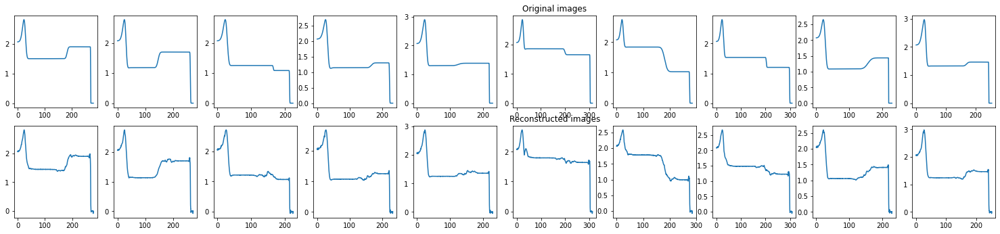

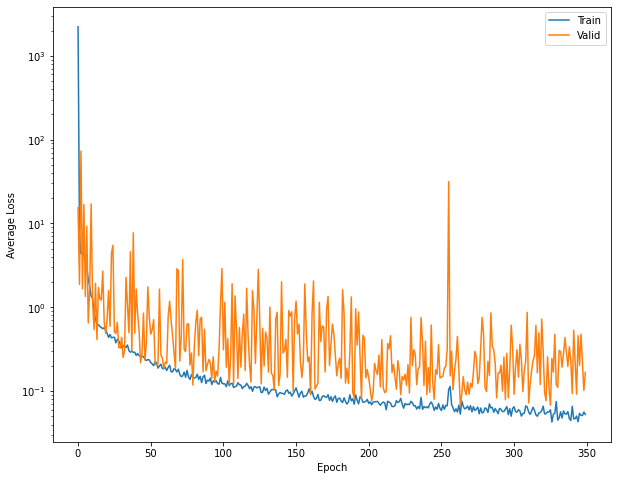

350
0.04627349
tensor(0.1127)


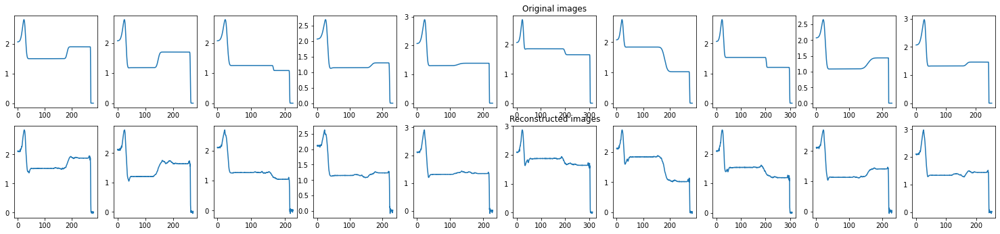

351
0.061913602
tensor(0.3470)


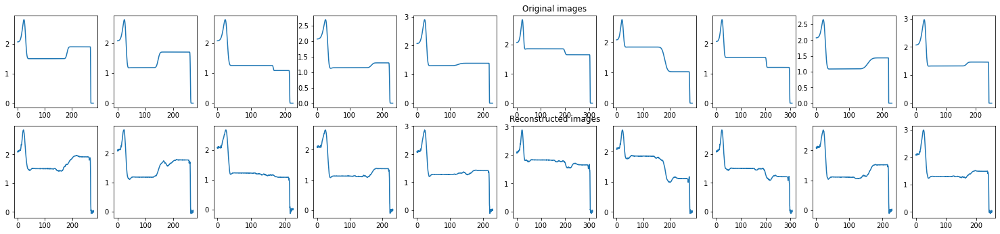

352
0.053525515
tensor(0.1477)


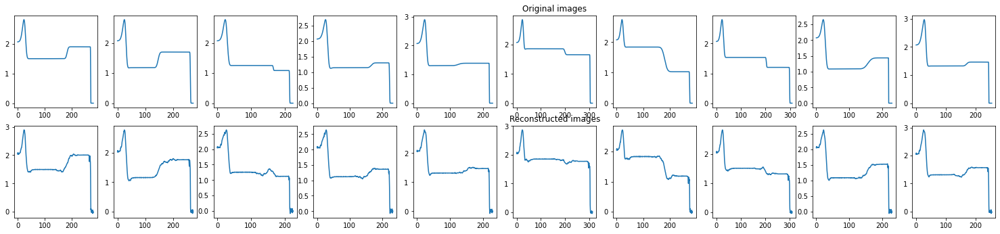

353
0.0652157
tensor(0.1222)


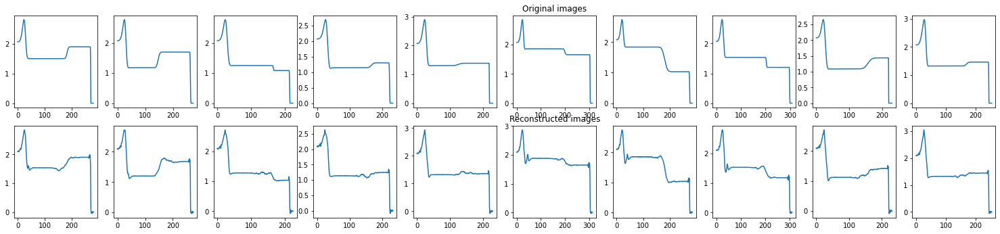

354
0.051005993
tensor(0.2483)


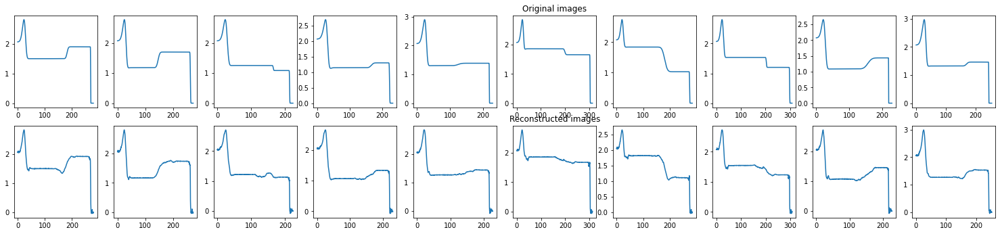

355
0.0497034
tensor(0.1586)


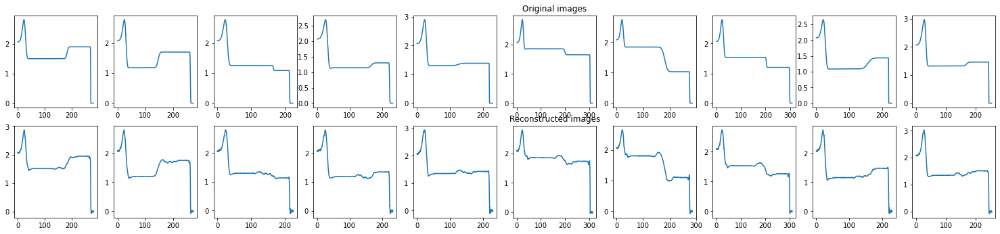

356
0.050935283
tensor(0.1322)


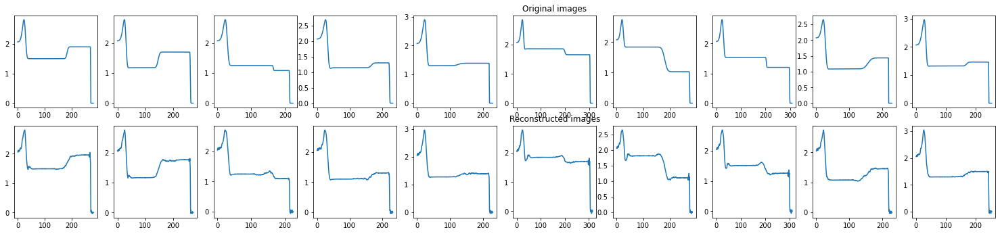

357
0.052200325
tensor(0.2856)


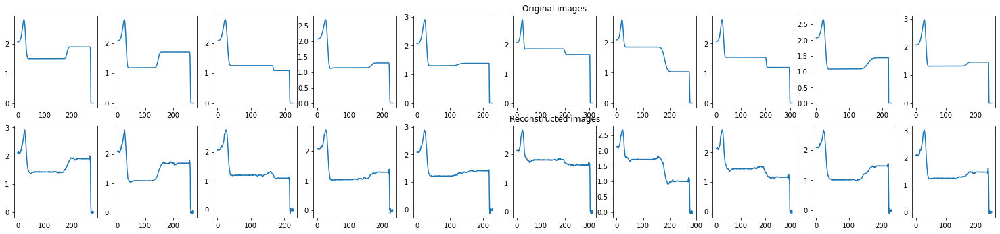

361
0.05585194
tensor(0.2426)


In [ ]:
num_epochs=400
#train and validate
diz_loss = {'train_loss':[],'val_loss':[]}
for epoch in range(num_epochs):
  if epoch % 10 ==0:
    # Plot losses
        plt.figure(figsize=(10,8))
        plt.semilogy(diz_loss['train_loss'], label='Train')
        plt.semilogy(diz_loss['val_loss'], label='Valid')
        plt.xlabel('Epoch')
        plt.ylabel('Average Loss')
        plt.legend()
        plt.show()

  print (epoch)
  train_loss = fit(Model,device,train_loader,loss_fn,optim)
  print(train_loss)
  val_loss = val(Model,device,valid_loader,loss_fn)
  print(val_loss)

  diz_loss['train_loss'].append(train_loss)
  diz_loss['val_loss'].append(val_loss)
  plot_outputs(Model,train_dataset,device,n=10)
  # if epoch > 40 and val_loss < 0.0009:
  #   plt.figure(figsize=(10,8))
  #   plt.semilogy(diz_loss['train_loss'], label='Train')
  #   plt.semilogy(diz_loss['val_loss'], label='Valid')
  #   plt.xlabel('Epoch')
  #   plt.ylabel('Average Loss')
  #   plt.legend()
  #   plt.show()
  #   plot_outputs(Model,train_dataset,device,n=10)
  #   break


In [ ]:

# Plot losses
plt.figure(figsize=(10,8))
plt.semilogy(diz_loss['train_loss'], label='Train')
plt.semilogy(diz_loss['val_loss'], label='Valid')
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
plt.legend()




plt.show()


In [ ]:
def plot_outputs2(Model,dataset,device,loss_fn, n=10, ):
  plt.figure(figsize=(26,5.5))
  train_loss= []
  for i in range(n):
    ax = plt.subplot(2,n,i+1)
    img, label =dataset[i]
    # label = label.to(device)
    label = label[:,np.newaxis,:].to(device) 
    img = img[:,np.newaxis,:].to(device) 
    #Notice that below i'm loading an image only, so it needs to be flatten
    #before entering the network
    # img = torch.flatten(img).to(device)
    # print(label[0], "hello")
    # print(img.shape)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(img)
      # decoded_img = decoded_img.reshape(-1,2, 308)
      # loss = loss_fn(decoded_img, label)
      # train_loss.append(loss.cpu().detach().numpy())
    # print(label)
    # print(np.mean(train_loss))
    print(label.shape)
    plt.plot(label.cpu()[0][0], label.cpu()[1][0]) 
    if i == n//2:
      ax.set_title('Original images')
    ax = plt.subplot(2, n, i + 1 + n)
    plt.plot(decoded_img.cpu()[0][0], decoded_img.cpu()[0][1]) 
    if i == n//2:
      ax.set_title('Reconstructed images')
  for i in range(len(dataset)):
    img, label =dataset[i]
    # label = label.to(device)
    label = label[np.newaxis,:,:].to(device) 
    img = img[:,np.newaxis,:].to(device) 
    #Notice that below i'm loading an image only, so it needs to be flatten
    #before entering the network
    # img = torch.flatten(img).to(device)
    # print(label[0], "hello")
    # print(img.shape)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(img)
      # decoded_img = decoded_img.reshape(-1,2, 308)
      # print(label.shape, decoded_img.shape)
      loss = loss_fn(decoded_img, label)
      train_loss.append(loss.cpu().detach().numpy())
  print(np.mean(train_loss))
  plt.show()

In [ ]:
plot_outputs2(Model,test_dataset,device,loss_fn, n=10)


In [ ]:
plot_outputs2(Model,valid_dataset,device,loss_fn, n=10)


In [ ]:
print(diz_loss["val_loss"][-1].item())

In [ ]:
import gdown
gdown.download_folder("https://drive.google.com/drive/u/0/folders/10zAh8Dqr9c-vSflP35e6KFh54XdYQ-mr")

In [ ]:

import os
directory = "npoutputsPoly/"
totalDataPoly = []
parametersPoly = []
count = 0
for i,filename in enumerate(os.listdir(directory)):
    f = os.path.join(directory, filename)
    if os.path.isfile(f):
        print(f[14:])
    currData = np.load(directory +f[14:])
    xptPoly = []
    yptPoly = []
    parametersPoly.append([])
    # print(f)
    for j in range(10):
        parametersPoly[count].append(int(f[26:32]))
    for j in range(len(currData)):
      xptPoly.append(currData[j][0])
      yptPoly.append(currData[j][1])
    np.array(xptPoly)
    np.array(yptPoly)
    # xpt2 = np.log10(xpt2)
    # ypt2 = np.log10(ypt2)
    totalDataPoly.append([xptPoly,yptPoly])
    # print(xptPoly)
    if i == 8:
      print(f)
    count += 1
totalDataPoly = np.stack(totalDataPoly)
for x in range(len(totalDataPoly)):
  plt.plot(totalDataPoly[x][0],totalDataPoly[x][1])
plt.xscale('log')
plt.yscale('log')
plt.show()
# print(totalDataPoly)
print(totalDataPoly.shape)
totalDataPoly = np.log10(totalDataPoly)
# for i in range(len(totalDataPoly)):
#     newTestingData = []
#     for j in range(len(totalDataPoly[i][0])):
#       newTestingData.append([totalDataPoly[i][0][j], totalDataPoly[i][1][j]])
#     for j in range(50):
#       newTestingData.append([totalDataPoly[i][-1][0], totalDataPoly[i][-1][1]])
#     newTestingData = np.stack(newTestingData)
#     print(newTestingData.shape)
#     window_size = 7
#     smoothed_data = smooth_points(newTestingData, window_size)
#     x_points = []
#     y_points = []
#     for j in range(len(newTestingData)):
#         x_points
#     totalDataPoly[i] = smoothed_data

In [ ]:
with open('NRRanges.npy', 'rb') as f:
    min_valXNR, max_valXNR, min_valYNR, max_valYNR = np.load(f)
x_pointsPoly = []
y_pointsPoly = []
for curve in totalDataPoly:
    x_pointsPoly.append(curve[0])
    y_pointsPoly.append(curve[1])
# min_valXPoly = float('inf')
# min_valYPoly = float('inf')
# max_valXPoly = -float('inf')
# max_valYPoly = -float('inf')
# for i in range(len(y_pointsPoly)):
#     min_valXPoly = min(min(x_pointsPoly[i]), min_valXPoly)
#     min_valYPoly = min(min(y_pointsPoly[i]), min_valYPoly)
#     max_valXPoly = max(max(x_pointsPoly[i]), max_valXPoly)
#     max_valYPoly = max(max(y_pointsPoly[i]), max_valYPoly)
for i in range(len(y_pointsPoly)):
    for j in range(len(y_pointsPoly[0])):
        x_pointsPoly[i][j] -= min_valXNR
        y_pointsPoly[i][j] -= min_valYNR
        x_pointsPoly[i][j] /= (max_valXNR - min_valXNR)
        y_pointsPoly[i][j] /= (max_valYNR - min_valYNR)
totalDataPoly2 = []
for i in range(len(y_pointsPoly)):
    totalDataPoly2.append([x_pointsPoly[i],y_pointsPoly[i]])
totalDataPoly2 = np.stack(totalDataPoly2)
totalDataPoly2.shape
# for x in range(totalDataPoly.shape[0]):
#   plt.plot(totalDataPoly[x][0],totalDataPoly[x][1])
# for i in range(len(totalDataPoly)):
#     diff = 1-totalDataPoly[i][1][0]
#     print(diff)
#     for j in range(len(totalDataPoly[0][0])):
#         totalDataPoly[i][1][j] += diff
for x in range(totalDataPoly.shape[0]):
  plt.plot(totalDataPoly[x][0],totalDataPoly[x][1])

In [ ]:
# totalDataPoly_log[:,0,:] = (totalDataPoly_log[:,0,:] - x_min)/(x_max - x_min)
# totalDataPoly_log[:,1,:] = (totalDataPoly_log[:,1,:] - y_min)/(y_max - y_min)
# for x in range(len(totalDataPoly_log)):
#   plt.plot(totalDataPoly_log[x][0],totalDataPoly_log[x][1])
# plt.show()
totalDataPoly.shape
RPoly = totalDataPoly[:,1]
# parametersPoly = []
# for i in range(21):
#   parametersPoly.append([0,0,0,0,0,0,0,0,0,0,0,0,0])
parametersPoly = np.stack(parametersPoly)
batch_size=64
RPoly_m = RPoly[:,np.newaxis,:]
xtrainPoly, ytrainPoly, xvalPoly, yvalPoly, xtestPoly, ytestPoly = \
dpre.split_input_arrays(RPoly_m,parametersPoly, size_split=0.9)
#Prepare data files, continuation
train_datasetPoly, valid_datasetPoly, test_datasetPoly, train_loaderPoly, valid_loaderPoly, test_loaderPoly = \
dpre.get_dataloaders_fromsplitarrays(xtrainPoly,ytrainPoly,xvalPoly,yvalPoly,xtestPoly,ytestPoly,batch_size=batch_size)
print(train_datasetPoly)

In [ ]:
def plot_outputs3(Model,dataset,device,loss_fn, n=10, ):
  plt.figure(figsize=(26,5.5))
  train_loss= []
  # print(max_valX, min_valX)
  for i in range(n):
    ax = plt.subplot(2,n,i+1)
    img, label =dataset[i]
    # label = label.to(device)
    # label = label[:,np.newaxis,:].to(device) 
    img = img[:,np.newaxis,:].to(device) 
    #Notice that below i'm loading an image only, so it needs to be flatten
    #before entering the network
    # img = torch.flatten(img).to(device)
    # print(label[0], "hello")
    # print(img.shape)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(img)
      # decoded_img = decoded_img.reshape(-1,2, 308)
      # loss = loss_fn(decoded_img, label)
      # train_loss.append(loss.cpu().detach().numpy())
    # print(label)
    # print(np.mean(train_loss))
    print(int(label[0].item()))
    plt.plot(img.cpu().numpy()[0][0])
    # plt.xscale('log')
    # plt.yscale('log')
    if i == n//2:
      ax.set_title('Neutron Reflectivity images')
    ax = plt.subplot(2, n, i + 1 + n)
#     for j in range(len(decoded_img[0][0])):
#         # x_points[i][j] -= min_valX
#         decoded_img[0][0][j] *= (max_valX - min_valX)

#         decoded_img[0][0][j] += min_valX
        
#         decoded_img[0][1][j] *= (max_valY- min_valY)
        
#         decoded_img[0][1][j] += min_valY
        # x_points[i][j] /= (max_valX - min_valX)
    plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1]) 
    if i == n//2:
      ax.set_title('SLD images')
  # print(np.mean(train_loss))
  plt.show()

In [ ]:
plot_outputs3(Model, train_datasetPoly, device, loss_fn)

In [ ]:
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(test_datasetPoly)):
    data, label = test_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    if label[0] == 202349:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202349_2d", decoded_img.cpu()[0])
        with open('SLD202349_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])
    # if label[0] == 202272:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202272_2d", decoded_img.cpu()[0])
    #     with open('SLD202272_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(train_datasetPoly)):
    data, label = train_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    if label[0] == 202349:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202349_2d", decoded_img.cpu()[0])
        with open('SLD202349_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])
    # if label[0] == 202272:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202272_2d", decoded_img.cpu()[0])
    #     with open('SLD202272_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(valid_datasetPoly)):
    data, label = valid_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    if label[0] == 202349:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202349_2d", decoded_img.cpu()[0])
        with open('SLD202349_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])

    # if label[0] == 202272:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202272_2d", decoded_img.cpu()[0])
    #     with open('SLD202272_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])




In [ ]:
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(test_datasetPoly)):
    data, label = test_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    if label[0] == 202293:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202293_2d", decoded_img.cpu()[0])
        with open('SLD202293_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])
    # if label[0] == 202272:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202272_2d", decoded_img.cpu()[0])
    #     with open('SLD202272_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(train_datasetPoly)):
    data, label = train_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    if label[0] == 202293:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202293_2d", decoded_img.cpu()[0])
        with open('SLD202293_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])
    # if label[0] == 202272:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202272_2d", decoded_img.cpu()[0])
    #     with open('SLD202272_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(valid_datasetPoly)):
    data, label = valid_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    if label[0] == 202293:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202293_2d", decoded_img.cpu()[0])
        with open('SLD202293_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])

    # if label[0] == 202272:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202272_2d", decoded_img.cpu()[0])
    #     with open('SLD202272_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])




In [ ]:
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(test_datasetPoly)):
    data, label = test_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    if label[0] == 202413:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202413_2d", decoded_img.cpu()[0])
        with open('SLD202413_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])
    # if label[0] == 202272:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202272_2d", decoded_img.cpu()[0])
    #     with open('SLD202272_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(train_datasetPoly)):
    data, label = train_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    if label[0] == 202413:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202413_2d", decoded_img.cpu()[0])
        with open('SLD202413_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])
    # if label[0] == 202272:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202272_2d", decoded_img.cpu()[0])
    #     with open('SLD202272_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(valid_datasetPoly)):
    data, label = valid_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    if label[0] == 202413:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202413_2d", decoded_img.cpu()[0])
        with open('SLD202413_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])

    # if label[0] == 202272:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202272_2d", decoded_img.cpu()[0])
    #     with open('SLD202272_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])




In [ ]:
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(test_datasetPoly)):
    data, label = test_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    # for j in range(len(decoded_img[0][0])):
    #     # x_points[i][j] -= min_valX
    #     decoded_img[0][0][j] *= (max_valX - min_valX)
    #     decoded_img[0][0][j] += min_valX
    #     decoded_img[0][1][j] *= (max_valY- min_valY)
    #     decoded_img[0][1][j] += min_valY
    if label[0] == 202307:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202307_2d", decoded_img.cpu()[0])
        with open('SLD202307_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])
    # if label[0] == 202272:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202272_2d", decoded_img.cpu()[0])
    #     with open('SLD202272_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(train_datasetPoly)):
    data, label = train_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    # for j in range(len(decoded_img[0][0])):
    #     # x_points[i][j] -= min_valX
    #     decoded_img[0][0][j] *= (max_valX - min_valX)
    #     decoded_img[0][0][j] += min_valX
    #     decoded_img[0][1][j] *= (max_valY- min_valY)
    #     decoded_img[0][1][j] += min_valY
    if label[0] == 202307:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202307_2d", decoded_img.cpu()[0])
        with open('SLD202307_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])
    # if label[0] == 202272:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202272_2d", decoded_img.cpu()[0])
    #     with open('SLD202272_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(valid_datasetPoly)):
    data, label = valid_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    # for j in range(len(decoded_img[0][0])):
    #     # x_points[i][j] -= min_valX
    #     decoded_img[0][0][j] *= (max_valX - min_valX)
    #     decoded_img[0][0][j] += min_valX
    #     decoded_img[0][1][j] *= (max_valY- min_valY)
    #     decoded_img[0][1][j] += min_valY
    if label[0] == 202307:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202307_2d", decoded_img.cpu()[0])
        with open('SLD202307_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])

    # if label[0] == 202272:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202272_2d", decoded_img.cpu()[0])
    #     with open('SLD202272_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])




In [40]:
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(test_datasetPoly)):
    data, label = test_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    # if label[0] == 202349:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202349_2d", decoded_img.cpu()[0])
    #     with open('SLD202349_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
    if label[0] == 202356:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202356_2d", decoded_img.cpu()[0])
        with open('SLD202356_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(train_datasetPoly)):
    data, label = train_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    # if label[0] == 202349:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202349_2d", decoded_img.cpu()[0])
    #     with open('SLD202349_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
    if label[0] == 202356:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202356_2d", decoded_img.cpu()[0])
        with open('SLD202356_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(valid_datasetPoly)):
    data, label = valid_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    # if label[0] == 202349:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202349_2d", decoded_img.cpu()[0])
    #     with open('SLD202349_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
    if label[0] == 202356:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202356_2d", decoded_img.cpu()[0])
        with open('SLD202356_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])





NameError: name 'max_valX' is not defined

In [ ]:
pip install refl1d

In [ ]:
pip install ipympl

In [ ]:
# # plt.cla()
import refl1d
from refl1d.names import *

def calculate_reflectivity_from_profile(q, z_step, sld, q_resolution=0.0294855):

    """

        Reflectivity calculation using refl1d from an array of microslabs

    """

    # sld = np.flip(sld)
    zeros = np.zeros(len(q))
    dq = q_resolution * q / 2.355
    # The QProbe object represents the beam

    probe = QProbe(q, dq, data=(zeros, zeros))
    sample = Slab(material=SLD(name='back', rho=sld[0], irho=0), interface=0)
    # Add each layer
    _prev_z = z_step[0]
    for i, _sld in enumerate(sld):
        if i>0:
            thickness = z_step[i] - _prev_z
            sample = sample | Slab(material=SLD(name='l_%d' % i, rho=_sld, irho=0),
                                                thickness=thickness,
                                                interface=0)
        _prev_z = z_step[i]
    probe.background = Parameter(value=0, name='background')
    expt = Experiment(probe=probe, sample=sample)
    a, r = expt.reflectivity()
    return a, r
# z, sld = np.load("File 202356_2d.npy")
# plt.plot(z, sld)
# plt.show()

# a, r = calculate_reflectivity_from_profile(np.logspace(np.log10(0.008101436040354381), np.log10(0.1975709062238298), num=308), z, sld)
# r = np.log10(r)
# np.save("File 202356_NR.npy", [a,r])

# for i in range(len(r)):
#     # x_pointsPoly[i][j] -= min_valXNR
#     r[i] -= min_valYNR
#     # x_pointsPoly[i][j] /= (max_valXNR - min_valXNR)
#     r[i] /= (max_valYNR - min_valYNR)
# for i in range(len(train_datasetPoly)):
#     data, label = train_datasetPoly[i]
#     # print(label[0])
#     if label[0] == 202356:
#         # print("hi")
#         # print(data[0])
#         # for j in range(len(r)):
#         #     r -= min_valYNR
#         #     r /= (max_valYNR - min_valYNR)
#         # print("hi")
#         # print(data[0])
#         plt.plot(r)
#         plt.plot(data.cpu().numpy()[0])
#         # print(data)
# plt.show()


# z2, sld2 = np.load("File 202437_2d.npy")

# plt.plot(z2, sld2)
# plt.show()
# a2, r2 = calculate_reflectivity_from_profile(np.logspace(np.log10(0.008101436040354381), np.log10(0.1975709062238298), num=308), z2, sld2)
# np.save("File 202437_NR.npy", [a2,r2])
# # plt.xscale('log')
# r2 = np.log10(r2)
# for i in range(len(r2)):
#     # x_pointsPoly[i][j] -= min_valXNR
#     r2[i] -= min_valYNR
#     # x_pointsPoly[i][j] /= (max_valXNR - min_valXNR)
#     r2[i] /= (max_valYNR - min_valYNR)
# for i in range(len(train_datasetPoly)):
#     data, label = train_datasetPoly[i]
#     # print(label[0])
#     if label[0] == 202437:
#         # print("hi")
#         plt.plot(r2)
#         plt.plot(data.cpu().numpy()[0])
# plt.show()

# z3, sld3 = np.load("File 202349_2d.npy")

# plt.plot(z3, sld3)
# plt.show()
# a3, r3 = calculate_reflectivity_from_profile(np.logspace(np.log10(0.008101436040354381), np.log10(0.1975709062238298), num=308), z3, sld3)
# np.save("File 202349_NR.npy", [a3,r3])
# r3 = np.log10(r3)
# for i in range(len(r3)):
#     # x_pointsPoly[i][j] -= min_valXNR
#     r3[i] -= min_valYNR
#     # x_pointsPoly[i][j] /= (max_valXNR - min_valXNR)
#     r3[i] /= (max_valYNR - min_valYNR)
# for i in range(len(train_datasetPoly)):
#     data, label = train_datasetPoly[i]
#     # print(label[0])
#     if label[0] == 202349:
#         # print("hi")
#         plt.plot(r3)
#         plt.plot(data.cpu().numpy()[0])
# plt.show()

# z4, sld4 = np.load("File 202413_2d.npy")

# plt.plot(z4, sld4)
# plt.show()
# a4, r4 = calculate_reflectivity_from_profile(np.logspace(np.log10(0.008101436040354381), np.log10(0.1975709062238298), num=308), z4, sld4)
# np.save("File 202413_NR.npy", [a4,r4])
# r4 = np.log10(r4)
# for i in range(len(r4)):
#     # x_pointsPoly[i][j] -= min_valXNR
#     r4[i] -= min_valYNR
#     # x_pointsPoly[i][j] /= (max_valXNR - min_valXNR)
#     r4[i] /= (max_valYNR - min_valYNR)
# for i in range(len(train_datasetPoly)):
#     data, label = train_datasetPoly[i]
#     # print(label[0])
#     if label[0] == 202413:
#         # print("hi")
#         plt.plot(r4)
#         plt.plot(data.cpu().numpy()[0])
# plt.show()

# z5, sld5 = np.load("File 202307_2d.npy")

# plt.plot(z5, sld5)
# plt.show()
# a5, r5 = calculate_reflectivity_from_profile(np.logspace(np.log10(0.008101436040354381), np.log10(0.1975709062238298), num=308), z5, sld5)
# np.save("File 202307_NR.npy", [a5,r5])
# r5 = np.log10(r5)
# for i in range(len(r5)):
#     # x_pointsPoly[i][j] -= min_valXNR
#     r5[i] -= min_valYNR
#     # x_pointsPoly[i][j] /= (max_valXNR - min_valXNR)
#     r5[i] /= (max_valYNR - min_valYNR)
# for i in range(len(test_datasetPoly)):
#     data, label = test_datasetPoly[i]
#     # print(label[0])
#     if label[0] == 202307:
#         # print("hi")
#         plt.plot(r5)
#         plt.plot(data.cpu().numpy()[0])
# plt.show()
# # z4, sld4 = np.load("File 202293_2d.npy")

# # plt.plot(z4, sld4)
# # plt.show()
# # a4, r4 = calculate_reflectivity_from_profile(np.logspace(np.log10(0.008101436040354381), np.log10(0.1975709062238298), num=308), z4, sld4)
# # np.save("File 202293_NR.npy", [a3,r3])
# # r4 = np.log10(r4)
# # for i in range(len(r4)):
# #     # x_pointsPoly[i][j] -= min_valXNR
# #     r4[i] -= min_valYNR
# #     # x_pointsPoly[i][j] /= (max_valXNR - min_valXNR)
# #     r4[i] /= (max_valYNR - min_valYNR)
# # for i in range(len(train_datasetPoly)):
# #     data, label = train_datasetPoly[i]
# #     # print(label[0])
# #     if label[0] == 202437:
# #         # print("hi")
# #         plt.plot(r4)
# #         plt.plot(data.cpu().numpy()[0])
# # plt.show()

In [ ]:
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(test_datasetPoly)):
    data, label = test_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    # for j in range(len(decoded_img[0][0])):
    #     # x_points[i][j] -= min_valX
    #     decoded_img[0][0][j] *= (max_valX - min_valX)
    #     decoded_img[0][0][j] += min_valX
    #     decoded_img[0][1][j] *= (max_valY- min_valY)
    #     decoded_img[0][1][j] += min_valY
    # if label[0] == 202349:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202349_2d", decoded_img.cpu()[0])
    #     with open('SLD202349_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
    # if label[0] == 202356:
    # print(decoded_img[0][0].cpu().numpy())
    a, r = calculate_reflectivity_from_profile(np.logspace(np.log10(0.008101436040354381), np.log10(0.1975709062238298), num=308), decoded_img[0][0].cpu().numpy(), decoded_img[0][1].cpu().numpy())
    r = np.log10(r)

    for i in range(len(r)):
        # x_pointsPoly[i][j] -= min_valXNR
        r[i] -= min_valYNR
        # x_pointsPoly[i][j] /= (max_valXNR - min_valXNR)
        r[i] /= (max_valYNR - min_valYNR)
        
    print(int(label[0].item()))
    plt.plot(data.cpu().numpy()[0][0])
    plt.plot(r)
    plt.show()
    plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    plt.show()

#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(train_datasetPoly)):
    data, label = train_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    # for j in range(len(decoded_img[0][0])):
    #     # x_points[i][j] -= min_valX
    #     decoded_img[0][0][j] *= (max_valX - min_valX)
    #     decoded_img[0][0][j] += min_valX
    #     decoded_img[0][1][j] *= (max_valY- min_valY)
    #     decoded_img[0][1][j] += min_valY
    a, r = calculate_reflectivity_from_profile(np.logspace(np.log10(0.008101436040354381), np.log10(0.1975709062238298), num=308), decoded_img[0][0].cpu().numpy(), decoded_img[0][1].cpu().numpy())
    r = np.log10(r)

    for i in range(len(r)):
        # x_pointsPoly[i][j] -= min_valXNR
        r[i] -= min_valYNR
        # x_pointsPoly[i][j] /= (max_valXNR - min_valXNR)
        r[i] /= (max_valYNR - min_valYNR)
        
    print(int(label[0].item()))
    plt.plot(data.cpu().numpy()[0][0])
    plt.plot(r)
    plt.show()
    plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    # np.save("File 202272_2d", decoded_img.cpu()[0])
    # with open('SLD202272_2d.txt', 'a') as f:
    #     np.savetxt(f, decoded_img.cpu()[0])
    plt.show()
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(valid_datasetPoly)):
    data, label = valid_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    # for j in range(len(decoded_img[0][0])):
    #     # x_points[i][j] -= min_valX
    #     decoded_img[0][0][j] *= (max_valX - min_valX)
    #     decoded_img[0][0][j] += min_valX
    #     decoded_img[0][1][j] *= (max_valY- min_valY)
    #     decoded_img[0][1][j] += min_valY
    a, r = calculate_reflectivity_from_profile(np.logspace(np.log10(0.008101436040354381), np.log10(0.1975709062238298), num=308), decoded_img[0][0].cpu().numpy(), decoded_img[0][1].cpu().numpy())
    r = np.log10(r)

    for i in range(len(r)):
        # x_pointsPoly[i][j] -= min_valXNR
        r[i] -= min_valYNR
        # x_pointsPoly[i][j] /= (max_valXNR - min_valXNR)
        r[i] /= (max_valYNR - min_valYNR)
        
    print(int(label[0].item()))
    plt.plot(data.cpu().numpy()[0][0])
    plt.plot(r)
    plt.show()
    plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    # np.save("File 202272_2d", decoded_img.cpu()[0])
    # with open('SLD202272_2d.txt', 'a') as f:
    #     np.savetxt(f, decoded_img.cpu()[0])
    plt.show()





In [ ]:

for i in range(len(train_datasetPoly)):
    data, label = train_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    # Model.eval().to(device)
    # with torch.no_grad():
    #   decoded_img  = Model(data)
    #   # decoded_img = decoded_img.reshape(-1,2, 308)
    # for j in range(len(decoded_img[0][0])):
    #     # x_points[i][j] -= min_valX
    #     decoded_img[0][0][j] *= (max_valX - min_valX)
    #     decoded_img[0][0][j] += min_valX
    #     decoded_img[0][1][j] *= (max_valY- min_valY)
    #     decoded_img[0][1][j] += min_valY
    # if label[0] == 202349:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202349_2d", decoded_img.cpu()[0])
    #     with open('SLD202349_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
    if label[0] == 202272:
        # plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        # np.save("File 202272_2d", decoded_img.cpu()[0])
        # with open('SLD202272_2d.txt', 'a') as f:
        #     np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])
        file202272 = data.cpu().numpy()[0][0]
        # print('hi')
    if label[0] == 202356:
        # plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        # np.save("File 202272_2d", decoded_img.cpu()[0])
        # with open('SLD202272_2d.txt', 'a') as f:
        #     np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])
        file202356 = data.cpu().numpy()[0][0]
        # print('hi')
    if label[0] == 202369:
        # plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        # np.save("File 202272_2d", decoded_img.cpu()[0])
        # with open('SLD202272_2d.txt', 'a') as f:
        #     np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])
        file202369 = data.cpu().numpy()[0][0]
        # print('hi')
# print(file202272)
# print(loss_fn(file202356, file202272))
# print(torch.nn.MSELoss(file202356, file202272))

In [ ]:

#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(test_datasetPoly)):
    data, label = test_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    # if label[0] == 202349:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202349_2d", decoded_img.cpu()[0])
    #     with open('SLD202349_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
    if label[0] == 202437:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202437_2d", decoded_img.cpu()[0])
        with open('SLD202437_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(train_datasetPoly)):
    data, label = train_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    # if label[0] == 202349:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202349_2d", decoded_img.cpu()[0])
    #     with open('SLD202349_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
    if label[0] == 202437:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202437_2d", decoded_img.cpu()[0])
        with open('SLD202437_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])
#change test_datasetPoly to valid_datasetPoly or train_datasetPoly, depending on what dataset it is in
for i in range(len(valid_datasetPoly)):
    data, label = valid_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    # if label[0] == 202349:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202349_2d", decoded_img.cpu()[0])
    #     with open('SLD202349_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
    if label[0] == 202293:
        plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
        np.save("File 202437_2d", decoded_img.cpu()[0])
        with open('SLD202437_2d.txt', 'a') as f:
            np.savetxt(f, decoded_img.cpu()[0])
        plt.show()
        plt.plot(data.cpu().numpy()[0][0])





In [ ]:
cd Models


In [ ]:
torch.save(Model, "Model 14")

In [ ]:
cd ..

In [ ]:
# torch.save(Model, "Model 4")

In [ ]:
# torch.save(Model, "Model 5")

In [ ]:
# torch.save(Model, "Model 7")

In [ ]:
# torch.save(Model, "Model 10")

In [ ]:
# model = torch.load("ML Models")

In [ ]:
# print(model)

In [ ]:
# Model = torch.load("Model 10")

In [ ]:
for i in range(len(valid_datasetPoly)):
    data, label = valid_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    # if label[0] == 202349:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202349_2d", decoded_img.cpu()[0])
    #     with open('SLD202349_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
    # if label[0] == 202356:
    # print(decoded_img[0][0].cpu().numpy())
    a, r = calculate_reflectivity_from_profile(np.logspace(np.log10(0.008101436040354381), np.log10(0.1975709062238298), num=308), decoded_img[0][0].cpu().numpy(), decoded_img[0][1].cpu().numpy())
    r = np.log10(r)

    for i in range(len(r)):
        # x_pointsPoly[i][j] -= min_valXNR
        r[i] -= min_valYNR
        # x_pointsPoly[i][j] /= (max_valXNR - min_valXNR)
        r[i] /= (max_valYNR - min_valYNR)
    # if label[0] == 202454:
    plt.style.use("seaborn-darkgrid")
    plt.plot(decoded_img.cpu()[0][0], decoded_img.cpu()[0][1], linewidth=4, color="g")
    plt.xlabel("z [Å]")
    plt.ylabel("SLD [$10^{-6}Å^{-2}$]")
    plt.title("Scattering Length Density Profile")
    plt.savefig(str(int(label[0].item())) + ' SLD Graph.jpeg')
    plt.show()
    a, r = calculate_reflectivity_from_profile(np.logspace(np.log10(0.008101436040354381), np.log10(0.1975709062238298), num=308), decoded_img.cpu()[0][0], decoded_img.cpu()[0][1])
    other = np.load("../Neutron_Reflect/npoutputsPoly/np_out_REFL_"+str(int(label[0].item()))+"_combined_data_auto.npy")
    # # plt.plot(m.q,)
    yPoints = []
    xPoints = []
    for i in range(len(other)):
        xPoints.append(other[i][0])
        yPoints.append(other[i][1])
    plt.plot(a,r, linewidth=2, color='r', label="Reproduced NR curve from SLD profile")
    plt.scatter(xPoints, yPoints, linewidth=0.01, label="Original Experimental NR curve")
    # plt.xscale("log")
    plt.xlabel("q [1/Å]")
    plt.ylabel("r [Å]")
    plt.title("Neutron Reflectivity")
    plt.yscale("log")
    plt.legend()
    # print(data)
    plt.savefig(str(int(label[0].item()))+' Neutron Reflectivity Graph.jpeg')
    plt.show()

for i in range(len(train_datasetPoly)):
    data, label = train_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    # if label[0] == 202349:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202349_2d", decoded_img.cpu()[0])
    #     with open('SLD202349_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
    # if label[0] == 202356:
    # print(decoded_img[0][0].cpu().numpy())
    a, r = calculate_reflectivity_from_profile(np.logspace(np.log10(0.008101436040354381), np.log10(0.1975709062238298), num=308), decoded_img[0][0].cpu().numpy(), decoded_img[0][1].cpu().numpy())
    r = np.log10(r)

    for i in range(len(r)):
        # x_pointsPoly[i][j] -= min_valXNR
        r[i] -= min_valYNR
        # x_pointsPoly[i][j] /= (max_valXNR - min_valXNR)
        r[i] /= (max_valYNR - min_valYNR)
    # if label[0] == 202454:
    plt.style.use("seaborn-darkgrid")
    plt.plot(decoded_img.cpu()[0][0], decoded_img.cpu()[0][1], linewidth=4, color="g")
    plt.xlabel("z [Å]")
    plt.ylabel("SLD [$10^{-6}Å^{-2}$]")
    plt.title("Scattering Length Density Profile")
    plt.savefig(str(int(label[0].item()))+ ' SLD Graph.jpeg')
    plt.show()
    a, r = calculate_reflectivity_from_profile(np.logspace(np.log10(0.008101436040354381), np.log10(0.1975709062238298), num=308), decoded_img.cpu()[0][0], decoded_img.cpu()[0][1])
    other = np.load("../Neutron_Reflect/npoutputsPoly/np_out_REFL_"+str(int(label[0].item()))+"_combined_data_auto.npy")
    # # plt.plot(m.q,)
    yPoints = []
    xPoints = []
    for i in range(len(other)):
        xPoints.append(other[i][0])
        yPoints.append(other[i][1])
    plt.plot(a,r, linewidth=2, color='r', label="Reproduced NR curve from SLD profile")
    plt.scatter(xPoints, yPoints, linewidth=0.01, label="Original Experimental NR curve")
    # plt.xscale("log")
    plt.xlabel("q [1/Å]")
    plt.ylabel("r [Å]")
    plt.title("Neutron Reflectivity")
    plt.yscale("log")
    plt.legend()
    # print(data)
    plt.savefig(str(int(label[0].item()))+' Neutron Reflectivity Graph.jpeg')
    plt.show()

for i in range(len(test_datasetPoly)):
    data, label = test_datasetPoly[i]
    data = data[:,np.newaxis,:].to(device)
    Model.eval().to(device)
    with torch.no_grad():
      decoded_img  = Model(data)
      # decoded_img = decoded_img.reshape(-1,2, 308)
    for j in range(len(decoded_img[0][0])):
        # x_points[i][j] -= min_valX
        decoded_img[0][0][j] *= (max_valX - min_valX)
        decoded_img[0][0][j] += min_valX
        decoded_img[0][1][j] *= (max_valY- min_valY)
        decoded_img[0][1][j] += min_valY
    # if label[0] == 202349:
    #     plt.plot(decoded_img.cpu()[0][0],decoded_img.cpu()[0][1])
    #     np.save("File 202349_2d", decoded_img.cpu()[0])
    #     with open('SLD202349_2d.txt', 'a') as f:
    #         np.savetxt(f, decoded_img.cpu()[0])
    # if label[0] == 202356:
    # print(decoded_img[0][0].cpu().numpy())
    a, r = calculate_reflectivity_from_profile(np.logspace(np.log10(0.008101436040354381), np.log10(0.1975709062238298), num=308), decoded_img[0][0].cpu().numpy(), decoded_img[0][1].cpu().numpy())
    r = np.log10(r)

    for i in range(len(r)):
        # x_pointsPoly[i][j] -= min_valXNR
        r[i] -= min_valYNR
        # x_pointsPoly[i][j] /= (max_valXNR - min_valXNR)
        r[i] /= (max_valYNR - min_valYNR)
    # if label[0] == 202454:
    plt.style.use("seaborn-darkgrid")
    plt.plot(decoded_img.cpu()[0][0], decoded_img.cpu()[0][1], linewidth=4, color="g")
    plt.xlabel("z [Å]")
    plt.ylabel("SLD [$10^{-6}Å^{-2}$]")
    plt.title("Scattering Length Density Profile")
    plt.savefig(str(int(label[0].item())) + ' SLD Graph.jpeg')
    plt.show()
    a, r = calculate_reflectivity_from_profile(np.logspace(np.log10(0.008101436040354381), np.log10(0.1975709062238298), num=308), decoded_img.cpu()[0][0], decoded_img.cpu()[0][1])
    other = np.load("../Neutron_Reflect/npoutputsPoly/np_out_REFL_"+str(int(label[0].item()))+"_combined_data_auto.npy")
    # # plt.plot(m.q,)
    yPoints = []
    xPoints = []
    for i in range(len(other)):
        xPoints.append(other[i][0])
        yPoints.append(other[i][1])
    plt.plot(a,r, linewidth=2, color='r', label="Reproduced NR curve from SLD profile")
    plt.scatter(xPoints, yPoints, linewidth=0.01, label="Original Experimental NR curve")
    # plt.xscale("log")
    plt.xlabel("q [1/Å]")
    plt.ylabel("r [Å]")
    plt.title("Neutron Reflectivity")
    plt.yscale("log")
    plt.legend()
    # print(data)
    plt.savefig(str(int(label[0].item()))+' Neutron Reflectivity Graph.jpeg')
    plt.show()



In [ ]:
ls

In [ ]:
torch.save(Model.state_dict(), "ModelPoly21")